In [1]:
# !pip install networkx pandas torch torch-geometric
# !pip install torch-scatter
# !pip install optuna

In [2]:
import random
import time
from datetime import datetime
import collections
import csv

# Numerical and data manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt

# Network analysis
import networkx as nx

# Machine learning utilities
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score,  roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler

# PyTorch core
import torch
import torch.nn as nn
import torch.nn.functional as F

# PyTorch Geometric
from torch_geometric.data import Data, HeteroData
from torch_geometric.utils import from_networkx
from torch_geometric.nn import (
    HeteroConv,
    GATv2Conv,
    TransformerConv,
    GCNConv,
    MessagePassing
)
from torch_geometric.loader import DataLoader
from collections import Counter, defaultdict

#optuna
import optuna

/home/rshrestha1/.local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
class HeteroGCNEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        
        self.dropout = nn.Dropout(0.05)
        
        self.conv1 = HeteroConv({
            ('company', 'supply', 'company'): GATv2Conv(in_channels, hidden_channels, heads=12, concat=False),
            ('company', 'boardex', 'company'): GATv2Conv(in_channels, hidden_channels, heads=12, concat=False),
            ('company', 'competition', 'company'): GATv2Conv(in_channels, hidden_channels, heads=12, concat=False),
        }, aggr='cat')

        self.conv2 = HeteroConv({
            ('company', 'supply', 'company'): GATv2Conv(hidden_channels * 3, out_channels, heads=1, concat=False),
            ('company', 'boardex', 'company'): GATv2Conv(hidden_channels * 3, out_channels, heads=1, concat=False),
            ('company', 'competition', 'company'): GATv2Conv(hidden_channels * 3, out_channels, heads=1, concat=False),
        }, aggr='cat')

    def forward(self, x_dict, edge_index_dict):
        x_dict = self.conv1(x_dict, edge_index_dict)
        x_dict = {k: F.relu(v) for k, v in x_dict.items()}
        x_dict = {k: self.dropout(v) for k, v in x_dict.items()}
        x_dict = self.conv2(x_dict, edge_index_dict)
        return x_dict
        

class NodeClassifier(nn.Module):
    def __init__(self, out_channels, num_classes):
        super().__init__()
        self.dropout = nn.Dropout(0.01)
        self.fc = nn.Linear(out_channels * 3, out_channels)
        self.fc1 = nn.Linear(out_channels, num_classes)

    def forward(self, x):
        x = self.fc(x)
        x = self.dropout(x)
        return self.fc1(x)

In [4]:
def train_model(encoder, classifier, data, optimizer, criterion, device):
    encoder.train()
    classifier.train()
    optimizer.zero_grad()
    data = data.to(device)

    x_dict, edge_index_dict = data.x_dict, data.edge_index_dict
    y = data['company'].y
    train_mask = data['company'].train_mask

    x_dict = {k: v.to(device) for k, v in x_dict.items()}
    edge_index_dict = {k: v.to(device) for k, v in edge_index_dict.items()}
    y = y.to(device)

    node_repr = encoder(x_dict, edge_index_dict)
    # x_gcn = node_repr['company']                 # (num_nodes, gcn_out_dim)
    # x_raw = data['company'].raw_feat.to(x_gcn.device)  # (num_nodes, raw_feat_dim)
    
    # x_combined = torch.cat([x_gcn, x_raw], dim=1)  # Concatenate along feature dim
    # logits = classifier(x_combined)
    logits = node_repr['company']

    loss = criterion(logits[train_mask], y[train_mask])
    loss.backward()
    optimizer.step()

    with torch.no_grad():
        probs = torch.softmax(logits[train_mask], dim=1)
        preds = logits[train_mask].argmax(dim=1)

        y_true = y[train_mask].cpu().numpy()
        y_pred = preds.cpu().numpy()
        y_probs = probs.cpu().numpy()

        acc = accuracy_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred, average='macro') if len(torch.unique(y[train_mask])) > 1 else 0.0

        # if probs.size(1) == 2:
        #     auc = roc_auc_score(y_true, y_probs[:, 1])
        #     fpr, tpr, _ = roc_curve(y_true, y_probs[:, 1])
        # else:
        #     auc = roc_auc_score(y_true, y_probs, multi_class='ovr', average='macro')
        #     fpr, tpr = None, None

    return loss.item(), acc, f1


def validate_model(encoder, classifier, data, criterion, device):
    encoder.eval()
    classifier.eval()
    data = data.to(device)

    with torch.no_grad():
        x_dict, edge_index_dict = data.x_dict, data.edge_index_dict
        y = data['company'].y
        val_mask = data['company'].val_mask

        x_dict = {k: v.to(device) for k, v in x_dict.items()}
        edge_index_dict = {k: v.to(device) for k, v in edge_index_dict.items()}
        y = y.to(device)

        node_repr = encoder(x_dict, edge_index_dict)
        # x_gcn = node_repr['company']                 # (num_nodes, gcn_out_dim)
        # x_raw = data['company'].raw_feat.to(x_gcn.device)  # (num_nodes, raw_feat_dim)
        
        # x_combined = torch.cat([x_gcn, x_raw], dim=1)  # Concatenate along feature dim
        # logits = classifier(x_combined)

        logits = node_repr['company']

        loss = criterion(logits[val_mask], y[val_mask])
        probs = torch.softmax(logits[val_mask], dim=1)
        preds = logits[val_mask].argmax(dim=1)

        y_true = y[val_mask].cpu().numpy()
        y_pred = preds.cpu().numpy()
        y_probs = probs.cpu().numpy()

        acc = accuracy_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred, average='macro') if len(torch.unique(y[val_mask])) > 1 else 0.0

        # if probs.size(1) == 2:
        #     auc = roc_auc_score(y_true, y_probs[:, 1])
        #     fpr, tpr, _ = roc_curve(y_true, y_probs[:, 1])
        # else:
        #     auc = roc_auc_score(y_true, y_probs, multi_class='ovr', average='macro')
        #     fpr, tpr = None, None

    return loss.item(), acc, f1


def test_model(encoder, classifier, data, device):
    encoder.eval()
    classifier.eval()
    data = data.to(device)

    with torch.no_grad():
        x_dict, edge_index_dict = data.x_dict, data.edge_index_dict
        y = data['company'].y
        test_mask = data['company'].test_mask  # use test_mask if available

        x_dict = {k: v.to(device) for k, v in x_dict.items()}
        edge_index_dict = {k: v.to(device) for k, v in edge_index_dict.items()}
        y = y.to(device)

        node_repr = encoder(x_dict, edge_index_dict)
        # x_gcn = node_repr['company']                 # (num_nodes, gcn_out_dim)
        # x_raw = data['company'].raw_feat.to(x_gcn.device)  # (num_nodes, raw_feat_dim)
        
        # x_combined = torch.cat([x_gcn, x_raw], dim=1)  # Concatenate along feature dim
        # logits = classifier(x_combined)

        logits = node_repr['company']

        probs = torch.softmax(logits[test_mask], dim=1)
        preds = logits[test_mask].argmax(dim=1)

        y_true = y[test_mask].cpu().numpy()
        y_pred = preds.cpu().numpy()
        y_probs = probs.cpu().numpy()

        acc = accuracy_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred, average='macro') if len(torch.unique(y[test_mask])) > 1 else 0.0

        # if probs.size(1) == 2:
        #     auc = roc_auc_score(y_true, y_probs[:, 1])
        #     fpr, tpr, _ = roc_curve(y_true, y_probs[:, 1])
        # else:
        #     auc = roc_auc_score(y_true, y_probs, multi_class='ovr', average='macro')
        #     fpr, tpr = None, None

    return acc, f1

In [5]:
def train_test(encoder, classifier, data, optimizer, criterion, device, epochs=1000, patience=100):
    best_val_loss = float('inf')
    counter = 0
    best_encoder = None
    best_classifier = None
    best_train_acc = None
    best_f1 = None

    train_losses, val_losses = [], []
    train_accs, val_accs = [], []
    train_f1s, val_f1s = [], []

    start_time = time.time()

    for epoch in range(epochs):
        train_loss, train_acc, train_f1 = train_model(encoder, classifier, data, optimizer, criterion, device)
        val_loss, val_acc, val_f1 = validate_model(encoder, classifier, data, criterion, device)

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accs.append(train_acc)
        val_accs.append(val_acc)
        train_f1s.append(train_f1)
        val_f1s.append(val_f1)

        if (epoch + 1) % 10 == 0:
            print(f'Epoch: {epoch+1:03d}, '
                  f'Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, '
                  f'Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}')

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_train_acc = train_acc
            best_f1 = val_f1
            counter = 0
            best_encoder = encoder.state_dict()
            best_classifier = classifier.state_dict()
        else:
            counter += 1
            if counter >= patience:
                print(f'Early stopping at epoch {epoch+1}')
                break

    training_time = time.time() - start_time
    print(f"Training completed in {training_time:.2f} seconds")

    if best_encoder is not None and best_classifier is not None:
        encoder.load_state_dict(best_encoder)
        classifier.load_state_dict(best_classifier)

    return encoder, classifier, training_time, train_losses, val_losses, train_accs, val_accs, best_val_loss, best_train_acc, best_f1

In [6]:
def run_experiment(year, metric, hidden_channels=64, out_channels=32, num_heads=4,
                   lr=0.01, weight_decay=5e-4, epochs=1000, patience=100):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    data = torch.load(f'Dataset/heterographdata{year}1.pt', weights_only=False)
    in_channels = data['company'].x.size(1)
    num_classes = int(data['company'].y.max().item()) + 1

    if torch.min(data['company'].y) < 0:
        valid_labels = data['company'].y >= 0
        num_classes = int(data['company'].y[valid_labels].max().item()) + 1

    print(f"Input channels: {in_channels}, Number of classes: {num_classes}")

    encoder = HeteroGCNEncoder(
        in_channels=in_channels,
        hidden_channels=hidden_channels,
        out_channels=out_channels
    ).to(device)

    classifier = NodeClassifier(
        out_channels=out_channels,
        num_classes=num_classes
    ).to(device)

    optimizer = torch.optim.Adam(
        list(encoder.parameters()) + list(classifier.parameters()), 
        lr=lr, weight_decay=weight_decay
    )
    criterion = nn.CrossEntropyLoss()

    encoder, classifier, training_time, train_losses, val_losses, train_accs, val_accs, _, best_train_acc, best_f1 = train_test(
        encoder, classifier, data, optimizer, criterion, device, epochs=epochs, patience=patience
    )

    test_acc, test_f1 = test_model(encoder, classifier, data, device)
    print(f'Test Accuracy: {test_acc:.4f}, Test F1 Score: {test_f1:.4f}')

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.savefig(f'Graph_EncoderClassifier_training_{year}_{metric}.png')
    plt.show()

    return {
        'encoder': encoder,
        'classifier': classifier,
        'test_acc': test_acc,
        'test_f1': test_f1,
        'training_time': training_time,
        'epochs_run': len(train_losses),
        'best_train_acc': best_train_acc
    }

In [7]:
def objective(trial, year, metric):
    hidden_channels = trial.suggest_categorical("hidden_channels", [64, 128])
    out_channels = trial.suggest_categorical("out_channels", [32, 64])
    # num_heads = trial.suggest_int("num_heads", 1)
    lr = trial.suggest_loguniform("lr", 1e-4, 1e-2)
    weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-3)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    data = prepare_data(year, metric)
    in_channels = data['company'].x.size(1)
    num_classes = int(data['company'].y.max().item()) + 1

    if torch.min(data['company'].y) < 0:
        valid_labels = data['company'].y >= 0
        num_classes = int(data['company'].y[valid_labels].max().item()) + 1

    print(f"Input channels: {in_channels}, Number of classes: {num_classes}")

    model = HeteroGCNGNN(
        in_channels=in_channels,
        hidden_channels=hidden_channels,
        out_channels=out_channels,
        num_classes=num_classes
    ).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.CrossEntropyLoss()

    model, training_time, train_losses, val_losses, train_accs, val_accs, best_val_loss, _, best_f1 = train_test(
        model, data, optimizer, criterion, device
    )

    print(best_f1)
    return best_f1


========== Run 1 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3019, Val Loss: 4.2566, Train Acc: 0.5085, Val Acc: 0.5075
Epoch: 020, Train Loss: 3.8491, Val Loss: 3.7307, Train Acc: 0.5294, Val Acc: 0.5414
Epoch: 030, Train Loss: 3.0555, Val Loss: 2.8612, Train Acc: 0.5536, Val Acc: 0.5226
Epoch: 040, Train Loss: 2.3086, Val Loss: 2.1109, Train Acc: 0.5488, Val Acc: 0.5188
Epoch: 050, Train Loss: 1.7836, Val Loss: 1.6602, Train Acc: 0.5689, Val Acc: 0.4774
Epoch: 060, Train Loss: 1.4061, Val Loss: 1.3482, Train Acc: 0.5673, Val Acc: 0.5301
Epoch: 070, Train Loss: 1.1514, Val Loss: 1.1199, Train Acc: 0.5721, Val Acc: 0.5338
Epoch: 080, Train Loss: 0.9582, Val Loss: 0.9709, Train Acc: 0.5778, Val Acc: 0.5376
Epoch: 090, Train Loss: 0.8532, Val Loss: 0.8755, Train Acc: 0.5697, Val Acc: 0.5414
Epoch: 100, Train Loss: 0.7791, Val Loss: 0.8125, Train Acc: 0.5923, Val Acc: 0.5526
Epoch: 110, Train Loss

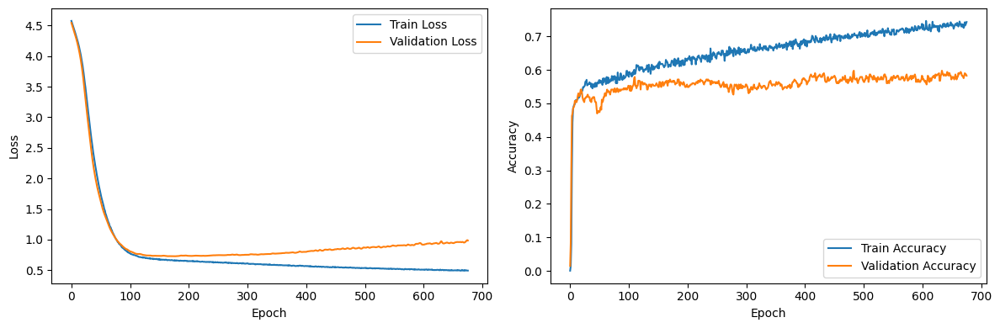


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3088, Val Loss: 4.2743, Train Acc: 0.4950, Val Acc: 0.4980
Epoch: 020, Train Loss: 3.8100, Val Loss: 3.7347, Train Acc: 0.5168, Val Acc: 0.4980
Epoch: 030, Train Loss: 2.8704, Val Loss: 2.8982, Train Acc: 0.5327, Val Acc: 0.5059
Epoch: 040, Train Loss: 2.1043, Val Loss: 2.2162, Train Acc: 0.5537, Val Acc: 0.5176
Epoch: 050, Train Loss: 1.6706, Val Loss: 1.7856, Train Acc: 0.5789, Val Acc: 0.5098
Epoch: 060, Train Loss: 1.3877, Val Loss: 1.4859, Train Acc: 0.5646, Val Acc: 0.5020
Epoch: 070, Train Loss: 1.1656, Val Loss: 1.2664, Train Acc: 0.6015, Val Acc: 0.4902
Epoch: 080, Train Loss: 1.0136, Val Loss: 1.0953, Train Acc: 0.5965, Val Acc: 0.4784
Epoch: 090, Train Loss: 0.8931, Val Loss: 0.9723, Train Acc: 0.6007, Val Acc: 0.4941
Epoch: 100, Train Loss: 0.8118, Val Loss: 0.8882, Train Acc: 0.6074, Val Acc: 0.4941
Epoch: 110, Train Loss: 0.7658, Val Loss: 0.8329, Tr

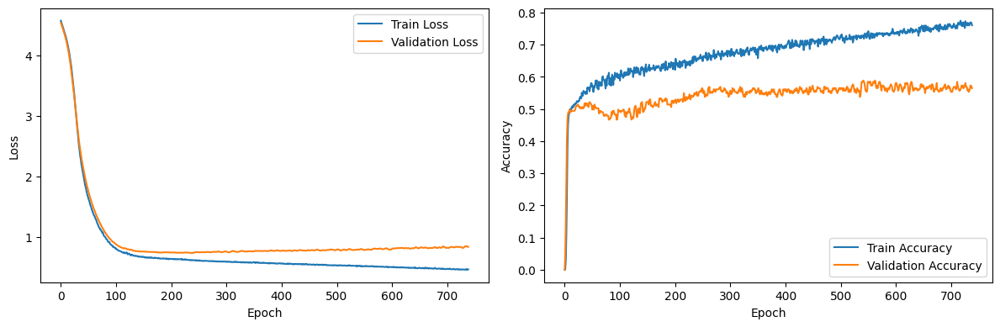


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2844, Val Loss: 4.2706, Train Acc: 0.5091, Val Acc: 0.4915
Epoch: 020, Train Loss: 3.6901, Val Loss: 3.6858, Train Acc: 0.5172, Val Acc: 0.4788
Epoch: 030, Train Loss: 2.7681, Val Loss: 2.8064, Train Acc: 0.5363, Val Acc: 0.5085
Epoch: 040, Train Loss: 2.1215, Val Loss: 2.1375, Train Acc: 0.5263, Val Acc: 0.4958
Epoch: 050, Train Loss: 1.6922, Val Loss: 1.6699, Train Acc: 0.5399, Val Acc: 0.5381
Epoch: 060, Train Loss: 1.3899, Val Loss: 1.3743, Train Acc: 0.5535, Val Acc: 0.5466
Epoch: 070, Train Loss: 1.1343, Val Loss: 1.1524, Train Acc: 0.5526, Val Acc: 0.5593
Epoch: 080, Train Loss: 0.9551, Val Loss: 0.9833, Train Acc: 0.5844, Val Acc: 0.5381
Epoch: 090, Train Loss: 0.8484, Val Loss: 0.8786, Train Acc: 0.5563, Val Acc: 0.5212
Epoch: 100, Train Loss: 0.7906, Val Loss: 0.8137, Train Acc: 0.5653, Val Acc: 0.5127
Epoch: 110, Train Loss: 0.7373, Val Loss: 0.7801, Tr

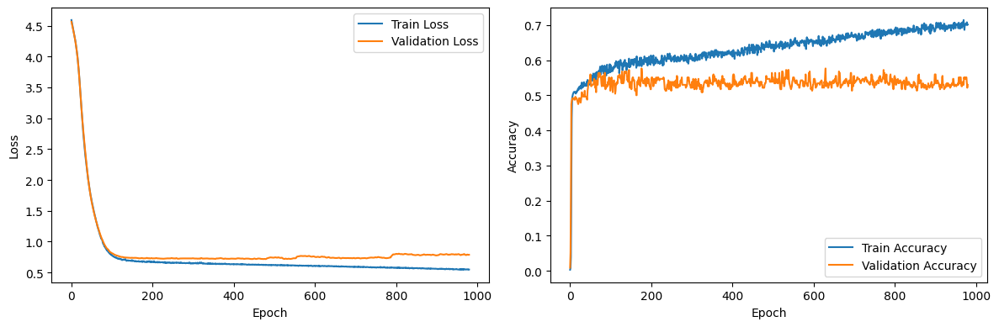


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2391, Val Loss: 4.2110, Train Acc: 0.5049, Val Acc: 0.4495
Epoch: 020, Train Loss: 3.6075, Val Loss: 3.5463, Train Acc: 0.5413, Val Acc: 0.4954
Epoch: 030, Train Loss: 2.7895, Val Loss: 2.7026, Train Acc: 0.5571, Val Acc: 0.4908
Epoch: 040, Train Loss: 2.0939, Val Loss: 2.0322, Train Acc: 0.5404, Val Acc: 0.5275
Epoch: 050, Train Loss: 1.6829, Val Loss: 1.6135, Train Acc: 0.5561, Val Acc: 0.5596
Epoch: 060, Train Loss: 1.4188, Val Loss: 1.3385, Train Acc: 0.5423, Val Acc: 0.6147
Epoch: 070, Train Loss: 1.2034, Val Loss: 1.1396, Train Acc: 0.5728, Val Acc: 0.5780
Epoch: 080, Train Loss: 1.0396, Val Loss: 0.9860, Train Acc: 0.5768, Val Acc: 0.5642
Epoch: 090, Train Loss: 0.9212, Val Loss: 0.8696, Train Acc: 0.5719, Val Acc: 0.5734
Epoch: 100, Train Loss: 0.8266, Val Loss: 0.7954, Train Acc: 0.5778, Val Acc: 0.5826
Epoch: 110, Train Loss: 0.7750, Val Loss: 0.7552, Tr

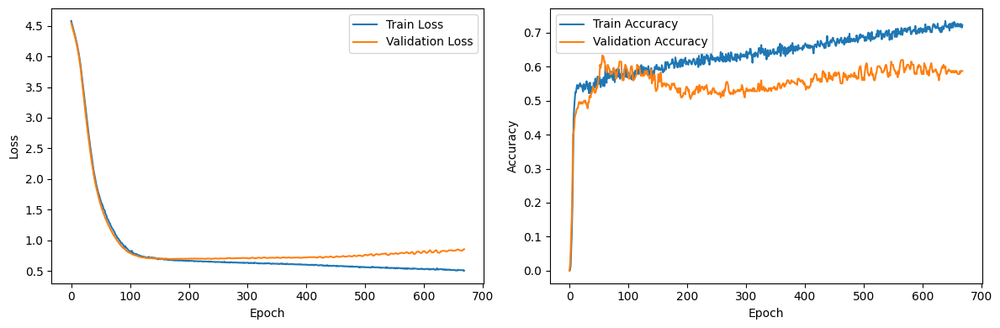


========== Run 2 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3167, Val Loss: 4.2736, Train Acc: 0.4940, Val Acc: 0.4887
Epoch: 020, Train Loss: 3.8731, Val Loss: 3.7504, Train Acc: 0.5012, Val Acc: 0.4887
Epoch: 030, Train Loss: 3.0815, Val Loss: 2.8643, Train Acc: 0.5125, Val Acc: 0.4887
Epoch: 040, Train Loss: 2.3536, Val Loss: 2.1261, Train Acc: 0.5367, Val Acc: 0.5113
Epoch: 050, Train Loss: 1.8099, Val Loss: 1.6564, Train Acc: 0.5624, Val Acc: 0.5038
Epoch: 060, Train Loss: 1.4187, Val Loss: 1.3294, Train Acc: 0.5673, Val Acc: 0.5263
Epoch: 070, Train Loss: 1.1514, Val Loss: 1.1037, Train Acc: 0.5608, Val Acc: 0.5526
Epoch: 080, Train Loss: 0.9607, Val Loss: 0.9494, Train Acc: 0.5786, Val Acc: 0.5451
Epoch: 090, Train Loss: 0.8526, Val Loss: 0.8516, Train Acc: 0.5681, Val Acc: 0.5451
Epoch: 100, Train Loss: 0.7864, Val Loss: 0.8033, Train Acc: 0.5834, Val Acc: 0.5564
Epoch: 110, Train Loss

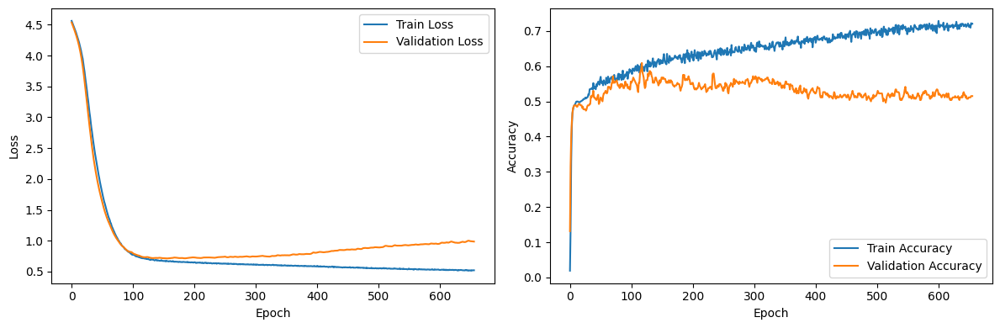


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2910, Val Loss: 4.2527, Train Acc: 0.4648, Val Acc: 0.4706
Epoch: 020, Train Loss: 3.6597, Val Loss: 3.5793, Train Acc: 0.5050, Val Acc: 0.5255
Epoch: 030, Train Loss: 2.6497, Val Loss: 2.6722, Train Acc: 0.5520, Val Acc: 0.5294
Epoch: 040, Train Loss: 1.9612, Val Loss: 2.0676, Train Acc: 0.5537, Val Acc: 0.5176
Epoch: 050, Train Loss: 1.5700, Val Loss: 1.6769, Train Acc: 0.5445, Val Acc: 0.5216
Epoch: 060, Train Loss: 1.2996, Val Loss: 1.3888, Train Acc: 0.5663, Val Acc: 0.5098
Epoch: 070, Train Loss: 1.0964, Val Loss: 1.1714, Train Acc: 0.5822, Val Acc: 0.5020
Epoch: 080, Train Loss: 0.9430, Val Loss: 1.0118, Train Acc: 0.5738, Val Acc: 0.5098
Epoch: 090, Train Loss: 0.8421, Val Loss: 0.9068, Train Acc: 0.5814, Val Acc: 0.5020
Epoch: 100, Train Loss: 0.7773, Val Loss: 0.8355, Train Acc: 0.6049, Val Acc: 0.5255
Epoch: 110, Train Loss: 0.7416, Val Loss: 0.7948, Tr

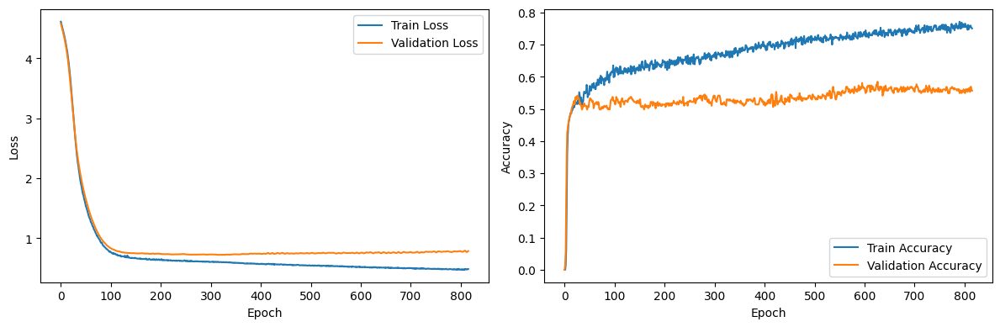


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2967, Val Loss: 4.2771, Train Acc: 0.4628, Val Acc: 0.4831
Epoch: 020, Train Loss: 3.7323, Val Loss: 3.7055, Train Acc: 0.5445, Val Acc: 0.4958
Epoch: 030, Train Loss: 2.8253, Val Loss: 2.8078, Train Acc: 0.5626, Val Acc: 0.5508
Epoch: 040, Train Loss: 2.1549, Val Loss: 2.1611, Train Acc: 0.5499, Val Acc: 0.5085
Epoch: 050, Train Loss: 1.7180, Val Loss: 1.7137, Train Acc: 0.5426, Val Acc: 0.4746
Epoch: 060, Train Loss: 1.4142, Val Loss: 1.4151, Train Acc: 0.5563, Val Acc: 0.5000
Epoch: 070, Train Loss: 1.1859, Val Loss: 1.1696, Train Acc: 0.5644, Val Acc: 0.5593
Epoch: 080, Train Loss: 0.9817, Val Loss: 1.0027, Train Acc: 0.5726, Val Acc: 0.5381
Epoch: 090, Train Loss: 0.8689, Val Loss: 0.8898, Train Acc: 0.5744, Val Acc: 0.5339
Epoch: 100, Train Loss: 0.7995, Val Loss: 0.8204, Train Acc: 0.5590, Val Acc: 0.5381
Epoch: 110, Train Loss: 0.7498, Val Loss: 0.7929, Tr

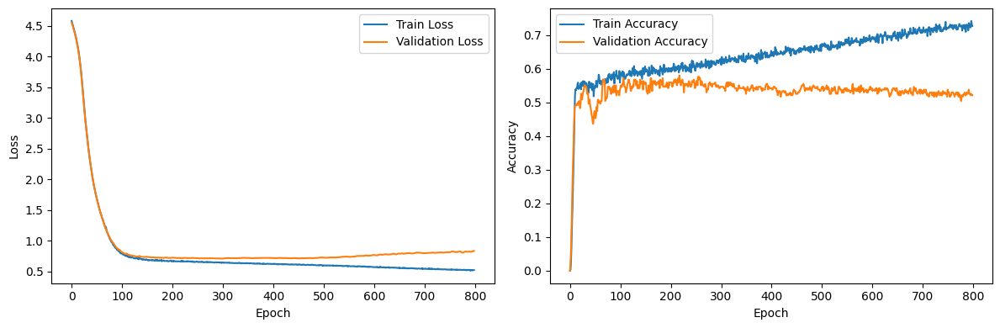


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3588, Val Loss: 4.3320, Train Acc: 0.2904, Val Acc: 0.3486
Epoch: 020, Train Loss: 3.7922, Val Loss: 3.7260, Train Acc: 0.5276, Val Acc: 0.5229
Epoch: 030, Train Loss: 3.1059, Val Loss: 3.0387, Train Acc: 0.5295, Val Acc: 0.5229
Epoch: 040, Train Loss: 2.3595, Val Loss: 2.3132, Train Acc: 0.5384, Val Acc: 0.5413
Epoch: 050, Train Loss: 1.8452, Val Loss: 1.8112, Train Acc: 0.5325, Val Acc: 0.5275
Epoch: 060, Train Loss: 1.5141, Val Loss: 1.4404, Train Acc: 0.5463, Val Acc: 0.5321
Epoch: 070, Train Loss: 1.2656, Val Loss: 1.1768, Train Acc: 0.5463, Val Acc: 0.6009
Epoch: 080, Train Loss: 1.0470, Val Loss: 0.9913, Train Acc: 0.5709, Val Acc: 0.6101
Epoch: 090, Train Loss: 0.9047, Val Loss: 0.8697, Train Acc: 0.5787, Val Acc: 0.5872
Epoch: 100, Train Loss: 0.8133, Val Loss: 0.7953, Train Acc: 0.5689, Val Acc: 0.5917
Epoch: 110, Train Loss: 0.7621, Val Loss: 0.7486, Tr

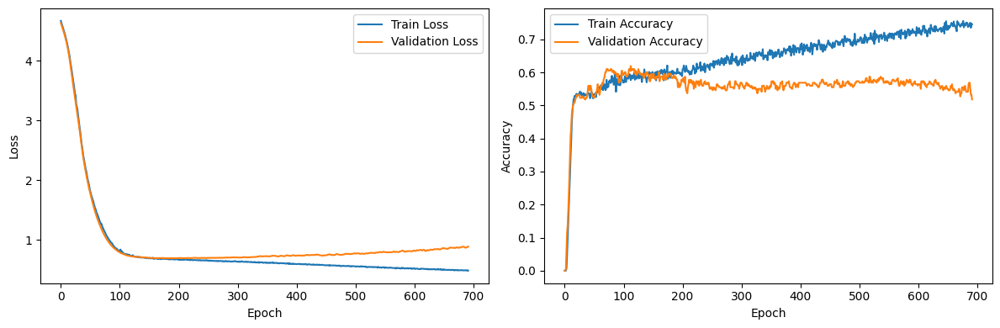


========== Run 3 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2946, Val Loss: 4.2490, Train Acc: 0.4867, Val Acc: 0.4699
Epoch: 020, Train Loss: 3.7906, Val Loss: 3.6617, Train Acc: 0.5214, Val Acc: 0.5075
Epoch: 030, Train Loss: 3.0035, Val Loss: 2.7829, Train Acc: 0.5302, Val Acc: 0.5113
Epoch: 040, Train Loss: 2.2694, Val Loss: 2.0419, Train Acc: 0.5399, Val Acc: 0.5489
Epoch: 050, Train Loss: 1.7495, Val Loss: 1.6142, Train Acc: 0.5399, Val Acc: 0.5338
Epoch: 060, Train Loss: 1.3868, Val Loss: 1.3239, Train Acc: 0.5753, Val Acc: 0.5301
Epoch: 070, Train Loss: 1.1539, Val Loss: 1.1106, Train Acc: 0.5447, Val Acc: 0.5489
Epoch: 080, Train Loss: 0.9732, Val Loss: 0.9729, Train Acc: 0.5778, Val Acc: 0.5414
Epoch: 090, Train Loss: 0.8570, Val Loss: 0.8769, Train Acc: 0.5770, Val Acc: 0.5489
Epoch: 100, Train Loss: 0.7887, Val Loss: 0.8076, Train Acc: 0.5778, Val Acc: 0.5677
Epoch: 110, Train Loss

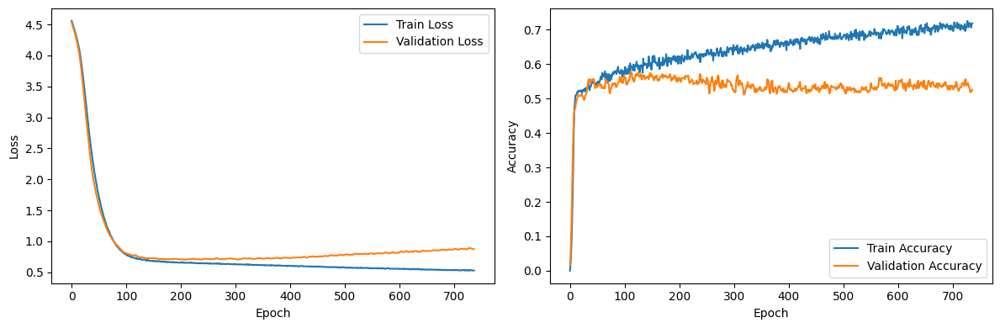


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2838, Val Loss: 4.2359, Train Acc: 0.3725, Val Acc: 0.4314
Epoch: 020, Train Loss: 3.5807, Val Loss: 3.5274, Train Acc: 0.5109, Val Acc: 0.5529
Epoch: 030, Train Loss: 2.6194, Val Loss: 2.6471, Train Acc: 0.5285, Val Acc: 0.5569
Epoch: 040, Train Loss: 1.9893, Val Loss: 2.0735, Train Acc: 0.5419, Val Acc: 0.5529
Epoch: 050, Train Loss: 1.5743, Val Loss: 1.6916, Train Acc: 0.5680, Val Acc: 0.5294
Epoch: 060, Train Loss: 1.2870, Val Loss: 1.3869, Train Acc: 0.5965, Val Acc: 0.5255
Epoch: 070, Train Loss: 1.1038, Val Loss: 1.1672, Train Acc: 0.5705, Val Acc: 0.5137
Epoch: 080, Train Loss: 0.9367, Val Loss: 1.0125, Train Acc: 0.5721, Val Acc: 0.5020
Epoch: 090, Train Loss: 0.8410, Val Loss: 0.9091, Train Acc: 0.5646, Val Acc: 0.5216
Epoch: 100, Train Loss: 0.7660, Val Loss: 0.8480, Train Acc: 0.5898, Val Acc: 0.5020
Epoch: 110, Train Loss: 0.7313, Val Loss: 0.8070, Tr

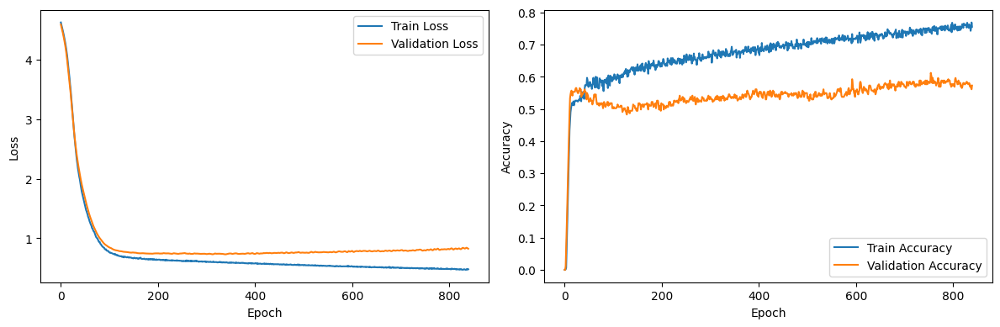


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2214, Val Loss: 4.2096, Train Acc: 0.5118, Val Acc: 0.4703
Epoch: 020, Train Loss: 3.6039, Val Loss: 3.6018, Train Acc: 0.5227, Val Acc: 0.4915
Epoch: 030, Train Loss: 2.6694, Val Loss: 2.6842, Train Acc: 0.5354, Val Acc: 0.4534
Epoch: 040, Train Loss: 2.0742, Val Loss: 2.0921, Train Acc: 0.5517, Val Acc: 0.4915
Epoch: 050, Train Loss: 1.7066, Val Loss: 1.7259, Train Acc: 0.5626, Val Acc: 0.4958
Epoch: 060, Train Loss: 1.4163, Val Loss: 1.4348, Train Acc: 0.5544, Val Acc: 0.5042
Epoch: 070, Train Loss: 1.1633, Val Loss: 1.1944, Train Acc: 0.5635, Val Acc: 0.5127
Epoch: 080, Train Loss: 0.9743, Val Loss: 1.0106, Train Acc: 0.5762, Val Acc: 0.4915
Epoch: 090, Train Loss: 0.8326, Val Loss: 0.8919, Train Acc: 0.5871, Val Acc: 0.4915
Epoch: 100, Train Loss: 0.7653, Val Loss: 0.8185, Train Acc: 0.5799, Val Acc: 0.5212
Epoch: 110, Train Loss: 0.7362, Val Loss: 0.7778, Tr

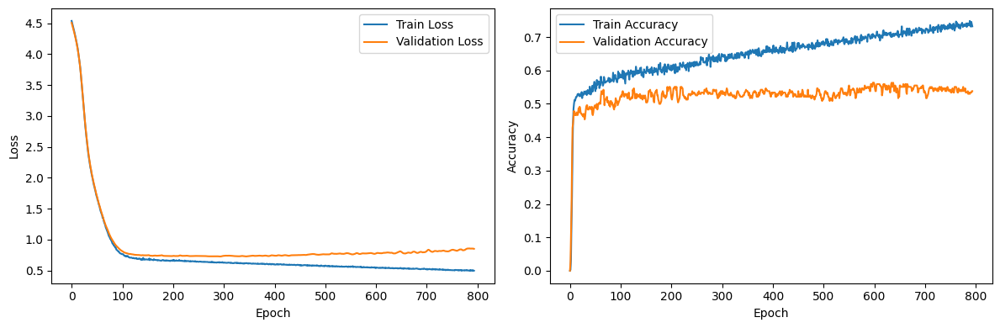


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2246, Val Loss: 4.1878, Train Acc: 0.4803, Val Acc: 0.4954
Epoch: 020, Train Loss: 3.5318, Val Loss: 3.4462, Train Acc: 0.5315, Val Acc: 0.5183
Epoch: 030, Train Loss: 2.7531, Val Loss: 2.6869, Train Acc: 0.5433, Val Acc: 0.5275
Epoch: 040, Train Loss: 2.1039, Val Loss: 2.0698, Train Acc: 0.5551, Val Acc: 0.4954
Epoch: 050, Train Loss: 1.7279, Val Loss: 1.6806, Train Acc: 0.5453, Val Acc: 0.5138
Epoch: 060, Train Loss: 1.4443, Val Loss: 1.3733, Train Acc: 0.5404, Val Acc: 0.5780
Epoch: 070, Train Loss: 1.2128, Val Loss: 1.1431, Train Acc: 0.5738, Val Acc: 0.6284
Epoch: 080, Train Loss: 1.0383, Val Loss: 0.9780, Train Acc: 0.5541, Val Acc: 0.5826
Epoch: 090, Train Loss: 0.8893, Val Loss: 0.8570, Train Acc: 0.5866, Val Acc: 0.5963
Epoch: 100, Train Loss: 0.8274, Val Loss: 0.7819, Train Acc: 0.5719, Val Acc: 0.5963
Epoch: 110, Train Loss: 0.7543, Val Loss: 0.7462, Tr

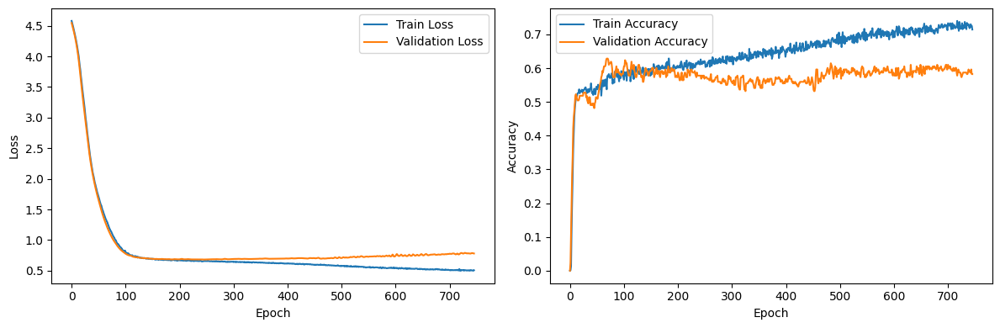


========== Run 4 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1947, Val Loss: 4.1390, Train Acc: 0.5222, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.6850, Val Loss: 3.5577, Train Acc: 0.5697, Val Acc: 0.5677
Epoch: 030, Train Loss: 2.8531, Val Loss: 2.6131, Train Acc: 0.5729, Val Acc: 0.5639
Epoch: 040, Train Loss: 2.1320, Val Loss: 1.9992, Train Acc: 0.5882, Val Acc: 0.5038
Epoch: 050, Train Loss: 1.6581, Val Loss: 1.5629, Train Acc: 0.5770, Val Acc: 0.5226
Epoch: 060, Train Loss: 1.3232, Val Loss: 1.2779, Train Acc: 0.5818, Val Acc: 0.5639
Epoch: 070, Train Loss: 1.0980, Val Loss: 1.0619, Train Acc: 0.5761, Val Acc: 0.5752
Epoch: 080, Train Loss: 0.9318, Val Loss: 0.9461, Train Acc: 0.5915, Val Acc: 0.5602
Epoch: 090, Train Loss: 0.8261, Val Loss: 0.8536, Train Acc: 0.5866, Val Acc: 0.5564
Epoch: 100, Train Loss: 0.7649, Val Loss: 0.7955, Train Acc: 0.5915, Val Acc: 0.5639
Epoch: 110, Train Loss

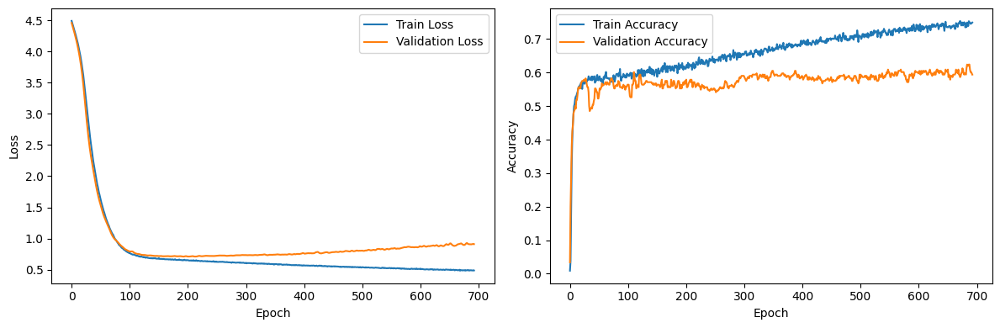


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2310, Val Loss: 4.1922, Train Acc: 0.4782, Val Acc: 0.4941
Epoch: 020, Train Loss: 3.6715, Val Loss: 3.5980, Train Acc: 0.5008, Val Acc: 0.5020
Epoch: 030, Train Loss: 2.8237, Val Loss: 2.7936, Train Acc: 0.5042, Val Acc: 0.4980
Epoch: 040, Train Loss: 2.0112, Val Loss: 2.0927, Train Acc: 0.5193, Val Acc: 0.4941
Epoch: 050, Train Loss: 1.5571, Val Loss: 1.6934, Train Acc: 0.5596, Val Acc: 0.4863
Epoch: 060, Train Loss: 1.2850, Val Loss: 1.3845, Train Acc: 0.5562, Val Acc: 0.4863
Epoch: 070, Train Loss: 1.0883, Val Loss: 1.1673, Train Acc: 0.5730, Val Acc: 0.4902
Epoch: 080, Train Loss: 0.9504, Val Loss: 1.0198, Train Acc: 0.5604, Val Acc: 0.5059
Epoch: 090, Train Loss: 0.8423, Val Loss: 0.9188, Train Acc: 0.5680, Val Acc: 0.5098
Epoch: 100, Train Loss: 0.7967, Val Loss: 0.8557, Train Acc: 0.5738, Val Acc: 0.5020
Epoch: 110, Train Loss: 0.7532, Val Loss: 0.8204, Tr

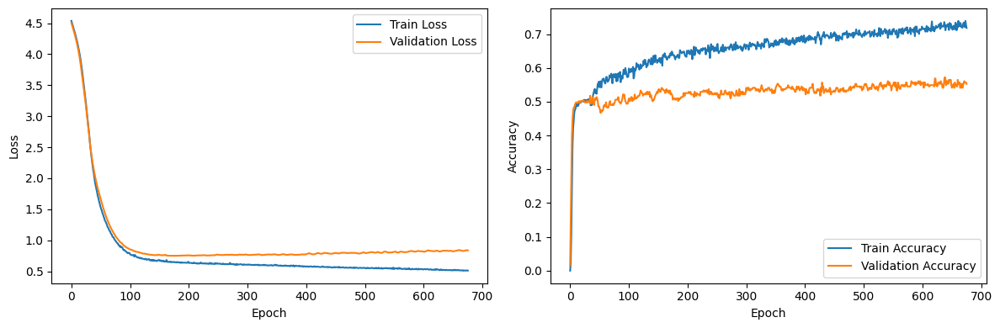


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2841, Val Loss: 4.2596, Train Acc: 0.4601, Val Acc: 0.4492
Epoch: 020, Train Loss: 3.6153, Val Loss: 3.5824, Train Acc: 0.5617, Val Acc: 0.5381
Epoch: 030, Train Loss: 2.6731, Val Loss: 2.6436, Train Acc: 0.5499, Val Acc: 0.5339
Epoch: 040, Train Loss: 2.0742, Val Loss: 2.0460, Train Acc: 0.5463, Val Acc: 0.5508
Epoch: 050, Train Loss: 1.7148, Val Loss: 1.7079, Train Acc: 0.5644, Val Acc: 0.5085
Epoch: 060, Train Loss: 1.4348, Val Loss: 1.4415, Train Acc: 0.5608, Val Acc: 0.5085
Epoch: 070, Train Loss: 1.1907, Val Loss: 1.2151, Train Acc: 0.5771, Val Acc: 0.5254
Epoch: 080, Train Loss: 1.0047, Val Loss: 1.0290, Train Acc: 0.5871, Val Acc: 0.5339
Epoch: 090, Train Loss: 0.8678, Val Loss: 0.9030, Train Acc: 0.5926, Val Acc: 0.5212
Epoch: 100, Train Loss: 0.7941, Val Loss: 0.8234, Train Acc: 0.5907, Val Acc: 0.5297
Epoch: 110, Train Loss: 0.7460, Val Loss: 0.7896, Tr

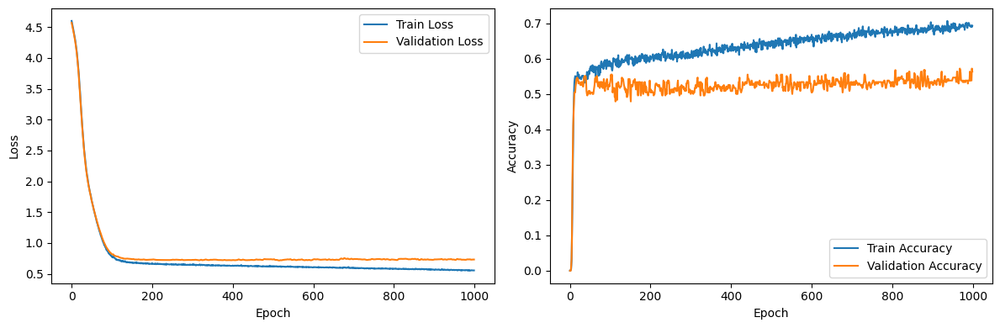


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1447, Val Loss: 4.1055, Train Acc: 0.4980, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.3831, Val Loss: 3.2904, Train Acc: 0.5030, Val Acc: 0.5000
Epoch: 030, Train Loss: 2.5393, Val Loss: 2.4624, Train Acc: 0.4990, Val Acc: 0.5046
Epoch: 040, Train Loss: 2.0063, Val Loss: 1.9410, Train Acc: 0.5118, Val Acc: 0.5046
Epoch: 050, Train Loss: 1.6790, Val Loss: 1.5864, Train Acc: 0.5236, Val Acc: 0.5734
Epoch: 060, Train Loss: 1.4419, Val Loss: 1.3401, Train Acc: 0.5217, Val Acc: 0.5826
Epoch: 070, Train Loss: 1.2364, Val Loss: 1.1543, Train Acc: 0.5354, Val Acc: 0.5550
Epoch: 080, Train Loss: 1.0493, Val Loss: 0.9903, Train Acc: 0.5374, Val Acc: 0.5688
Epoch: 090, Train Loss: 0.9136, Val Loss: 0.8800, Train Acc: 0.5354, Val Acc: 0.5596
Epoch: 100, Train Loss: 0.8233, Val Loss: 0.7970, Train Acc: 0.5571, Val Acc: 0.5780
Epoch: 110, Train Loss: 0.7715, Val Loss: 0.7549, Tr

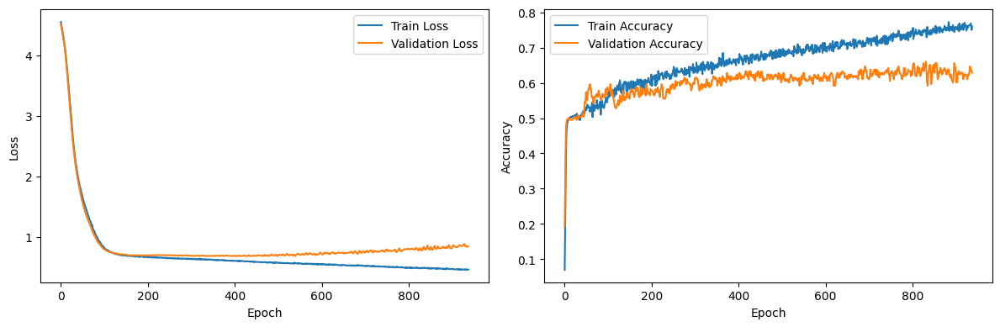


========== Run 5 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2960, Val Loss: 4.2537, Train Acc: 0.4899, Val Acc: 0.4812
Epoch: 020, Train Loss: 3.8499, Val Loss: 3.7455, Train Acc: 0.5197, Val Acc: 0.4850
Epoch: 030, Train Loss: 3.0616, Val Loss: 2.8691, Train Acc: 0.5431, Val Acc: 0.5075
Epoch: 040, Train Loss: 2.3018, Val Loss: 2.0798, Train Acc: 0.5318, Val Acc: 0.5338
Epoch: 050, Train Loss: 1.7719, Val Loss: 1.6466, Train Acc: 0.5608, Val Acc: 0.5038
Epoch: 060, Train Loss: 1.4102, Val Loss: 1.3348, Train Acc: 0.5866, Val Acc: 0.5564
Epoch: 070, Train Loss: 1.1619, Val Loss: 1.1309, Train Acc: 0.5729, Val Acc: 0.5639
Epoch: 080, Train Loss: 0.9920, Val Loss: 0.9870, Train Acc: 0.5576, Val Acc: 0.5564
Epoch: 090, Train Loss: 0.8680, Val Loss: 0.8864, Train Acc: 0.5737, Val Acc: 0.5338
Epoch: 100, Train Loss: 0.7934, Val Loss: 0.8180, Train Acc: 0.5810, Val Acc: 0.5564
Epoch: 110, Train Loss

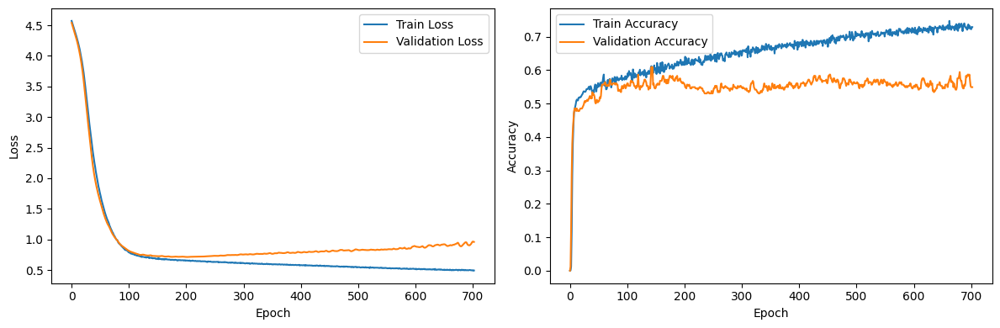


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3518, Val Loss: 4.3188, Train Acc: 0.4279, Val Acc: 0.4784
Epoch: 020, Train Loss: 3.7417, Val Loss: 3.7090, Train Acc: 0.4950, Val Acc: 0.5059
Epoch: 030, Train Loss: 2.8576, Val Loss: 2.9029, Train Acc: 0.5042, Val Acc: 0.5059
Epoch: 040, Train Loss: 2.1080, Val Loss: 2.2414, Train Acc: 0.5428, Val Acc: 0.4784
Epoch: 050, Train Loss: 1.6843, Val Loss: 1.8261, Train Acc: 0.5411, Val Acc: 0.5216
Epoch: 060, Train Loss: 1.3785, Val Loss: 1.5040, Train Acc: 0.5612, Val Acc: 0.4824
Epoch: 070, Train Loss: 1.1665, Val Loss: 1.2606, Train Acc: 0.5671, Val Acc: 0.4902
Epoch: 080, Train Loss: 1.0024, Val Loss: 1.0894, Train Acc: 0.5831, Val Acc: 0.4824
Epoch: 090, Train Loss: 0.8912, Val Loss: 0.9731, Train Acc: 0.5914, Val Acc: 0.5137
Epoch: 100, Train Loss: 0.8145, Val Loss: 0.8930, Train Acc: 0.5906, Val Acc: 0.5176
Epoch: 110, Train Loss: 0.7696, Val Loss: 0.8415, Tr

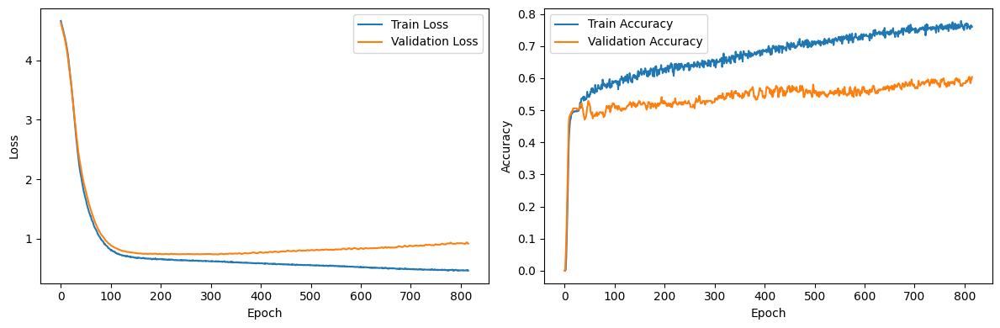


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1952, Val Loss: 4.1709, Train Acc: 0.4982, Val Acc: 0.4788
Epoch: 020, Train Loss: 3.4297, Val Loss: 3.4020, Train Acc: 0.5236, Val Acc: 0.4619
Epoch: 030, Train Loss: 2.5240, Val Loss: 2.5424, Train Acc: 0.5227, Val Acc: 0.4534
Epoch: 040, Train Loss: 2.0162, Val Loss: 2.0244, Train Acc: 0.5354, Val Acc: 0.4492
Epoch: 050, Train Loss: 1.6782, Val Loss: 1.6965, Train Acc: 0.5581, Val Acc: 0.5042
Epoch: 060, Train Loss: 1.3909, Val Loss: 1.4243, Train Acc: 0.5708, Val Acc: 0.5127
Epoch: 070, Train Loss: 1.1731, Val Loss: 1.1937, Train Acc: 0.5599, Val Acc: 0.4915
Epoch: 080, Train Loss: 0.9696, Val Loss: 1.0175, Train Acc: 0.5726, Val Acc: 0.5254
Epoch: 090, Train Loss: 0.8375, Val Loss: 0.8987, Train Acc: 0.5862, Val Acc: 0.5297
Epoch: 100, Train Loss: 0.7647, Val Loss: 0.8263, Train Acc: 0.5817, Val Acc: 0.5593
Epoch: 110, Train Loss: 0.7280, Val Loss: 0.7926, Tr

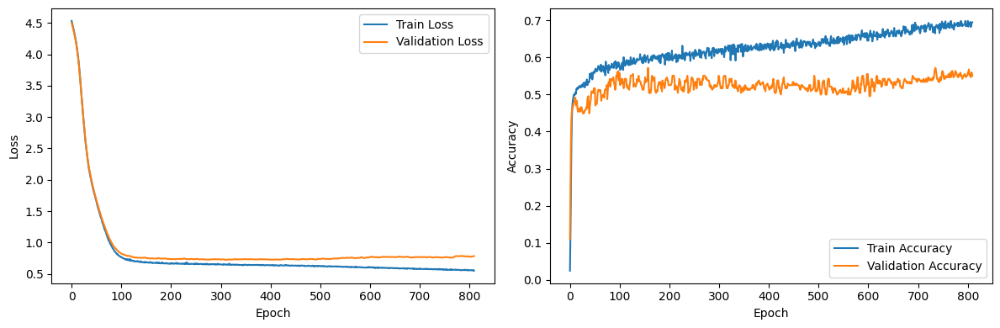


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1455, Val Loss: 4.1071, Train Acc: 0.5000, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.2934, Val Loss: 3.2254, Train Acc: 0.5010, Val Acc: 0.4954
Epoch: 030, Train Loss: 2.5126, Val Loss: 2.4921, Train Acc: 0.5098, Val Acc: 0.4908
Epoch: 040, Train Loss: 2.0510, Val Loss: 2.0212, Train Acc: 0.5148, Val Acc: 0.4908
Epoch: 050, Train Loss: 1.6904, Val Loss: 1.6251, Train Acc: 0.5157, Val Acc: 0.5780
Epoch: 060, Train Loss: 1.4313, Val Loss: 1.3402, Train Acc: 0.5295, Val Acc: 0.6055
Epoch: 070, Train Loss: 1.2092, Val Loss: 1.1293, Train Acc: 0.5325, Val Acc: 0.6009
Epoch: 080, Train Loss: 1.0305, Val Loss: 0.9755, Train Acc: 0.5325, Val Acc: 0.5826
Epoch: 090, Train Loss: 0.8943, Val Loss: 0.8574, Train Acc: 0.5482, Val Acc: 0.5917
Epoch: 100, Train Loss: 0.8191, Val Loss: 0.7877, Train Acc: 0.5659, Val Acc: 0.6193
Epoch: 110, Train Loss: 0.7571, Val Loss: 0.7508, Tr

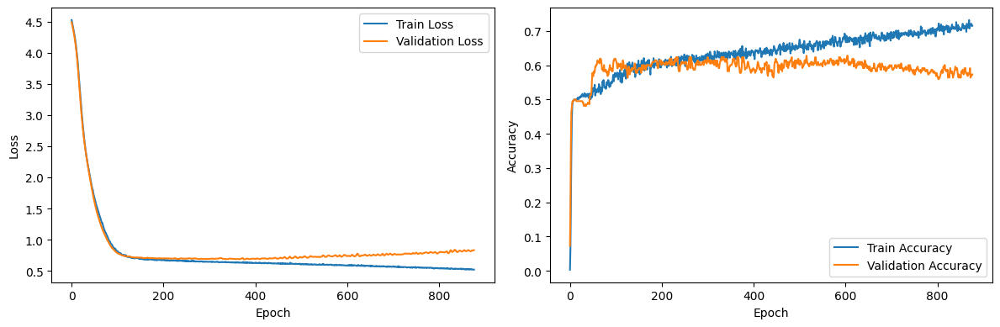


========== Run 6 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2124, Val Loss: 4.1310, Train Acc: 0.5141, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.4886, Val Loss: 3.2858, Train Acc: 0.5351, Val Acc: 0.5113
Epoch: 030, Train Loss: 2.6561, Val Loss: 2.4267, Train Acc: 0.5254, Val Acc: 0.5263
Epoch: 040, Train Loss: 2.0462, Val Loss: 1.8356, Train Acc: 0.5286, Val Acc: 0.5526
Epoch: 050, Train Loss: 1.6109, Val Loss: 1.4908, Train Acc: 0.5584, Val Acc: 0.5188
Epoch: 060, Train Loss: 1.3009, Val Loss: 1.2373, Train Acc: 0.5488, Val Acc: 0.5489
Epoch: 070, Train Loss: 1.0800, Val Loss: 1.0407, Train Acc: 0.5568, Val Acc: 0.5602
Epoch: 080, Train Loss: 0.9290, Val Loss: 0.9211, Train Acc: 0.5745, Val Acc: 0.5414
Epoch: 090, Train Loss: 0.8312, Val Loss: 0.8484, Train Acc: 0.5770, Val Acc: 0.5451
Epoch: 100, Train Loss: 0.7744, Val Loss: 0.7821, Train Acc: 0.5753, Val Acc: 0.5414
Epoch: 110, Train Loss

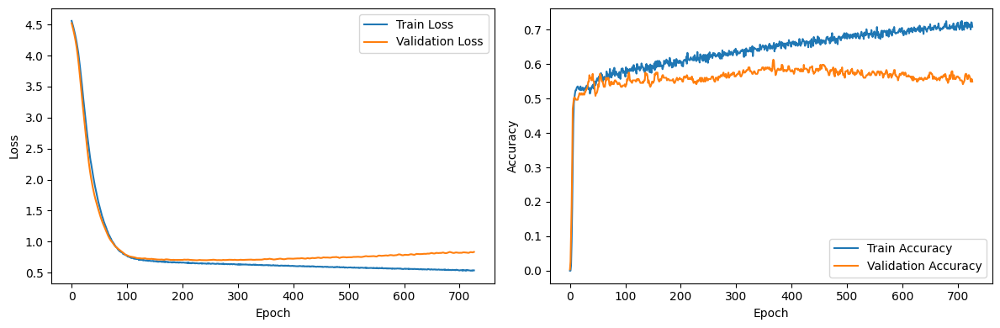


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2773, Val Loss: 4.2342, Train Acc: 0.4933, Val Acc: 0.4941
Epoch: 020, Train Loss: 3.5307, Val Loss: 3.4962, Train Acc: 0.5201, Val Acc: 0.5020
Epoch: 030, Train Loss: 2.5634, Val Loss: 2.6278, Train Acc: 0.5168, Val Acc: 0.5176
Epoch: 040, Train Loss: 1.9425, Val Loss: 2.0590, Train Acc: 0.5419, Val Acc: 0.4941
Epoch: 050, Train Loss: 1.5645, Val Loss: 1.6732, Train Acc: 0.5730, Val Acc: 0.5020
Epoch: 060, Train Loss: 1.3146, Val Loss: 1.3970, Train Acc: 0.5763, Val Acc: 0.5137
Epoch: 070, Train Loss: 1.1096, Val Loss: 1.1819, Train Acc: 0.5688, Val Acc: 0.5137
Epoch: 080, Train Loss: 0.9578, Val Loss: 1.0333, Train Acc: 0.5747, Val Acc: 0.5059
Epoch: 090, Train Loss: 0.8586, Val Loss: 0.9215, Train Acc: 0.5889, Val Acc: 0.4980
Epoch: 100, Train Loss: 0.7844, Val Loss: 0.8541, Train Acc: 0.6015, Val Acc: 0.5098
Epoch: 110, Train Loss: 0.7314, Val Loss: 0.8103, Tr

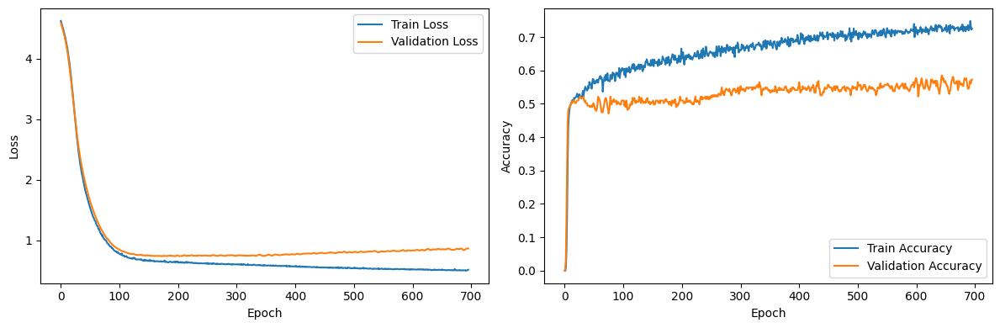


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2980, Val Loss: 4.2853, Train Acc: 0.4719, Val Acc: 0.4534
Epoch: 020, Train Loss: 3.6358, Val Loss: 3.6151, Train Acc: 0.5681, Val Acc: 0.5254
Epoch: 030, Train Loss: 2.7884, Val Loss: 2.8150, Train Acc: 0.5426, Val Acc: 0.5127
Epoch: 040, Train Loss: 2.1458, Val Loss: 2.1517, Train Acc: 0.5572, Val Acc: 0.4958
Epoch: 050, Train Loss: 1.7264, Val Loss: 1.7089, Train Acc: 0.5472, Val Acc: 0.5212
Epoch: 060, Train Loss: 1.4214, Val Loss: 1.4246, Train Acc: 0.5617, Val Acc: 0.5085
Epoch: 070, Train Loss: 1.1989, Val Loss: 1.1962, Train Acc: 0.5490, Val Acc: 0.5085
Epoch: 080, Train Loss: 0.9957, Val Loss: 1.0296, Train Acc: 0.5526, Val Acc: 0.4958
Epoch: 090, Train Loss: 0.8674, Val Loss: 0.9059, Train Acc: 0.5799, Val Acc: 0.4915
Epoch: 100, Train Loss: 0.7977, Val Loss: 0.8310, Train Acc: 0.5690, Val Acc: 0.5085
Epoch: 110, Train Loss: 0.7499, Val Loss: 0.7857, Tr

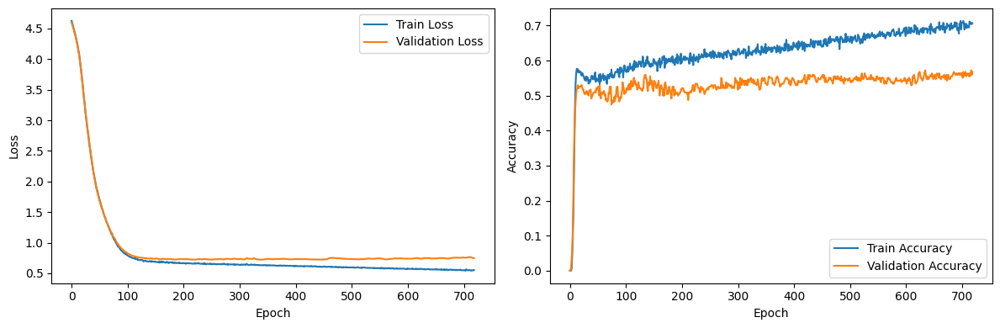


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1123, Val Loss: 4.0685, Train Acc: 0.5167, Val Acc: 0.4908
Epoch: 020, Train Loss: 3.3414, Val Loss: 3.2702, Train Acc: 0.5305, Val Acc: 0.4771
Epoch: 030, Train Loss: 2.5804, Val Loss: 2.5374, Train Acc: 0.5315, Val Acc: 0.5183
Epoch: 040, Train Loss: 1.9855, Val Loss: 1.9499, Train Acc: 0.5492, Val Acc: 0.5505
Epoch: 050, Train Loss: 1.5974, Val Loss: 1.5424, Train Acc: 0.5650, Val Acc: 0.5780
Epoch: 060, Train Loss: 1.3270, Val Loss: 1.2578, Train Acc: 0.5650, Val Acc: 0.6422
Epoch: 070, Train Loss: 1.1165, Val Loss: 1.0605, Train Acc: 0.5807, Val Acc: 0.6101
Epoch: 080, Train Loss: 0.9665, Val Loss: 0.9387, Train Acc: 0.5728, Val Acc: 0.5642
Epoch: 090, Train Loss: 0.8648, Val Loss: 0.8250, Train Acc: 0.5591, Val Acc: 0.5917
Epoch: 100, Train Loss: 0.7821, Val Loss: 0.7648, Train Acc: 0.5738, Val Acc: 0.5872
Epoch: 110, Train Loss: 0.7462, Val Loss: 0.7383, Tr

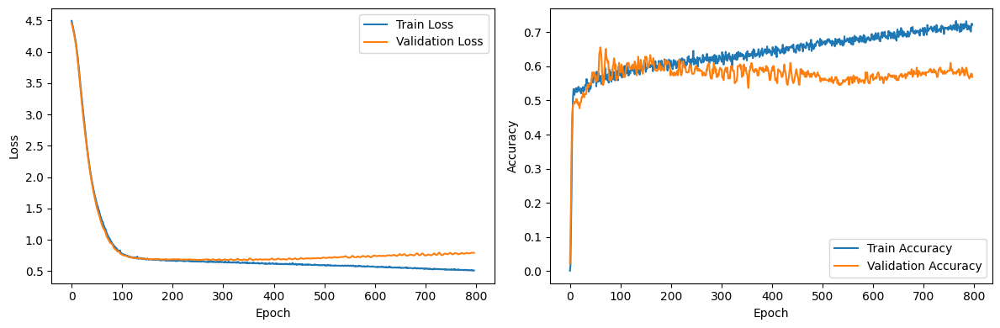


========== Run 7 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2699, Val Loss: 4.2176, Train Acc: 0.4996, Val Acc: 0.4887
Epoch: 020, Train Loss: 3.7384, Val Loss: 3.5767, Train Acc: 0.5616, Val Acc: 0.5602
Epoch: 030, Train Loss: 2.9148, Val Loss: 2.6531, Train Acc: 0.5560, Val Acc: 0.5564
Epoch: 040, Train Loss: 2.2010, Val Loss: 1.9869, Train Acc: 0.5834, Val Acc: 0.5789
Epoch: 050, Train Loss: 1.6931, Val Loss: 1.5626, Train Acc: 0.5786, Val Acc: 0.5639
Epoch: 060, Train Loss: 1.3284, Val Loss: 1.2554, Train Acc: 0.5786, Val Acc: 0.5414
Epoch: 070, Train Loss: 1.0704, Val Loss: 1.0565, Train Acc: 0.5834, Val Acc: 0.5451
Epoch: 080, Train Loss: 0.9052, Val Loss: 0.9219, Train Acc: 0.5955, Val Acc: 0.5414
Epoch: 090, Train Loss: 0.8046, Val Loss: 0.8297, Train Acc: 0.5979, Val Acc: 0.5414
Epoch: 100, Train Loss: 0.7586, Val Loss: 0.7922, Train Acc: 0.5915, Val Acc: 0.5376
Epoch: 110, Train Loss

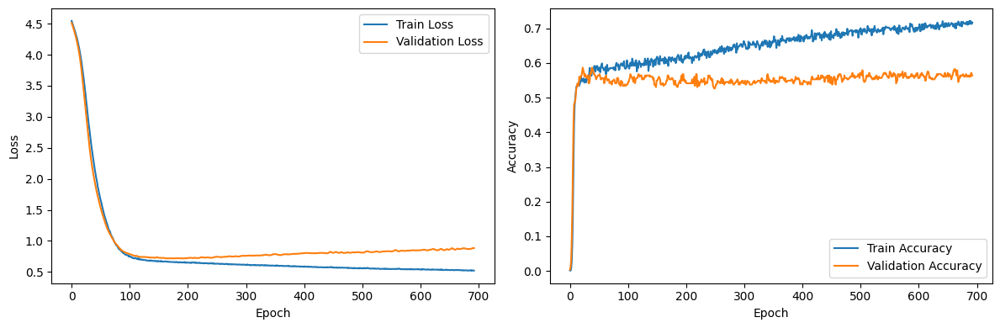


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2298, Val Loss: 4.1828, Train Acc: 0.5529, Val Acc: 0.5098
Epoch: 020, Train Loss: 3.5784, Val Loss: 3.5421, Train Acc: 0.5814, Val Acc: 0.5059
Epoch: 030, Train Loss: 2.5798, Val Loss: 2.6321, Train Acc: 0.5864, Val Acc: 0.5216
Epoch: 040, Train Loss: 1.9027, Val Loss: 2.0351, Train Acc: 0.5864, Val Acc: 0.5490
Epoch: 050, Train Loss: 1.5036, Val Loss: 1.6404, Train Acc: 0.6015, Val Acc: 0.4980
Epoch: 060, Train Loss: 1.2436, Val Loss: 1.3488, Train Acc: 0.6124, Val Acc: 0.5176
Epoch: 070, Train Loss: 1.0569, Val Loss: 1.1305, Train Acc: 0.5931, Val Acc: 0.5059
Epoch: 080, Train Loss: 0.9104, Val Loss: 0.9804, Train Acc: 0.5990, Val Acc: 0.5059
Epoch: 090, Train Loss: 0.8134, Val Loss: 0.8852, Train Acc: 0.6200, Val Acc: 0.5098
Epoch: 100, Train Loss: 0.7589, Val Loss: 0.8274, Train Acc: 0.5872, Val Acc: 0.5176
Epoch: 110, Train Loss: 0.7083, Val Loss: 0.7901, Tr

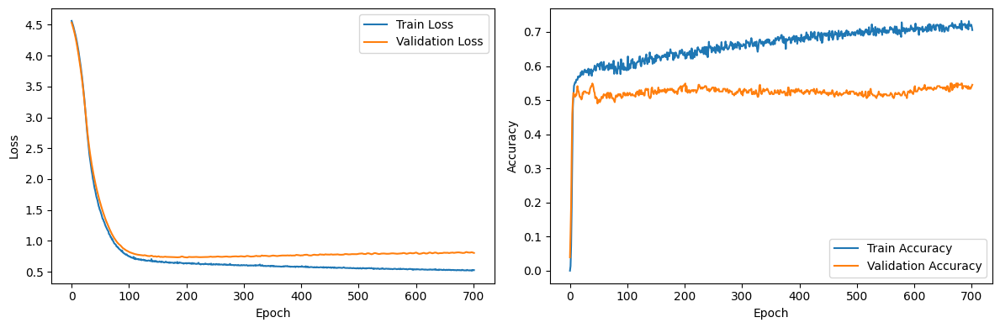


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2982, Val Loss: 4.2890, Train Acc: 0.5245, Val Acc: 0.4576
Epoch: 020, Train Loss: 3.7613, Val Loss: 3.7559, Train Acc: 0.5299, Val Acc: 0.4576
Epoch: 030, Train Loss: 2.9253, Val Loss: 2.9858, Train Acc: 0.5191, Val Acc: 0.4449
Epoch: 040, Train Loss: 2.2052, Val Loss: 2.2448, Train Acc: 0.5191, Val Acc: 0.4661
Epoch: 050, Train Loss: 1.7578, Val Loss: 1.7596, Train Acc: 0.5209, Val Acc: 0.4831
Epoch: 060, Train Loss: 1.4392, Val Loss: 1.4450, Train Acc: 0.5490, Val Acc: 0.4958
Epoch: 070, Train Loss: 1.1941, Val Loss: 1.2093, Train Acc: 0.5318, Val Acc: 0.4703
Epoch: 080, Train Loss: 0.9959, Val Loss: 1.0259, Train Acc: 0.5463, Val Acc: 0.4958
Epoch: 090, Train Loss: 0.8679, Val Loss: 0.9012, Train Acc: 0.5463, Val Acc: 0.4576
Epoch: 100, Train Loss: 0.7942, Val Loss: 0.8268, Train Acc: 0.5717, Val Acc: 0.4915
Epoch: 110, Train Loss: 0.7403, Val Loss: 0.7855, Tr

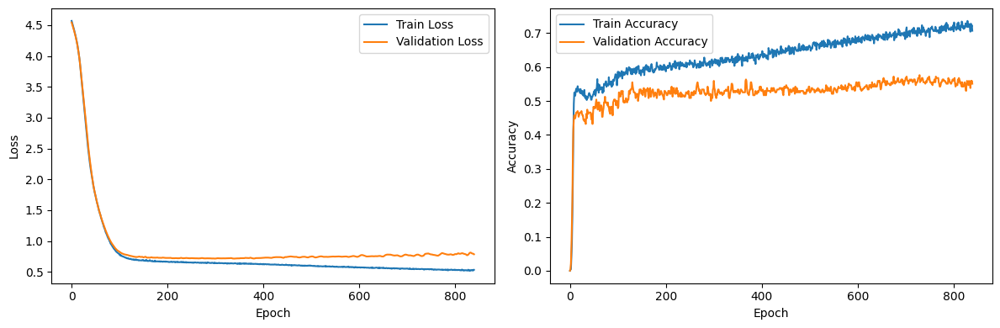


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1644, Val Loss: 4.1114, Train Acc: 0.4892, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.4338, Val Loss: 3.3383, Train Acc: 0.5128, Val Acc: 0.5046
Epoch: 030, Train Loss: 2.6850, Val Loss: 2.6018, Train Acc: 0.5148, Val Acc: 0.5046
Epoch: 040, Train Loss: 2.0628, Val Loss: 1.9982, Train Acc: 0.5039, Val Acc: 0.5138
Epoch: 050, Train Loss: 1.6831, Val Loss: 1.5928, Train Acc: 0.5217, Val Acc: 0.5505
Epoch: 060, Train Loss: 1.4164, Val Loss: 1.3238, Train Acc: 0.5305, Val Acc: 0.5459
Epoch: 070, Train Loss: 1.2021, Val Loss: 1.1124, Train Acc: 0.5305, Val Acc: 0.5917
Epoch: 080, Train Loss: 1.0312, Val Loss: 0.9559, Train Acc: 0.5344, Val Acc: 0.5734
Epoch: 090, Train Loss: 0.8996, Val Loss: 0.8548, Train Acc: 0.5335, Val Acc: 0.5459
Epoch: 100, Train Loss: 0.8215, Val Loss: 0.7814, Train Acc: 0.5630, Val Acc: 0.5596
Epoch: 110, Train Loss: 0.7602, Val Loss: 0.7410, Tr

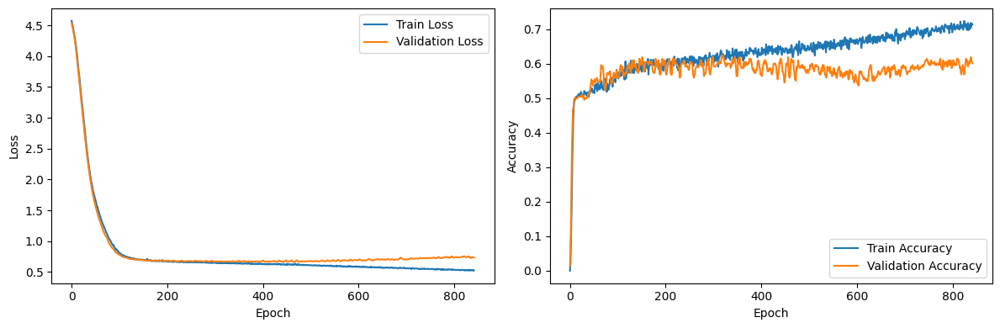


========== Run 8 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2936, Val Loss: 4.2346, Train Acc: 0.4214, Val Acc: 0.4248
Epoch: 020, Train Loss: 3.6592, Val Loss: 3.4747, Train Acc: 0.5633, Val Acc: 0.5301
Epoch: 030, Train Loss: 2.7920, Val Loss: 2.5706, Train Acc: 0.5729, Val Acc: 0.5489
Epoch: 040, Train Loss: 2.1349, Val Loss: 1.9562, Train Acc: 0.5673, Val Acc: 0.5526
Epoch: 050, Train Loss: 1.6711, Val Loss: 1.5596, Train Acc: 0.5552, Val Acc: 0.5376
Epoch: 060, Train Loss: 1.3388, Val Loss: 1.2813, Train Acc: 0.5745, Val Acc: 0.5338
Epoch: 070, Train Loss: 1.0963, Val Loss: 1.0767, Train Acc: 0.5721, Val Acc: 0.5376
Epoch: 080, Train Loss: 0.9253, Val Loss: 0.9407, Train Acc: 0.5866, Val Acc: 0.5526
Epoch: 090, Train Loss: 0.8228, Val Loss: 0.8423, Train Acc: 0.5649, Val Acc: 0.5414
Epoch: 100, Train Loss: 0.7650, Val Loss: 0.8002, Train Acc: 0.5818, Val Acc: 0.5376
Epoch: 110, Train Loss

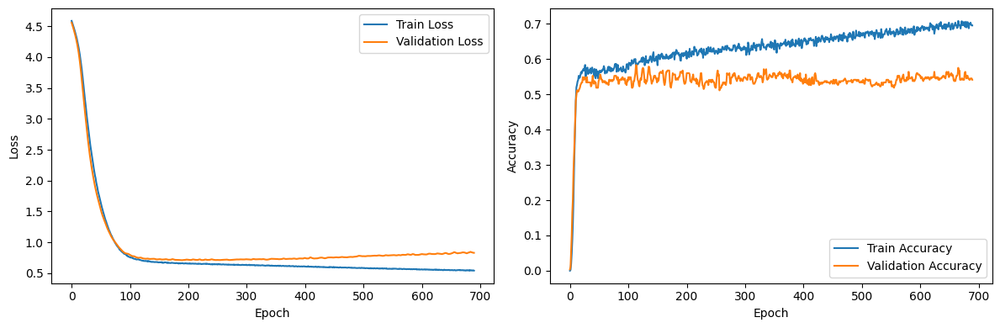


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2222, Val Loss: 4.1817, Train Acc: 0.4673, Val Acc: 0.4902
Epoch: 020, Train Loss: 3.5298, Val Loss: 3.4979, Train Acc: 0.5034, Val Acc: 0.5216
Epoch: 030, Train Loss: 2.5778, Val Loss: 2.6597, Train Acc: 0.5260, Val Acc: 0.5216
Epoch: 040, Train Loss: 1.9789, Val Loss: 2.0892, Train Acc: 0.5579, Val Acc: 0.5333
Epoch: 050, Train Loss: 1.5946, Val Loss: 1.7126, Train Acc: 0.5797, Val Acc: 0.5373
Epoch: 060, Train Loss: 1.3587, Val Loss: 1.4353, Train Acc: 0.5856, Val Acc: 0.5451
Epoch: 070, Train Loss: 1.1359, Val Loss: 1.2189, Train Acc: 0.5831, Val Acc: 0.5412
Epoch: 080, Train Loss: 0.9907, Val Loss: 1.0603, Train Acc: 0.5755, Val Acc: 0.5373
Epoch: 090, Train Loss: 0.8682, Val Loss: 0.9463, Train Acc: 0.6032, Val Acc: 0.5294
Epoch: 100, Train Loss: 0.7995, Val Loss: 0.8698, Train Acc: 0.6082, Val Acc: 0.5176
Epoch: 110, Train Loss: 0.7535, Val Loss: 0.8252, Tr

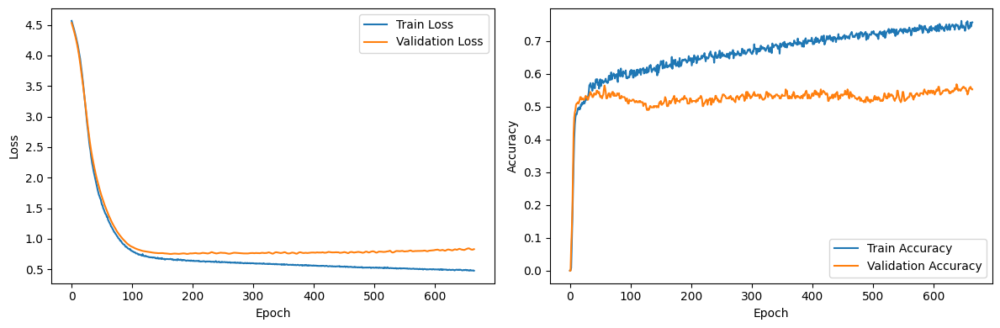


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2334, Val Loss: 4.2110, Train Acc: 0.5009, Val Acc: 0.4831
Epoch: 020, Train Loss: 3.4929, Val Loss: 3.4817, Train Acc: 0.5200, Val Acc: 0.4873
Epoch: 030, Train Loss: 2.5871, Val Loss: 2.6258, Train Acc: 0.5345, Val Acc: 0.4915
Epoch: 040, Train Loss: 1.9965, Val Loss: 2.0033, Train Acc: 0.5372, Val Acc: 0.4873
Epoch: 050, Train Loss: 1.6285, Val Loss: 1.6179, Train Acc: 0.5436, Val Acc: 0.5212
Epoch: 060, Train Loss: 1.3352, Val Loss: 1.3443, Train Acc: 0.5617, Val Acc: 0.5169
Epoch: 070, Train Loss: 1.1019, Val Loss: 1.1294, Train Acc: 0.5626, Val Acc: 0.5000
Epoch: 080, Train Loss: 0.9397, Val Loss: 0.9682, Train Acc: 0.5662, Val Acc: 0.5254
Epoch: 090, Train Loss: 0.8253, Val Loss: 0.8641, Train Acc: 0.5953, Val Acc: 0.5169
Epoch: 100, Train Loss: 0.7651, Val Loss: 0.8063, Train Acc: 0.5817, Val Acc: 0.5000
Epoch: 110, Train Loss: 0.7318, Val Loss: 0.7779, Tr

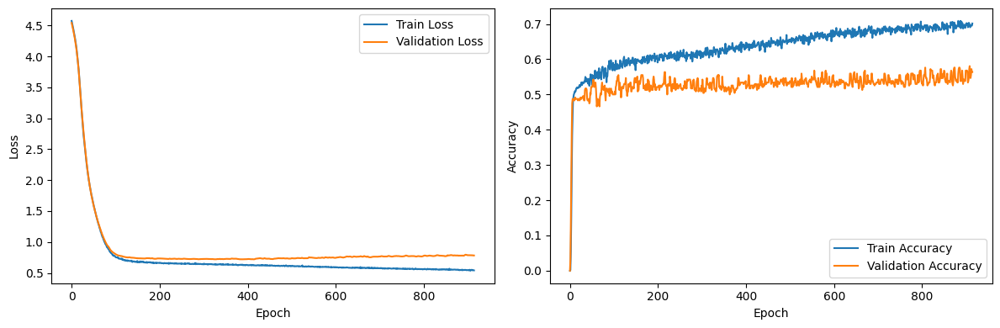


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2605, Val Loss: 4.2330, Train Acc: 0.4537, Val Acc: 0.4633
Epoch: 020, Train Loss: 3.5645, Val Loss: 3.4844, Train Acc: 0.5089, Val Acc: 0.5000
Epoch: 030, Train Loss: 2.6868, Val Loss: 2.6208, Train Acc: 0.5098, Val Acc: 0.5000
Epoch: 040, Train Loss: 2.1193, Val Loss: 2.0602, Train Acc: 0.5305, Val Acc: 0.5092
Epoch: 050, Train Loss: 1.7697, Val Loss: 1.6771, Train Acc: 0.5246, Val Acc: 0.5642
Epoch: 060, Train Loss: 1.4839, Val Loss: 1.4046, Train Acc: 0.5600, Val Acc: 0.5642
Epoch: 070, Train Loss: 1.2615, Val Loss: 1.1856, Train Acc: 0.5472, Val Acc: 0.5505
Epoch: 080, Train Loss: 1.0660, Val Loss: 1.0089, Train Acc: 0.5541, Val Acc: 0.5505
Epoch: 090, Train Loss: 0.9143, Val Loss: 0.8741, Train Acc: 0.5581, Val Acc: 0.5917
Epoch: 100, Train Loss: 0.8210, Val Loss: 0.7896, Train Acc: 0.5787, Val Acc: 0.6147
Epoch: 110, Train Loss: 0.7720, Val Loss: 0.7450, Tr

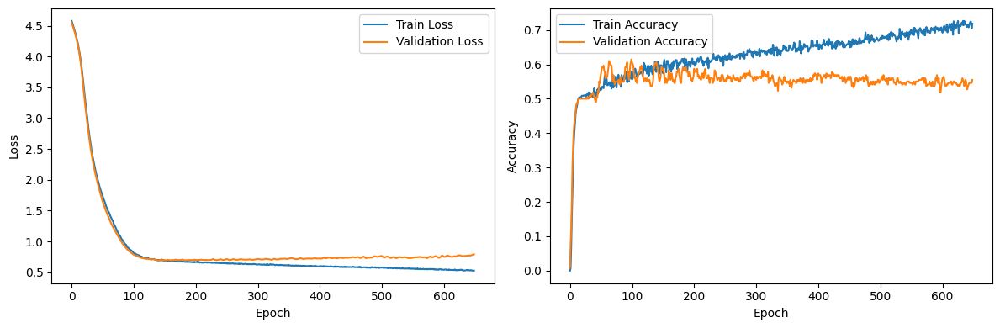


========== Run 9 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1274, Val Loss: 4.0583, Train Acc: 0.5165, Val Acc: 0.5150
Epoch: 020, Train Loss: 3.4735, Val Loss: 3.2570, Train Acc: 0.5665, Val Acc: 0.5188
Epoch: 030, Train Loss: 2.5989, Val Loss: 2.3774, Train Acc: 0.5624, Val Acc: 0.5263
Epoch: 040, Train Loss: 2.0060, Val Loss: 1.8554, Train Acc: 0.5568, Val Acc: 0.5338
Epoch: 050, Train Loss: 1.6009, Val Loss: 1.5007, Train Acc: 0.5705, Val Acc: 0.5489
Epoch: 060, Train Loss: 1.2983, Val Loss: 1.2463, Train Acc: 0.5770, Val Acc: 0.5602
Epoch: 070, Train Loss: 1.0764, Val Loss: 1.0588, Train Acc: 0.5681, Val Acc: 0.5414
Epoch: 080, Train Loss: 0.9255, Val Loss: 0.9338, Train Acc: 0.5737, Val Acc: 0.5301
Epoch: 090, Train Loss: 0.8290, Val Loss: 0.8477, Train Acc: 0.5737, Val Acc: 0.5451
Epoch: 100, Train Loss: 0.7664, Val Loss: 0.7960, Train Acc: 0.6035, Val Acc: 0.5564
Epoch: 110, Train Loss

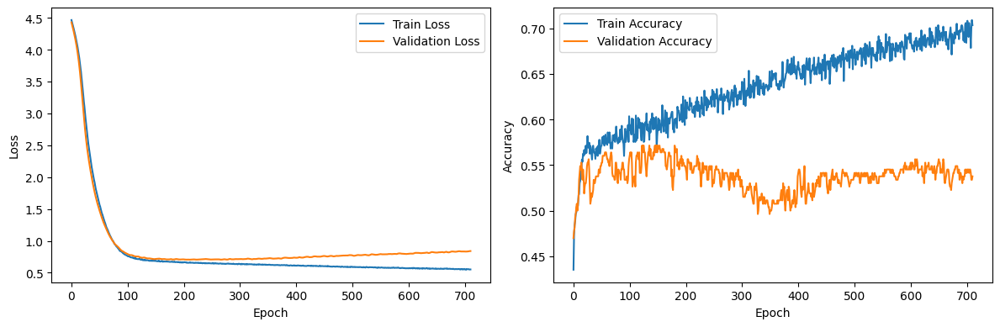


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1628, Val Loss: 4.1067, Train Acc: 0.5017, Val Acc: 0.5490
Epoch: 020, Train Loss: 3.4935, Val Loss: 3.4224, Train Acc: 0.5101, Val Acc: 0.5686
Epoch: 030, Train Loss: 2.5982, Val Loss: 2.5843, Train Acc: 0.5008, Val Acc: 0.5294
Epoch: 040, Train Loss: 1.9051, Val Loss: 1.9552, Train Acc: 0.5336, Val Acc: 0.5373
Epoch: 050, Train Loss: 1.4950, Val Loss: 1.5939, Train Acc: 0.5931, Val Acc: 0.5216
Epoch: 060, Train Loss: 1.2466, Val Loss: 1.3281, Train Acc: 0.5839, Val Acc: 0.5137
Epoch: 070, Train Loss: 1.0532, Val Loss: 1.1397, Train Acc: 0.5914, Val Acc: 0.5216
Epoch: 080, Train Loss: 0.9204, Val Loss: 1.0148, Train Acc: 0.5965, Val Acc: 0.5020
Epoch: 090, Train Loss: 0.8252, Val Loss: 0.9160, Train Acc: 0.6166, Val Acc: 0.5098
Epoch: 100, Train Loss: 0.7616, Val Loss: 0.8539, Train Acc: 0.6116, Val Acc: 0.5098
Epoch: 110, Train Loss: 0.7356, Val Loss: 0.8204, Tr

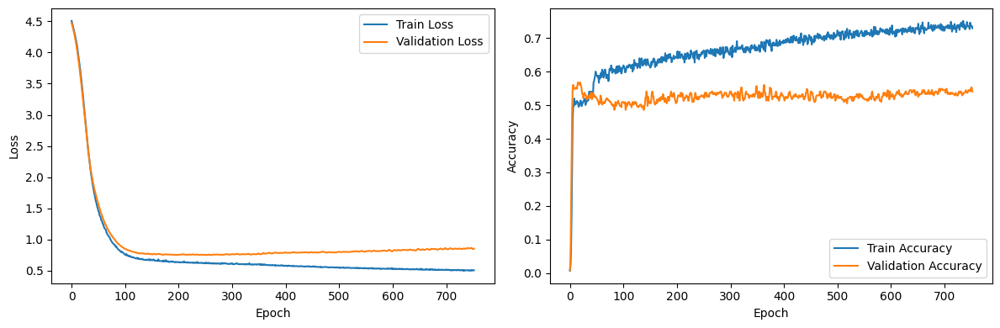


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2988, Val Loss: 4.2741, Train Acc: 0.4964, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.7322, Val Loss: 3.7068, Train Acc: 0.5018, Val Acc: 0.5000
Epoch: 030, Train Loss: 2.8112, Val Loss: 2.8138, Train Acc: 0.5045, Val Acc: 0.4915
Epoch: 040, Train Loss: 2.1522, Val Loss: 2.1433, Train Acc: 0.5100, Val Acc: 0.5212
Epoch: 050, Train Loss: 1.7063, Val Loss: 1.6731, Train Acc: 0.5245, Val Acc: 0.4788
Epoch: 060, Train Loss: 1.4100, Val Loss: 1.3922, Train Acc: 0.5027, Val Acc: 0.5000
Epoch: 070, Train Loss: 1.1836, Val Loss: 1.1790, Train Acc: 0.5299, Val Acc: 0.5000
Epoch: 080, Train Loss: 0.9956, Val Loss: 1.0148, Train Acc: 0.5272, Val Acc: 0.5169
Epoch: 090, Train Loss: 0.8754, Val Loss: 0.9026, Train Acc: 0.5481, Val Acc: 0.5000
Epoch: 100, Train Loss: 0.8025, Val Loss: 0.8344, Train Acc: 0.5499, Val Acc: 0.5254
Epoch: 110, Train Loss: 0.7620, Val Loss: 0.7965, Tr

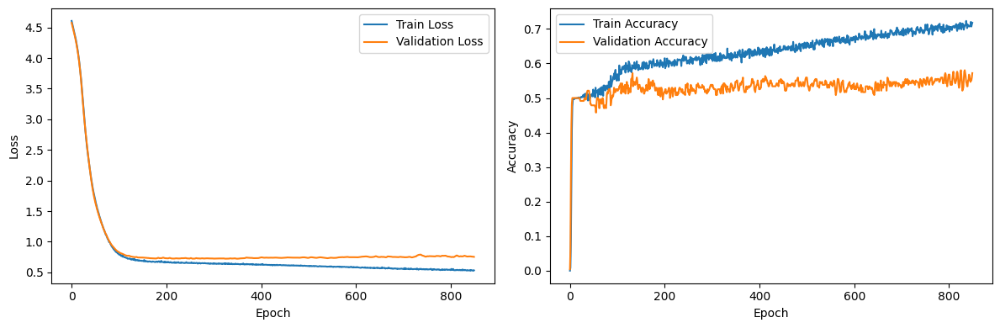


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2576, Val Loss: 4.2297, Train Acc: 0.4793, Val Acc: 0.5138
Epoch: 020, Train Loss: 3.7589, Val Loss: 3.7255, Train Acc: 0.5325, Val Acc: 0.5183
Epoch: 030, Train Loss: 2.9948, Val Loss: 2.9364, Train Acc: 0.5295, Val Acc: 0.5092
Epoch: 040, Train Loss: 2.2578, Val Loss: 2.1989, Train Acc: 0.5157, Val Acc: 0.5138
Epoch: 050, Train Loss: 1.7047, Val Loss: 1.6420, Train Acc: 0.5246, Val Acc: 0.5505
Epoch: 060, Train Loss: 1.3991, Val Loss: 1.3266, Train Acc: 0.5295, Val Acc: 0.5963
Epoch: 070, Train Loss: 1.2037, Val Loss: 1.1241, Train Acc: 0.5531, Val Acc: 0.5917
Epoch: 080, Train Loss: 1.0222, Val Loss: 0.9722, Train Acc: 0.5453, Val Acc: 0.6009
Epoch: 090, Train Loss: 0.9032, Val Loss: 0.8669, Train Acc: 0.5620, Val Acc: 0.5596
Epoch: 100, Train Loss: 0.8104, Val Loss: 0.7913, Train Acc: 0.5699, Val Acc: 0.5688
Epoch: 110, Train Loss: 0.7586, Val Loss: 0.7526, Tr

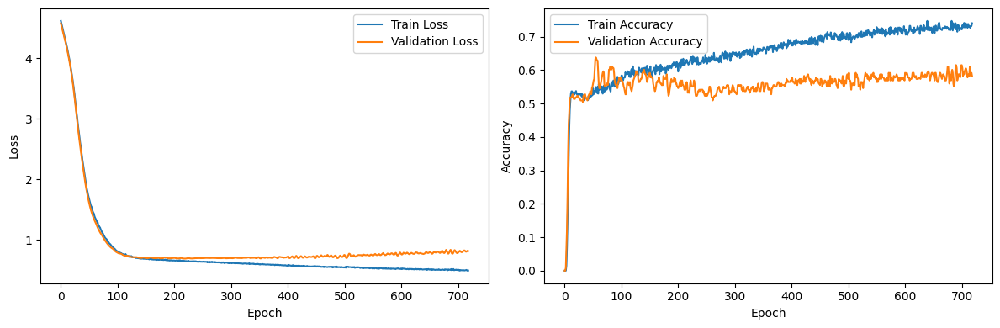


========== Run 10 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2848, Val Loss: 4.2417, Train Acc: 0.5431, Val Acc: 0.5188
Epoch: 020, Train Loss: 3.7832, Val Loss: 3.6451, Train Acc: 0.5745, Val Acc: 0.5602
Epoch: 030, Train Loss: 3.0111, Val Loss: 2.8102, Train Acc: 0.5713, Val Acc: 0.5827
Epoch: 040, Train Loss: 2.3202, Val Loss: 2.1432, Train Acc: 0.5850, Val Acc: 0.5414
Epoch: 050, Train Loss: 1.7700, Val Loss: 1.6464, Train Acc: 0.5786, Val Acc: 0.5226
Epoch: 060, Train Loss: 1.3780, Val Loss: 1.3052, Train Acc: 0.5761, Val Acc: 0.5602
Epoch: 070, Train Loss: 1.1219, Val Loss: 1.1042, Train Acc: 0.5753, Val Acc: 0.5451
Epoch: 080, Train Loss: 0.9440, Val Loss: 0.9595, Train Acc: 0.5907, Val Acc: 0.5376
Epoch: 090, Train Loss: 0.8451, Val Loss: 0.8772, Train Acc: 0.5947, Val Acc: 0.5226
Epoch: 100, Train Loss: 0.7769, Val Loss: 0.8054, Train Acc: 0.5907, Val Acc: 0.5414
Epoch: 110, Train Los

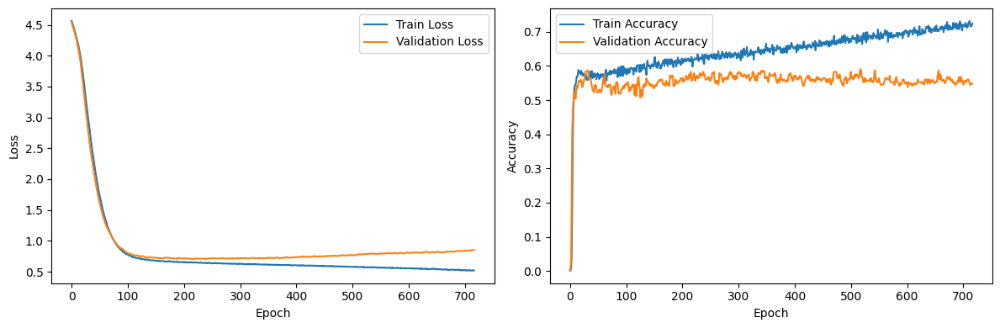


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2559, Val Loss: 4.2244, Train Acc: 0.5227, Val Acc: 0.5137
Epoch: 020, Train Loss: 3.6993, Val Loss: 3.6337, Train Acc: 0.5872, Val Acc: 0.5059
Epoch: 030, Train Loss: 2.7752, Val Loss: 2.7934, Train Acc: 0.5889, Val Acc: 0.5059
Epoch: 040, Train Loss: 1.9846, Val Loss: 2.0847, Train Acc: 0.5856, Val Acc: 0.5020
Epoch: 050, Train Loss: 1.5551, Val Loss: 1.6746, Train Acc: 0.5914, Val Acc: 0.5059
Epoch: 060, Train Loss: 1.2938, Val Loss: 1.3945, Train Acc: 0.5738, Val Acc: 0.4706
Epoch: 070, Train Loss: 1.1005, Val Loss: 1.1881, Train Acc: 0.5898, Val Acc: 0.4863
Epoch: 080, Train Loss: 0.9520, Val Loss: 1.0362, Train Acc: 0.5923, Val Acc: 0.4980
Epoch: 090, Train Loss: 0.8790, Val Loss: 0.9286, Train Acc: 0.5898, Val Acc: 0.5098
Epoch: 100, Train Loss: 0.7789, Val Loss: 0.8657, Train Acc: 0.6124, Val Acc: 0.5137
Epoch: 110, Train Loss: 0.7378, Val Loss: 0.8172, Tr

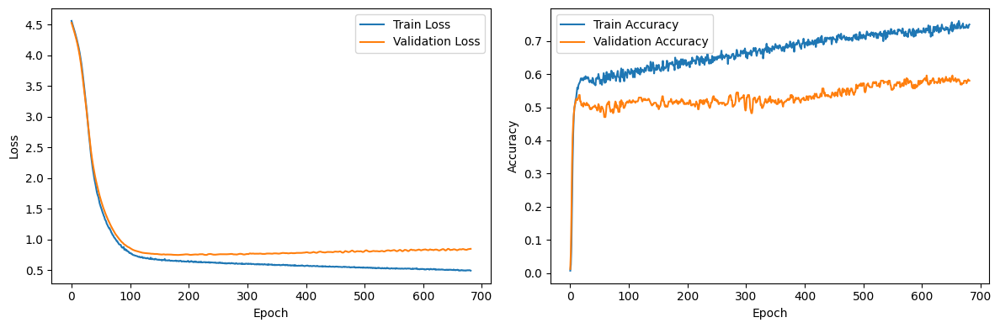


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1438, Val Loss: 4.1238, Train Acc: 0.5191, Val Acc: 0.5169
Epoch: 020, Train Loss: 3.4778, Val Loss: 3.4664, Train Acc: 0.5381, Val Acc: 0.5297
Epoch: 030, Train Loss: 2.6012, Val Loss: 2.6174, Train Acc: 0.5381, Val Acc: 0.5424
Epoch: 040, Train Loss: 1.9878, Val Loss: 1.9928, Train Acc: 0.5535, Val Acc: 0.5424
Epoch: 050, Train Loss: 1.5905, Val Loss: 1.5800, Train Acc: 0.5581, Val Acc: 0.5593
Epoch: 060, Train Loss: 1.3122, Val Loss: 1.3143, Train Acc: 0.5753, Val Acc: 0.5085
Epoch: 070, Train Loss: 1.0895, Val Loss: 1.1123, Train Acc: 0.5708, Val Acc: 0.5466
Epoch: 080, Train Loss: 0.9285, Val Loss: 0.9603, Train Acc: 0.5862, Val Acc: 0.5212
Epoch: 090, Train Loss: 0.8378, Val Loss: 0.8656, Train Acc: 0.5726, Val Acc: 0.5212
Epoch: 100, Train Loss: 0.7714, Val Loss: 0.8096, Train Acc: 0.5898, Val Acc: 0.5254
Epoch: 110, Train Loss: 0.7337, Val Loss: 0.7734, Tr

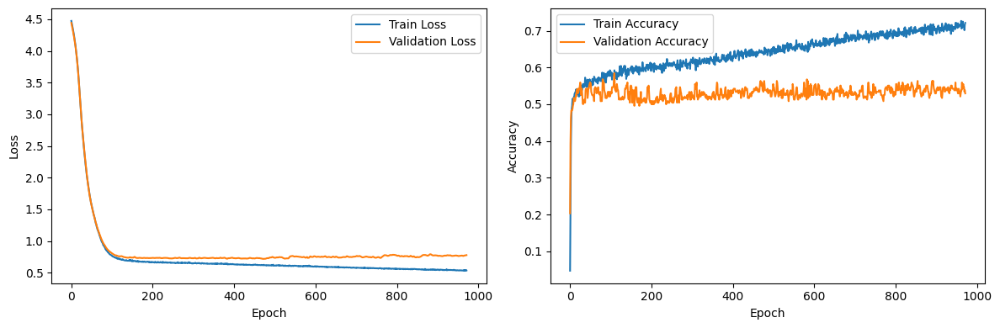


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3179, Val Loss: 4.2851, Train Acc: 0.3445, Val Acc: 0.4725
Epoch: 020, Train Loss: 3.6829, Val Loss: 3.6216, Train Acc: 0.5482, Val Acc: 0.5229
Epoch: 030, Train Loss: 2.8467, Val Loss: 2.7994, Train Acc: 0.5433, Val Acc: 0.5183
Epoch: 040, Train Loss: 2.1761, Val Loss: 2.1587, Train Acc: 0.5344, Val Acc: 0.5092
Epoch: 050, Train Loss: 1.7338, Val Loss: 1.6863, Train Acc: 0.5335, Val Acc: 0.5183
Epoch: 060, Train Loss: 1.4229, Val Loss: 1.3498, Train Acc: 0.5758, Val Acc: 0.5734
Epoch: 070, Train Loss: 1.2240, Val Loss: 1.1337, Train Acc: 0.5581, Val Acc: 0.5780
Epoch: 080, Train Loss: 1.0291, Val Loss: 0.9878, Train Acc: 0.5669, Val Acc: 0.5505
Epoch: 090, Train Loss: 0.8954, Val Loss: 0.8618, Train Acc: 0.5807, Val Acc: 0.5275
Epoch: 100, Train Loss: 0.8313, Val Loss: 0.7895, Train Acc: 0.5827, Val Acc: 0.5321
Epoch: 110, Train Loss: 0.7715, Val Loss: 0.7422, Tr

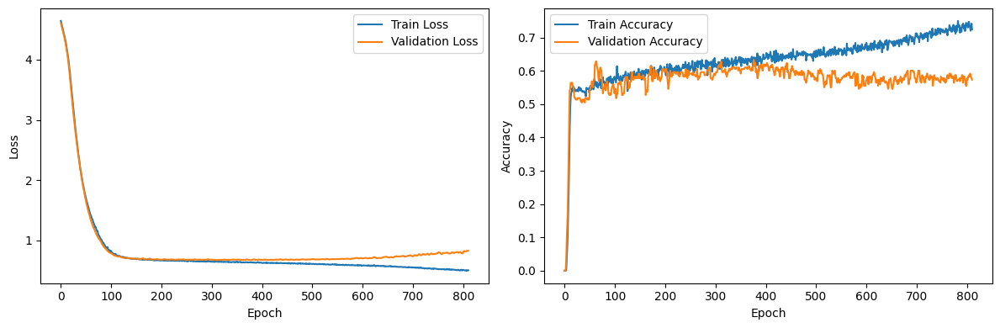


========== Run 11 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2454, Val Loss: 4.1967, Train Acc: 0.5278, Val Acc: 0.4962
Epoch: 020, Train Loss: 3.6586, Val Loss: 3.5086, Train Acc: 0.5689, Val Acc: 0.5188
Epoch: 030, Train Loss: 2.8450, Val Loss: 2.6418, Train Acc: 0.5657, Val Acc: 0.5489
Epoch: 040, Train Loss: 2.1852, Val Loss: 1.9889, Train Acc: 0.5657, Val Acc: 0.5752
Epoch: 050, Train Loss: 1.7062, Val Loss: 1.5756, Train Acc: 0.5681, Val Acc: 0.5414
Epoch: 060, Train Loss: 1.3628, Val Loss: 1.3083, Train Acc: 0.5584, Val Acc: 0.5376
Epoch: 070, Train Loss: 1.1222, Val Loss: 1.1078, Train Acc: 0.5624, Val Acc: 0.5414
Epoch: 080, Train Loss: 0.9554, Val Loss: 0.9632, Train Acc: 0.5673, Val Acc: 0.5489
Epoch: 090, Train Loss: 0.8424, Val Loss: 0.8818, Train Acc: 0.5947, Val Acc: 0.5489
Epoch: 100, Train Loss: 0.7874, Val Loss: 0.8117, Train Acc: 0.5778, Val Acc: 0.5414
Epoch: 110, Train Los

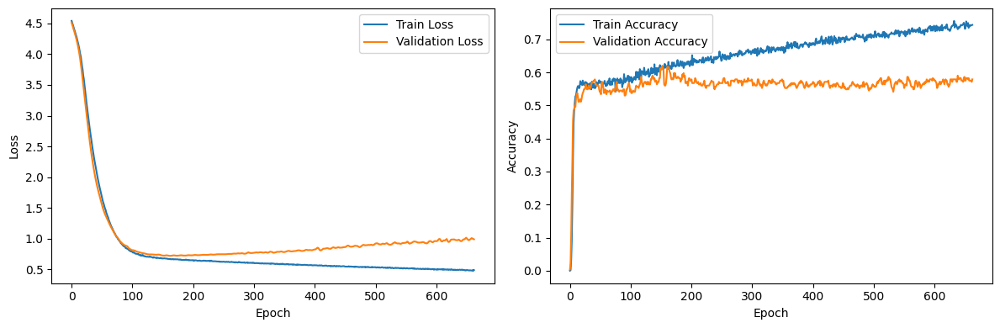


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2418, Val Loss: 4.1975, Train Acc: 0.5403, Val Acc: 0.5216
Epoch: 020, Train Loss: 3.6171, Val Loss: 3.5769, Train Acc: 0.5302, Val Acc: 0.5608
Epoch: 030, Train Loss: 2.6987, Val Loss: 2.7002, Train Acc: 0.5302, Val Acc: 0.5686
Epoch: 040, Train Loss: 1.9593, Val Loss: 2.0446, Train Acc: 0.5512, Val Acc: 0.5333
Epoch: 050, Train Loss: 1.5557, Val Loss: 1.6873, Train Acc: 0.5688, Val Acc: 0.5255
Epoch: 060, Train Loss: 1.3036, Val Loss: 1.4195, Train Acc: 0.5931, Val Acc: 0.5255
Epoch: 070, Train Loss: 1.1248, Val Loss: 1.2162, Train Acc: 0.5738, Val Acc: 0.5373
Epoch: 080, Train Loss: 0.9769, Val Loss: 1.0760, Train Acc: 0.5940, Val Acc: 0.5176
Epoch: 090, Train Loss: 0.8813, Val Loss: 0.9623, Train Acc: 0.5721, Val Acc: 0.5216
Epoch: 100, Train Loss: 0.8082, Val Loss: 0.8833, Train Acc: 0.5889, Val Acc: 0.5294
Epoch: 110, Train Loss: 0.7503, Val Loss: 0.8368, Tr

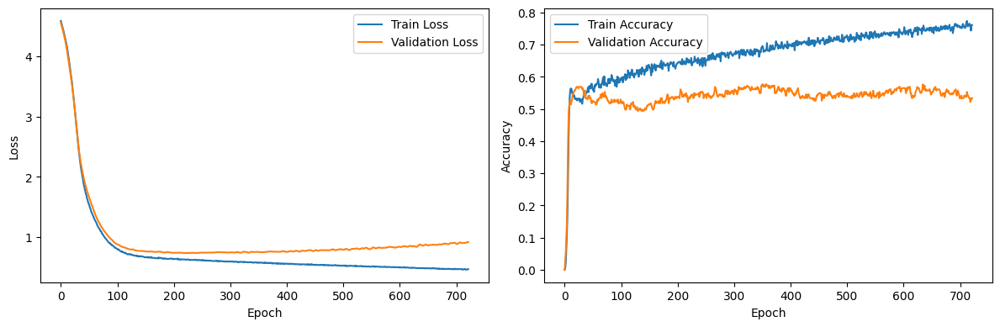


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2689, Val Loss: 4.2581, Train Acc: 0.5336, Val Acc: 0.4831
Epoch: 020, Train Loss: 3.7995, Val Loss: 3.8084, Train Acc: 0.5853, Val Acc: 0.4873
Epoch: 030, Train Loss: 2.9800, Val Loss: 3.0086, Train Acc: 0.5789, Val Acc: 0.4746
Epoch: 040, Train Loss: 2.1860, Val Loss: 2.2203, Train Acc: 0.5762, Val Acc: 0.5085
Epoch: 050, Train Loss: 1.6619, Val Loss: 1.6507, Train Acc: 0.5481, Val Acc: 0.5551
Epoch: 060, Train Loss: 1.3417, Val Loss: 1.3453, Train Acc: 0.5644, Val Acc: 0.5424
Epoch: 070, Train Loss: 1.1210, Val Loss: 1.1448, Train Acc: 0.5653, Val Acc: 0.5381
Epoch: 080, Train Loss: 0.9490, Val Loss: 0.9876, Train Acc: 0.5672, Val Acc: 0.5381
Epoch: 090, Train Loss: 0.8383, Val Loss: 0.8858, Train Acc: 0.5817, Val Acc: 0.5381
Epoch: 100, Train Loss: 0.7832, Val Loss: 0.8251, Train Acc: 0.5672, Val Acc: 0.5508
Epoch: 110, Train Loss: 0.7414, Val Loss: 0.7864, Tr

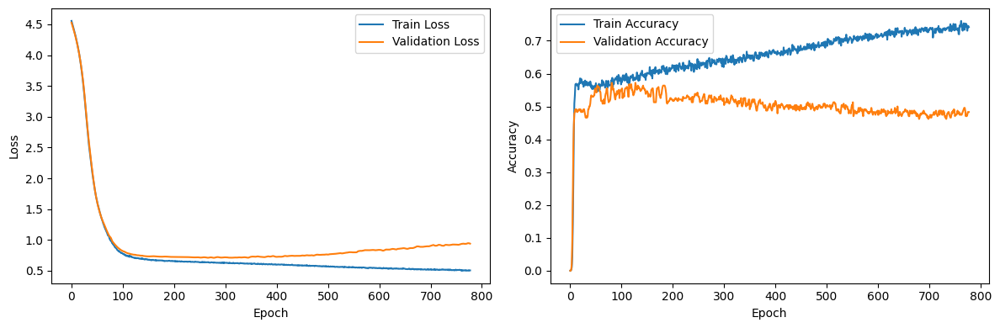


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1846, Val Loss: 4.1436, Train Acc: 0.5187, Val Acc: 0.5917
Epoch: 020, Train Loss: 3.4067, Val Loss: 3.2997, Train Acc: 0.5571, Val Acc: 0.6330
Epoch: 030, Train Loss: 2.5358, Val Loss: 2.4155, Train Acc: 0.5581, Val Acc: 0.6376
Epoch: 040, Train Loss: 2.0008, Val Loss: 1.8953, Train Acc: 0.5541, Val Acc: 0.6239
Epoch: 050, Train Loss: 1.6694, Val Loss: 1.5728, Train Acc: 0.5640, Val Acc: 0.6330
Epoch: 060, Train Loss: 1.4143, Val Loss: 1.3301, Train Acc: 0.5610, Val Acc: 0.6101
Epoch: 070, Train Loss: 1.1888, Val Loss: 1.1305, Train Acc: 0.5955, Val Acc: 0.5734
Epoch: 080, Train Loss: 1.0134, Val Loss: 0.9570, Train Acc: 0.5591, Val Acc: 0.6009
Epoch: 090, Train Loss: 0.8769, Val Loss: 0.8439, Train Acc: 0.5797, Val Acc: 0.6009
Epoch: 100, Train Loss: 0.8031, Val Loss: 0.7774, Train Acc: 0.5659, Val Acc: 0.6055
Epoch: 110, Train Loss: 0.7528, Val Loss: 0.7435, Tr

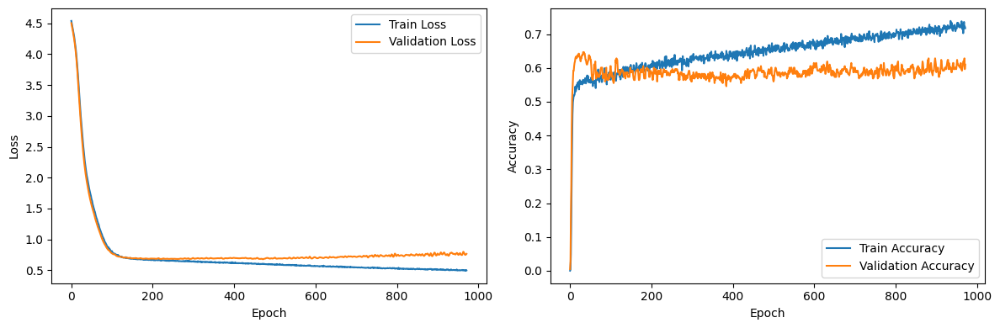


========== Run 12 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2821, Val Loss: 4.2325, Train Acc: 0.5165, Val Acc: 0.4962
Epoch: 020, Train Loss: 3.7130, Val Loss: 3.6156, Train Acc: 0.5689, Val Acc: 0.6090
Epoch: 030, Train Loss: 2.9513, Val Loss: 2.7970, Train Acc: 0.5504, Val Acc: 0.5602
Epoch: 040, Train Loss: 2.2202, Val Loss: 2.0191, Train Acc: 0.5737, Val Acc: 0.5714
Epoch: 050, Train Loss: 1.7259, Val Loss: 1.6055, Train Acc: 0.5721, Val Acc: 0.5526
Epoch: 060, Train Loss: 1.3754, Val Loss: 1.3192, Train Acc: 0.5761, Val Acc: 0.5489
Epoch: 070, Train Loss: 1.1334, Val Loss: 1.1110, Train Acc: 0.5850, Val Acc: 0.5451
Epoch: 080, Train Loss: 0.9564, Val Loss: 0.9668, Train Acc: 0.5842, Val Acc: 0.5451
Epoch: 090, Train Loss: 0.8462, Val Loss: 0.8692, Train Acc: 0.5778, Val Acc: 0.5263
Epoch: 100, Train Loss: 0.7780, Val Loss: 0.8064, Train Acc: 0.5850, Val Acc: 0.5564
Epoch: 110, Train Los

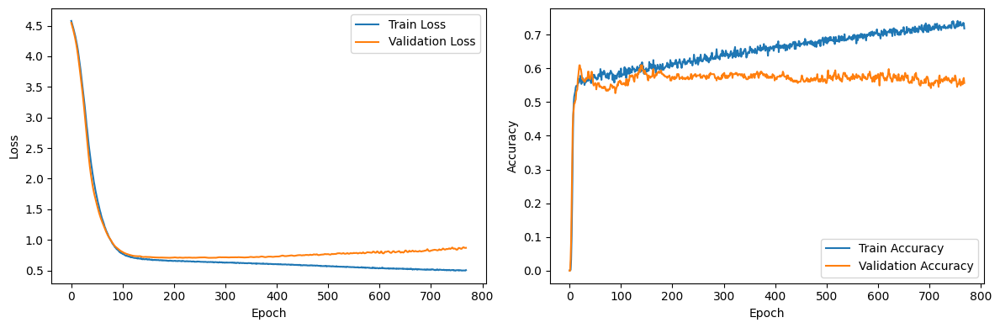


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2120, Val Loss: 4.1679, Train Acc: 0.4983, Val Acc: 0.5137
Epoch: 020, Train Loss: 3.5579, Val Loss: 3.5067, Train Acc: 0.5201, Val Acc: 0.5294
Epoch: 030, Train Loss: 2.6338, Val Loss: 2.6337, Train Acc: 0.5562, Val Acc: 0.5176
Epoch: 040, Train Loss: 1.8948, Val Loss: 1.9860, Train Acc: 0.5537, Val Acc: 0.4941
Epoch: 050, Train Loss: 1.4977, Val Loss: 1.5911, Train Acc: 0.5596, Val Acc: 0.4980
Epoch: 060, Train Loss: 1.2214, Val Loss: 1.3132, Train Acc: 0.5814, Val Acc: 0.5059
Epoch: 070, Train Loss: 1.0421, Val Loss: 1.1160, Train Acc: 0.5721, Val Acc: 0.5020
Epoch: 080, Train Loss: 0.9052, Val Loss: 0.9793, Train Acc: 0.5747, Val Acc: 0.5098
Epoch: 090, Train Loss: 0.8150, Val Loss: 0.8909, Train Acc: 0.5898, Val Acc: 0.5059
Epoch: 100, Train Loss: 0.7579, Val Loss: 0.8358, Train Acc: 0.5889, Val Acc: 0.5098
Epoch: 110, Train Loss: 0.7247, Val Loss: 0.8044, Tr

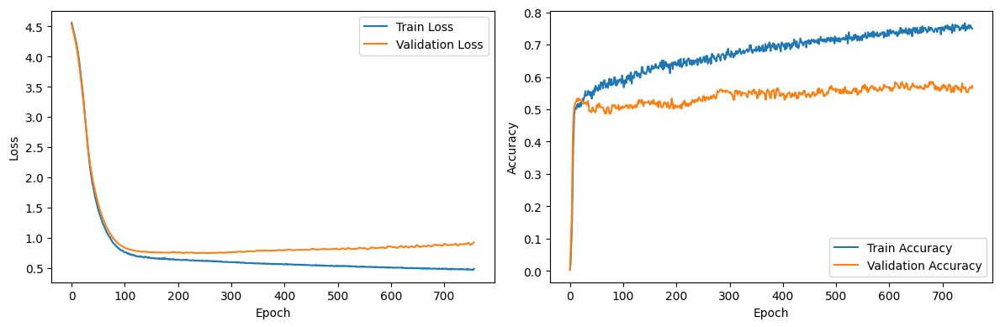


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2278, Val Loss: 4.2109, Train Acc: 0.5454, Val Acc: 0.5424
Epoch: 020, Train Loss: 3.7080, Val Loss: 3.7018, Train Acc: 0.5644, Val Acc: 0.5381
Epoch: 030, Train Loss: 2.7871, Val Loss: 2.8068, Train Acc: 0.5517, Val Acc: 0.5254
Epoch: 040, Train Loss: 2.1297, Val Loss: 2.1162, Train Acc: 0.5508, Val Acc: 0.5763
Epoch: 050, Train Loss: 1.6683, Val Loss: 1.6696, Train Acc: 0.5535, Val Acc: 0.5508
Epoch: 060, Train Loss: 1.3630, Val Loss: 1.3690, Train Acc: 0.5799, Val Acc: 0.5636
Epoch: 070, Train Loss: 1.1299, Val Loss: 1.1481, Train Acc: 0.5563, Val Acc: 0.5339
Epoch: 080, Train Loss: 0.9621, Val Loss: 0.9878, Train Acc: 0.5690, Val Acc: 0.5297
Epoch: 090, Train Loss: 0.8434, Val Loss: 0.8798, Train Acc: 0.5762, Val Acc: 0.5254
Epoch: 100, Train Loss: 0.7756, Val Loss: 0.8171, Train Acc: 0.5835, Val Acc: 0.5254
Epoch: 110, Train Loss: 0.7337, Val Loss: 0.7818, Tr

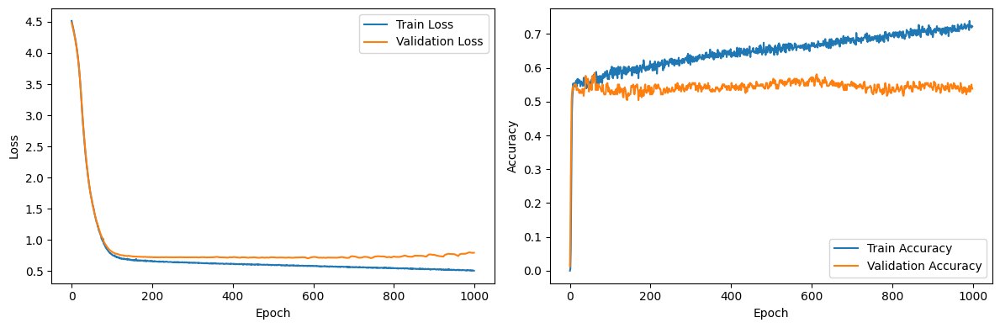


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1974, Val Loss: 4.1563, Train Acc: 0.5246, Val Acc: 0.6101
Epoch: 020, Train Loss: 3.5117, Val Loss: 3.4194, Train Acc: 0.5463, Val Acc: 0.5826
Epoch: 030, Train Loss: 2.6687, Val Loss: 2.5843, Train Acc: 0.5463, Val Acc: 0.5596
Epoch: 040, Train Loss: 2.0225, Val Loss: 1.9742, Train Acc: 0.5541, Val Acc: 0.5413
Epoch: 050, Train Loss: 1.6451, Val Loss: 1.5670, Train Acc: 0.5630, Val Acc: 0.6193
Epoch: 060, Train Loss: 1.3826, Val Loss: 1.2940, Train Acc: 0.5630, Val Acc: 0.6101
Epoch: 070, Train Loss: 1.1655, Val Loss: 1.0986, Train Acc: 0.5778, Val Acc: 0.5872
Epoch: 080, Train Loss: 0.9856, Val Loss: 0.9408, Train Acc: 0.5758, Val Acc: 0.5780
Epoch: 090, Train Loss: 0.8723, Val Loss: 0.8339, Train Acc: 0.5787, Val Acc: 0.5826
Epoch: 100, Train Loss: 0.7940, Val Loss: 0.7690, Train Acc: 0.5807, Val Acc: 0.5917
Epoch: 110, Train Loss: 0.7401, Val Loss: 0.7437, Tr

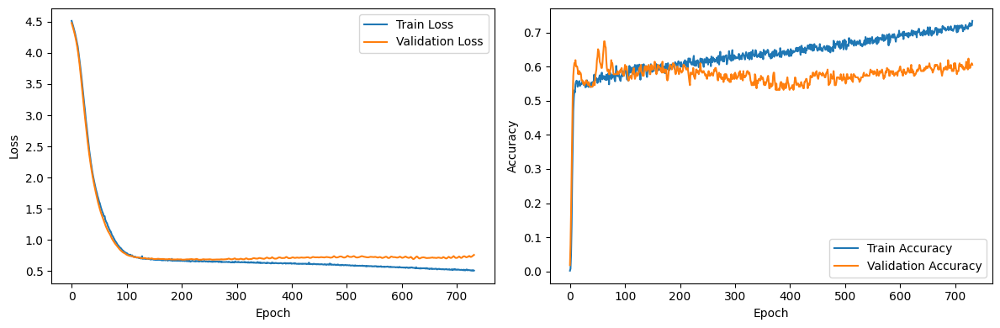


========== Run 13 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3135, Val Loss: 4.2489, Train Acc: 0.3046, Val Acc: 0.3421
Epoch: 020, Train Loss: 3.6731, Val Loss: 3.5026, Train Acc: 0.5681, Val Acc: 0.5038
Epoch: 030, Train Loss: 2.9120, Val Loss: 2.7026, Train Acc: 0.5552, Val Acc: 0.5263
Epoch: 040, Train Loss: 2.2428, Val Loss: 2.0412, Train Acc: 0.5737, Val Acc: 0.5113
Epoch: 050, Train Loss: 1.7306, Val Loss: 1.5959, Train Acc: 0.5649, Val Acc: 0.5301
Epoch: 060, Train Loss: 1.3633, Val Loss: 1.2973, Train Acc: 0.5729, Val Acc: 0.5301
Epoch: 070, Train Loss: 1.1110, Val Loss: 1.0906, Train Acc: 0.5721, Val Acc: 0.5489
Epoch: 080, Train Loss: 0.9385, Val Loss: 0.9386, Train Acc: 0.5657, Val Acc: 0.5564
Epoch: 090, Train Loss: 0.8305, Val Loss: 0.8539, Train Acc: 0.5874, Val Acc: 0.5376
Epoch: 100, Train Loss: 0.7762, Val Loss: 0.7975, Train Acc: 0.5826, Val Acc: 0.5414
Epoch: 110, Train Los

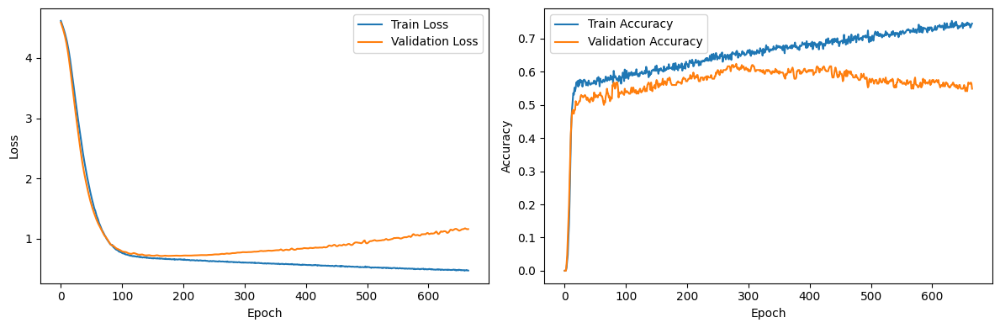


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2149, Val Loss: 4.1734, Train Acc: 0.4832, Val Acc: 0.4941
Epoch: 020, Train Loss: 3.5638, Val Loss: 3.5332, Train Acc: 0.4975, Val Acc: 0.5216
Epoch: 030, Train Loss: 2.6962, Val Loss: 2.7666, Train Acc: 0.5067, Val Acc: 0.5137
Epoch: 040, Train Loss: 2.0216, Val Loss: 2.1453, Train Acc: 0.5512, Val Acc: 0.4706
Epoch: 050, Train Loss: 1.6130, Val Loss: 1.7323, Train Acc: 0.5419, Val Acc: 0.5020
Epoch: 060, Train Loss: 1.3215, Val Loss: 1.4164, Train Acc: 0.5470, Val Acc: 0.4980
Epoch: 070, Train Loss: 1.1231, Val Loss: 1.1922, Train Acc: 0.5545, Val Acc: 0.5137
Epoch: 080, Train Loss: 0.9710, Val Loss: 1.0427, Train Acc: 0.5587, Val Acc: 0.5059
Epoch: 090, Train Loss: 0.8625, Val Loss: 0.9387, Train Acc: 0.5772, Val Acc: 0.5098
Epoch: 100, Train Loss: 0.7840, Val Loss: 0.8598, Train Acc: 0.5864, Val Acc: 0.5137
Epoch: 110, Train Loss: 0.7512, Val Loss: 0.8154, Tr

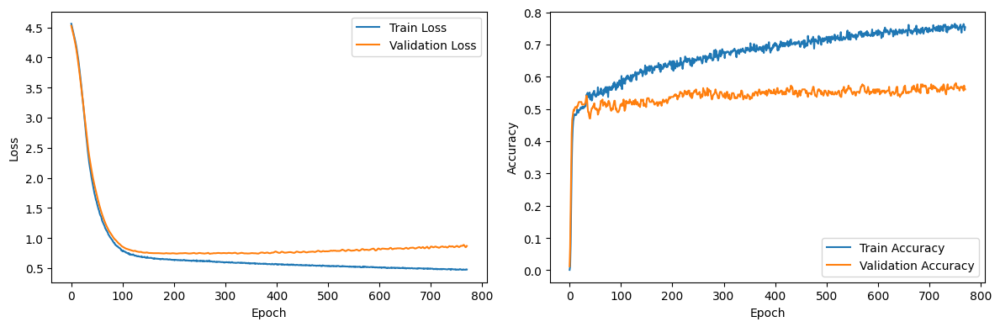


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3088, Val Loss: 4.3020, Train Acc: 0.4955, Val Acc: 0.4958
Epoch: 020, Train Loss: 3.7549, Val Loss: 3.7682, Train Acc: 0.5163, Val Acc: 0.5000
Epoch: 030, Train Loss: 2.9081, Val Loss: 2.9534, Train Acc: 0.5245, Val Acc: 0.4958
Epoch: 040, Train Loss: 2.2195, Val Loss: 2.2579, Train Acc: 0.5499, Val Acc: 0.5212
Epoch: 050, Train Loss: 1.7682, Val Loss: 1.7752, Train Acc: 0.5454, Val Acc: 0.4915
Epoch: 060, Train Loss: 1.4714, Val Loss: 1.4539, Train Acc: 0.5372, Val Acc: 0.5085
Epoch: 070, Train Loss: 1.2043, Val Loss: 1.2271, Train Acc: 0.5690, Val Acc: 0.5000
Epoch: 080, Train Loss: 1.0155, Val Loss: 1.0481, Train Acc: 0.5708, Val Acc: 0.4958
Epoch: 090, Train Loss: 0.8837, Val Loss: 0.9197, Train Acc: 0.5735, Val Acc: 0.5169
Epoch: 100, Train Loss: 0.7966, Val Loss: 0.8440, Train Acc: 0.5753, Val Acc: 0.5169
Epoch: 110, Train Loss: 0.7472, Val Loss: 0.7978, Tr

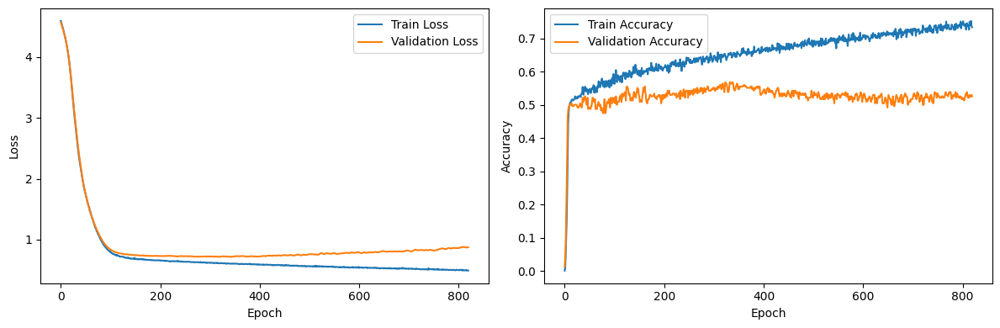


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1837, Val Loss: 4.1528, Train Acc: 0.5285, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.6156, Val Loss: 3.5577, Train Acc: 0.5561, Val Acc: 0.5138
Epoch: 030, Train Loss: 2.6687, Val Loss: 2.5753, Train Acc: 0.5482, Val Acc: 0.5229
Epoch: 040, Train Loss: 1.9848, Val Loss: 1.9055, Train Acc: 0.5541, Val Acc: 0.5872
Epoch: 050, Train Loss: 1.6040, Val Loss: 1.5344, Train Acc: 0.5610, Val Acc: 0.5963
Epoch: 060, Train Loss: 1.3331, Val Loss: 1.2544, Train Acc: 0.5659, Val Acc: 0.6193
Epoch: 070, Train Loss: 1.1238, Val Loss: 1.0548, Train Acc: 0.5709, Val Acc: 0.6330
Epoch: 080, Train Loss: 0.9608, Val Loss: 0.9188, Train Acc: 0.5492, Val Acc: 0.5917
Epoch: 090, Train Loss: 0.8580, Val Loss: 0.8280, Train Acc: 0.5778, Val Acc: 0.6055
Epoch: 100, Train Loss: 0.7757, Val Loss: 0.7728, Train Acc: 0.5866, Val Acc: 0.6009
Epoch: 110, Train Loss: 0.7465, Val Loss: 0.7412, Tr

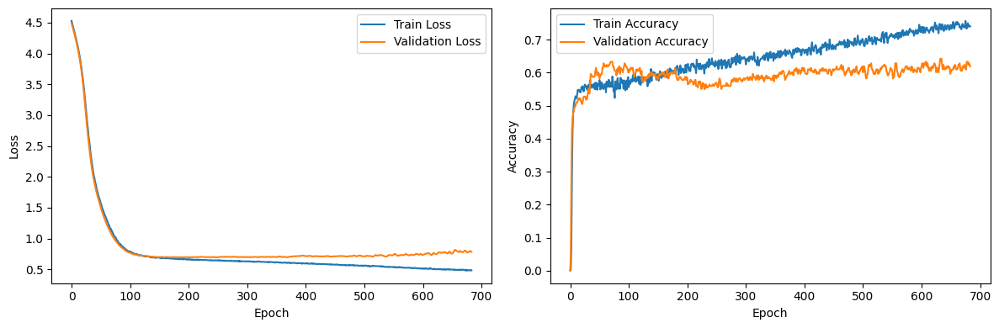


========== Run 14 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3297, Val Loss: 4.2660, Train Acc: 0.4819, Val Acc: 0.5038
Epoch: 020, Train Loss: 3.7077, Val Loss: 3.5003, Train Acc: 0.5504, Val Acc: 0.5414
Epoch: 030, Train Loss: 2.8073, Val Loss: 2.5686, Train Acc: 0.5439, Val Acc: 0.5113
Epoch: 040, Train Loss: 2.1672, Val Loss: 1.9723, Train Acc: 0.5447, Val Acc: 0.5150
Epoch: 050, Train Loss: 1.7057, Val Loss: 1.5878, Train Acc: 0.5689, Val Acc: 0.5000
Epoch: 060, Train Loss: 1.3603, Val Loss: 1.2909, Train Acc: 0.5890, Val Acc: 0.5263
Epoch: 070, Train Loss: 1.1098, Val Loss: 1.0934, Train Acc: 0.5850, Val Acc: 0.5226
Epoch: 080, Train Loss: 0.9368, Val Loss: 0.9532, Train Acc: 0.5761, Val Acc: 0.5150
Epoch: 090, Train Loss: 0.8347, Val Loss: 0.8577, Train Acc: 0.5673, Val Acc: 0.5376
Epoch: 100, Train Loss: 0.7731, Val Loss: 0.7991, Train Acc: 0.5745, Val Acc: 0.5564
Epoch: 110, Train Los

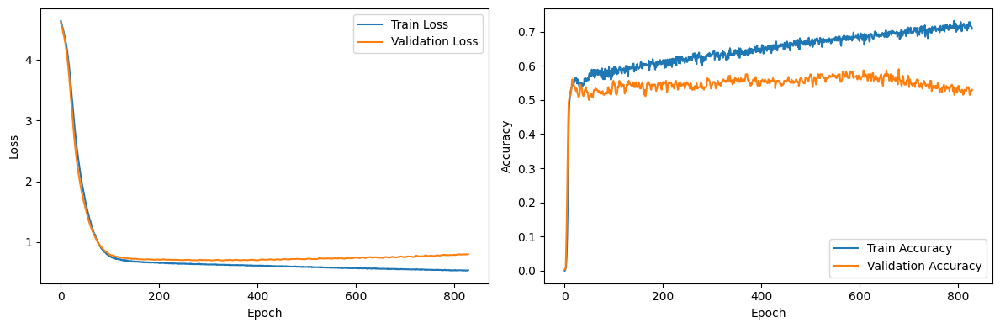


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2994, Val Loss: 4.2659, Train Acc: 0.4035, Val Acc: 0.4706
Epoch: 020, Train Loss: 3.6812, Val Loss: 3.6293, Train Acc: 0.5151, Val Acc: 0.5294
Epoch: 030, Train Loss: 2.7182, Val Loss: 2.7695, Train Acc: 0.5386, Val Acc: 0.5569
Epoch: 040, Train Loss: 2.0072, Val Loss: 2.1385, Train Acc: 0.5445, Val Acc: 0.5333
Epoch: 050, Train Loss: 1.6060, Val Loss: 1.7366, Train Acc: 0.5621, Val Acc: 0.5137
Epoch: 060, Train Loss: 1.3243, Val Loss: 1.4342, Train Acc: 0.5621, Val Acc: 0.5098
Epoch: 070, Train Loss: 1.1615, Val Loss: 1.2311, Train Acc: 0.5570, Val Acc: 0.5373
Epoch: 080, Train Loss: 0.9825, Val Loss: 1.0646, Train Acc: 0.5814, Val Acc: 0.4863
Epoch: 090, Train Loss: 0.9081, Val Loss: 0.9476, Train Acc: 0.5671, Val Acc: 0.5098
Epoch: 100, Train Loss: 0.8138, Val Loss: 0.8761, Train Acc: 0.5730, Val Acc: 0.5020
Epoch: 110, Train Loss: 0.7569, Val Loss: 0.8191, Tr

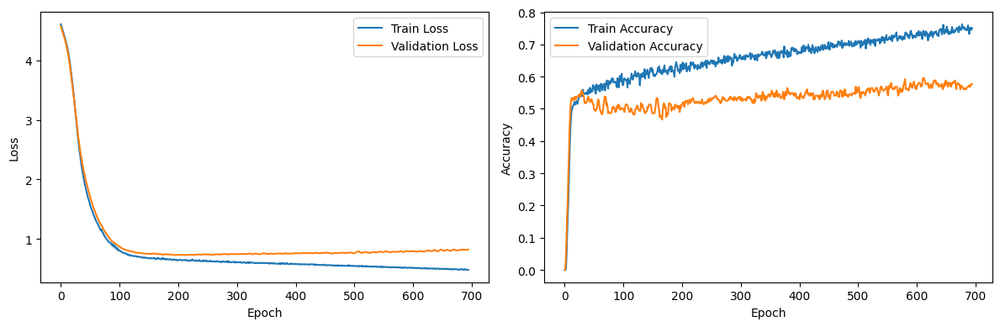


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2031, Val Loss: 4.1887, Train Acc: 0.5245, Val Acc: 0.4831
Epoch: 020, Train Loss: 3.6143, Val Loss: 3.6132, Train Acc: 0.5290, Val Acc: 0.5085
Epoch: 030, Train Loss: 2.7490, Val Loss: 2.7828, Train Acc: 0.5372, Val Acc: 0.5127
Epoch: 040, Train Loss: 2.1224, Val Loss: 2.1062, Train Acc: 0.5417, Val Acc: 0.5508
Epoch: 050, Train Loss: 1.7342, Val Loss: 1.7086, Train Acc: 0.5390, Val Acc: 0.5169
Epoch: 060, Train Loss: 1.4454, Val Loss: 1.4330, Train Acc: 0.5590, Val Acc: 0.5297
Epoch: 070, Train Loss: 1.2065, Val Loss: 1.2164, Train Acc: 0.5590, Val Acc: 0.5297
Epoch: 080, Train Loss: 1.0235, Val Loss: 1.0450, Train Acc: 0.5581, Val Acc: 0.5127
Epoch: 090, Train Loss: 0.9081, Val Loss: 0.9212, Train Acc: 0.5535, Val Acc: 0.5254
Epoch: 100, Train Loss: 0.8085, Val Loss: 0.8441, Train Acc: 0.5753, Val Acc: 0.5085
Epoch: 110, Train Loss: 0.7513, Val Loss: 0.8068, Tr

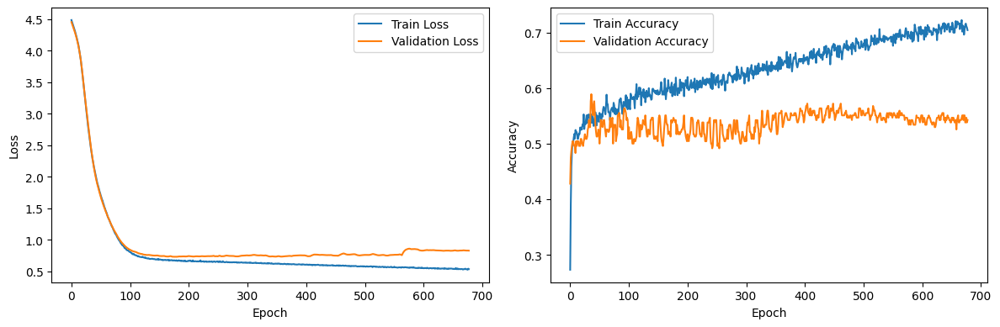


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2361, Val Loss: 4.1984, Train Acc: 0.4970, Val Acc: 0.5138
Epoch: 020, Train Loss: 3.5221, Val Loss: 3.4431, Train Acc: 0.5030, Val Acc: 0.5413
Epoch: 030, Train Loss: 2.6876, Val Loss: 2.5955, Train Acc: 0.5522, Val Acc: 0.5642
Epoch: 040, Train Loss: 2.0602, Val Loss: 1.9586, Train Acc: 0.5591, Val Acc: 0.6009
Epoch: 050, Train Loss: 1.6774, Val Loss: 1.6011, Train Acc: 0.5650, Val Acc: 0.5780
Epoch: 060, Train Loss: 1.3987, Val Loss: 1.3365, Train Acc: 0.5699, Val Acc: 0.5734
Epoch: 070, Train Loss: 1.1716, Val Loss: 1.1275, Train Acc: 0.5571, Val Acc: 0.5780
Epoch: 080, Train Loss: 1.0221, Val Loss: 0.9613, Train Acc: 0.5581, Val Acc: 0.5688
Epoch: 090, Train Loss: 0.8769, Val Loss: 0.8544, Train Acc: 0.5581, Val Acc: 0.5642
Epoch: 100, Train Loss: 0.7969, Val Loss: 0.7922, Train Acc: 0.5817, Val Acc: 0.5505
Epoch: 110, Train Loss: 0.7622, Val Loss: 0.7467, Tr

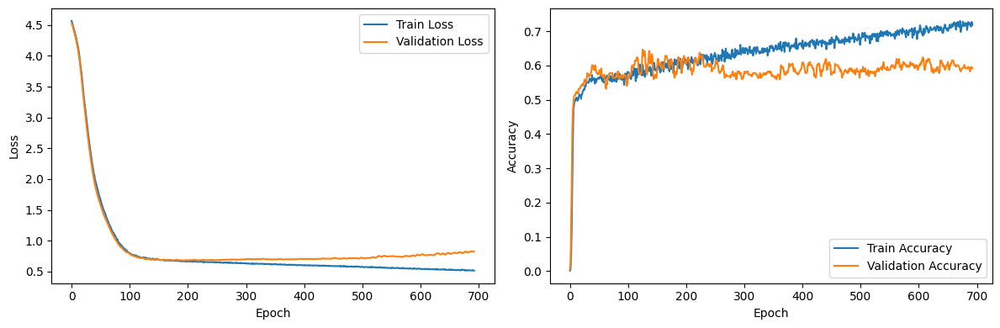


========== Run 15 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2660, Val Loss: 4.2274, Train Acc: 0.5101, Val Acc: 0.5188
Epoch: 020, Train Loss: 3.8284, Val Loss: 3.7287, Train Acc: 0.5794, Val Acc: 0.5602
Epoch: 030, Train Loss: 3.0448, Val Loss: 2.8688, Train Acc: 0.5866, Val Acc: 0.5827
Epoch: 040, Train Loss: 2.2510, Val Loss: 2.0529, Train Acc: 0.5713, Val Acc: 0.5639
Epoch: 050, Train Loss: 1.6924, Val Loss: 1.5615, Train Acc: 0.5512, Val Acc: 0.5677
Epoch: 060, Train Loss: 1.3239, Val Loss: 1.2555, Train Acc: 0.5721, Val Acc: 0.5451
Epoch: 070, Train Loss: 1.0867, Val Loss: 1.0602, Train Acc: 0.5737, Val Acc: 0.5526
Epoch: 080, Train Loss: 0.9187, Val Loss: 0.9243, Train Acc: 0.5874, Val Acc: 0.5489
Epoch: 090, Train Loss: 0.8298, Val Loss: 0.8508, Train Acc: 0.5818, Val Acc: 0.5338
Epoch: 100, Train Loss: 0.7720, Val Loss: 0.7909, Train Acc: 0.5939, Val Acc: 0.5714
Epoch: 110, Train Los

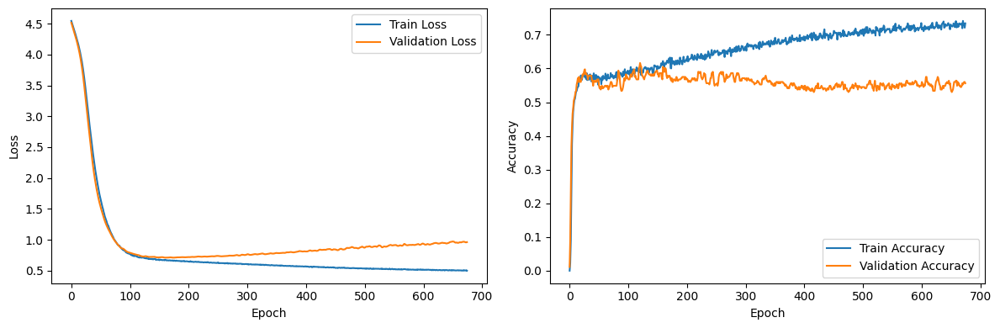


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1513, Val Loss: 4.0866, Train Acc: 0.5017, Val Acc: 0.4941
Epoch: 020, Train Loss: 3.3403, Val Loss: 3.3012, Train Acc: 0.5663, Val Acc: 0.5529
Epoch: 030, Train Loss: 2.3798, Val Loss: 2.4596, Train Acc: 0.5755, Val Acc: 0.5686
Epoch: 040, Train Loss: 1.8322, Val Loss: 1.9473, Train Acc: 0.5797, Val Acc: 0.5373
Epoch: 050, Train Loss: 1.4901, Val Loss: 1.6064, Train Acc: 0.5730, Val Acc: 0.5333
Epoch: 060, Train Loss: 1.2472, Val Loss: 1.3473, Train Acc: 0.5831, Val Acc: 0.5176
Epoch: 070, Train Loss: 1.0615, Val Loss: 1.1564, Train Acc: 0.6057, Val Acc: 0.5176
Epoch: 080, Train Loss: 0.9306, Val Loss: 1.0140, Train Acc: 0.5982, Val Acc: 0.5216
Epoch: 090, Train Loss: 0.8364, Val Loss: 0.9191, Train Acc: 0.6183, Val Acc: 0.5059
Epoch: 100, Train Loss: 0.7763, Val Loss: 0.8582, Train Acc: 0.6040, Val Acc: 0.5098
Epoch: 110, Train Loss: 0.7428, Val Loss: 0.8232, Tr

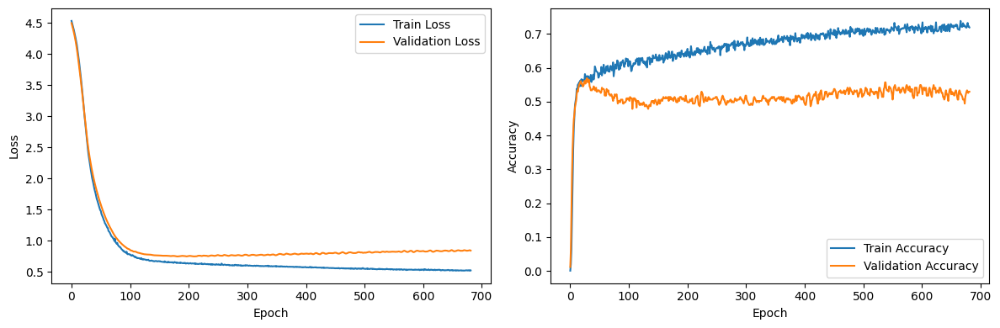


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2774, Val Loss: 4.2622, Train Acc: 0.4955, Val Acc: 0.4703
Epoch: 020, Train Loss: 3.5852, Val Loss: 3.5863, Train Acc: 0.5463, Val Acc: 0.5169
Epoch: 030, Train Loss: 2.6933, Val Loss: 2.7341, Train Acc: 0.5581, Val Acc: 0.5508
Epoch: 040, Train Loss: 2.0998, Val Loss: 2.0875, Train Acc: 0.5554, Val Acc: 0.5381
Epoch: 050, Train Loss: 1.6954, Val Loss: 1.6754, Train Acc: 0.5762, Val Acc: 0.5424
Epoch: 060, Train Loss: 1.4301, Val Loss: 1.4192, Train Acc: 0.5735, Val Acc: 0.5678
Epoch: 070, Train Loss: 1.2044, Val Loss: 1.2153, Train Acc: 0.5617, Val Acc: 0.5381
Epoch: 080, Train Loss: 1.0081, Val Loss: 1.0448, Train Acc: 0.5835, Val Acc: 0.5424
Epoch: 090, Train Loss: 0.8738, Val Loss: 0.9222, Train Acc: 0.5962, Val Acc: 0.5466
Epoch: 100, Train Loss: 0.8126, Val Loss: 0.8448, Train Acc: 0.5590, Val Acc: 0.5254
Epoch: 110, Train Loss: 0.7477, Val Loss: 0.7971, Tr

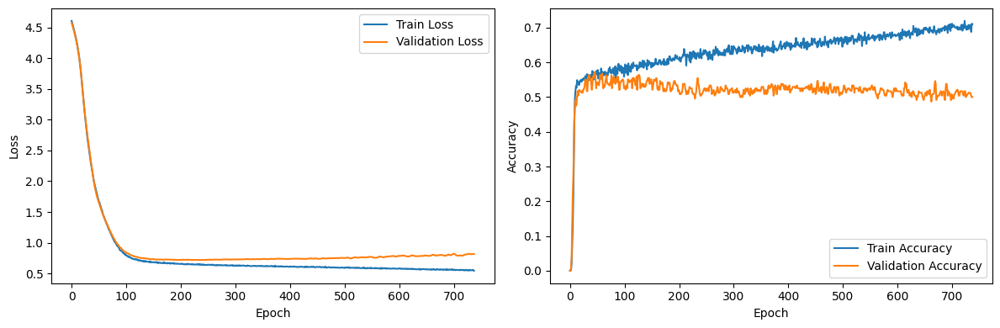


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1579, Val Loss: 4.0955, Train Acc: 0.5226, Val Acc: 0.6009
Epoch: 020, Train Loss: 3.3114, Val Loss: 3.2086, Train Acc: 0.5620, Val Acc: 0.5826
Epoch: 030, Train Loss: 2.4556, Val Loss: 2.3705, Train Acc: 0.5728, Val Acc: 0.5826
Epoch: 040, Train Loss: 1.9112, Val Loss: 1.8605, Train Acc: 0.5591, Val Acc: 0.5688
Epoch: 050, Train Loss: 1.5865, Val Loss: 1.5215, Train Acc: 0.5630, Val Acc: 0.5872
Epoch: 060, Train Loss: 1.3173, Val Loss: 1.2634, Train Acc: 0.5866, Val Acc: 0.5917
Epoch: 070, Train Loss: 1.1041, Val Loss: 1.0595, Train Acc: 0.5699, Val Acc: 0.5780
Epoch: 080, Train Loss: 0.9275, Val Loss: 0.9083, Train Acc: 0.5709, Val Acc: 0.5826
Epoch: 090, Train Loss: 0.8251, Val Loss: 0.8202, Train Acc: 0.5846, Val Acc: 0.5917
Epoch: 100, Train Loss: 0.7863, Val Loss: 0.7723, Train Acc: 0.5600, Val Acc: 0.5963
Epoch: 110, Train Loss: 0.7343, Val Loss: 0.7422, Tr

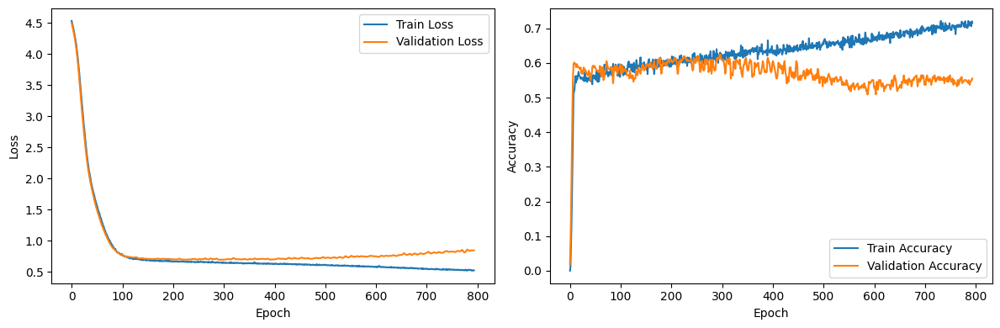


========== Run 16 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1839, Val Loss: 4.1281, Train Acc: 0.5504, Val Acc: 0.5451
Epoch: 020, Train Loss: 3.6455, Val Loss: 3.5085, Train Acc: 0.5842, Val Acc: 0.5639
Epoch: 030, Train Loss: 2.7554, Val Loss: 2.5280, Train Acc: 0.5761, Val Acc: 0.5677
Epoch: 040, Train Loss: 2.0379, Val Loss: 1.8520, Train Acc: 0.5826, Val Acc: 0.5677
Epoch: 050, Train Loss: 1.5470, Val Loss: 1.4337, Train Acc: 0.5778, Val Acc: 0.5564
Epoch: 060, Train Loss: 1.2160, Val Loss: 1.1740, Train Acc: 0.5907, Val Acc: 0.5263
Epoch: 070, Train Loss: 0.9982, Val Loss: 0.9842, Train Acc: 0.5737, Val Acc: 0.5414
Epoch: 080, Train Loss: 0.8605, Val Loss: 0.8711, Train Acc: 0.5866, Val Acc: 0.5451
Epoch: 090, Train Loss: 0.7850, Val Loss: 0.8061, Train Acc: 0.5955, Val Acc: 0.5526
Epoch: 100, Train Loss: 0.7356, Val Loss: 0.7692, Train Acc: 0.5907, Val Acc: 0.5451
Epoch: 110, Train Los

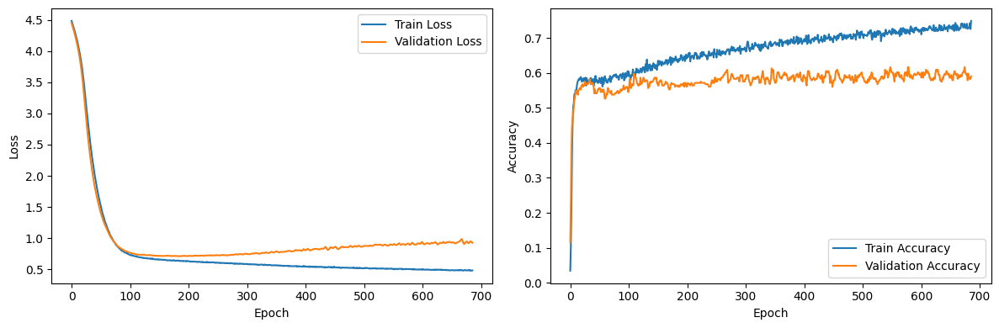


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1085, Val Loss: 4.0591, Train Acc: 0.5705, Val Acc: 0.5216
Epoch: 020, Train Loss: 3.4040, Val Loss: 3.3551, Train Acc: 0.5982, Val Acc: 0.5373
Epoch: 030, Train Loss: 2.5043, Val Loss: 2.5388, Train Acc: 0.5721, Val Acc: 0.5451
Epoch: 040, Train Loss: 1.8740, Val Loss: 1.9746, Train Acc: 0.5797, Val Acc: 0.5529
Epoch: 050, Train Loss: 1.4807, Val Loss: 1.5935, Train Acc: 0.5872, Val Acc: 0.4941
Epoch: 060, Train Loss: 1.2267, Val Loss: 1.3129, Train Acc: 0.5889, Val Acc: 0.5098
Epoch: 070, Train Loss: 1.0357, Val Loss: 1.1171, Train Acc: 0.5755, Val Acc: 0.5255
Epoch: 080, Train Loss: 0.9031, Val Loss: 0.9887, Train Acc: 0.5923, Val Acc: 0.5176
Epoch: 090, Train Loss: 0.8199, Val Loss: 0.9070, Train Acc: 0.5965, Val Acc: 0.5333
Epoch: 100, Train Loss: 0.7632, Val Loss: 0.8472, Train Acc: 0.5990, Val Acc: 0.5216
Epoch: 110, Train Loss: 0.7303, Val Loss: 0.8097, Tr

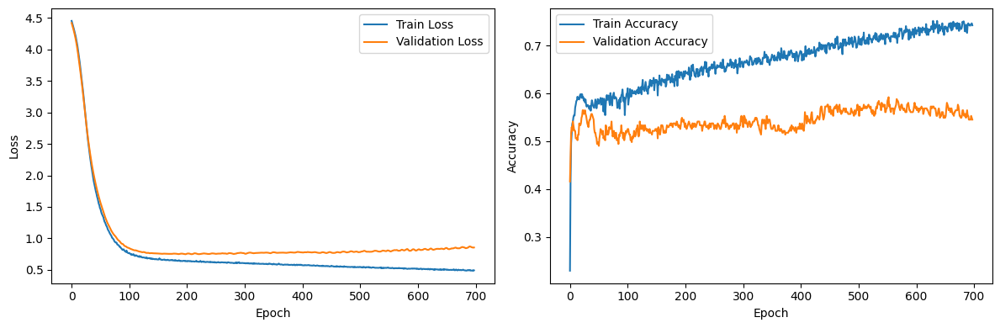


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2715, Val Loss: 4.2586, Train Acc: 0.4691, Val Acc: 0.4873
Epoch: 020, Train Loss: 3.6704, Val Loss: 3.6867, Train Acc: 0.5009, Val Acc: 0.5000
Epoch: 030, Train Loss: 2.8185, Val Loss: 2.8521, Train Acc: 0.5045, Val Acc: 0.5000
Epoch: 040, Train Loss: 2.1402, Val Loss: 2.1330, Train Acc: 0.5073, Val Acc: 0.5212
Epoch: 050, Train Loss: 1.7314, Val Loss: 1.7049, Train Acc: 0.5064, Val Acc: 0.5127
Epoch: 060, Train Loss: 1.4411, Val Loss: 1.4372, Train Acc: 0.5272, Val Acc: 0.4831
Epoch: 070, Train Loss: 1.2073, Val Loss: 1.2154, Train Acc: 0.5254, Val Acc: 0.5127
Epoch: 080, Train Loss: 1.0253, Val Loss: 1.0386, Train Acc: 0.5309, Val Acc: 0.5212
Epoch: 090, Train Loss: 0.8958, Val Loss: 0.9207, Train Acc: 0.5281, Val Acc: 0.5169
Epoch: 100, Train Loss: 0.8027, Val Loss: 0.8482, Train Acc: 0.5517, Val Acc: 0.5085
Epoch: 110, Train Loss: 0.7514, Val Loss: 0.7980, Tr

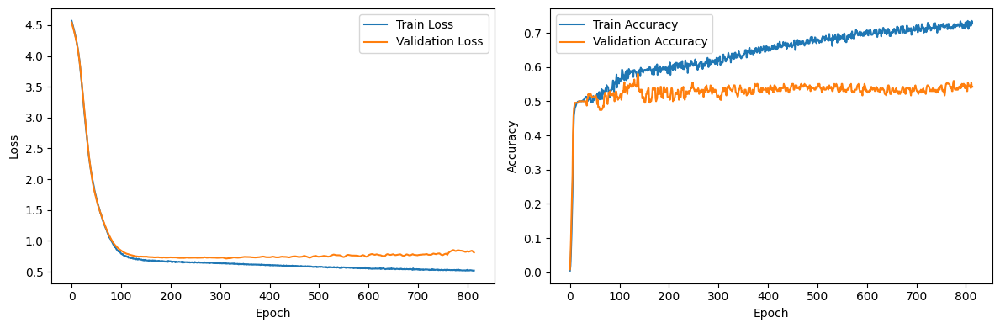


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2173, Val Loss: 4.1871, Train Acc: 0.4941, Val Acc: 0.5367
Epoch: 020, Train Loss: 3.4479, Val Loss: 3.3802, Train Acc: 0.5266, Val Acc: 0.5275
Epoch: 030, Train Loss: 2.5491, Val Loss: 2.4702, Train Acc: 0.5226, Val Acc: 0.5092
Epoch: 040, Train Loss: 1.9599, Val Loss: 1.9163, Train Acc: 0.5295, Val Acc: 0.5138
Epoch: 050, Train Loss: 1.6382, Val Loss: 1.5525, Train Acc: 0.5571, Val Acc: 0.5872
Epoch: 060, Train Loss: 1.3620, Val Loss: 1.2893, Train Acc: 0.5837, Val Acc: 0.5963
Epoch: 070, Train Loss: 1.1548, Val Loss: 1.0953, Train Acc: 0.5679, Val Acc: 0.6009
Epoch: 080, Train Loss: 0.9829, Val Loss: 0.9372, Train Acc: 0.5837, Val Acc: 0.6101
Epoch: 090, Train Loss: 0.8650, Val Loss: 0.8357, Train Acc: 0.5866, Val Acc: 0.6147
Epoch: 100, Train Loss: 0.7946, Val Loss: 0.7692, Train Acc: 0.5571, Val Acc: 0.6468
Epoch: 110, Train Loss: 0.7738, Val Loss: 0.7448, Tr

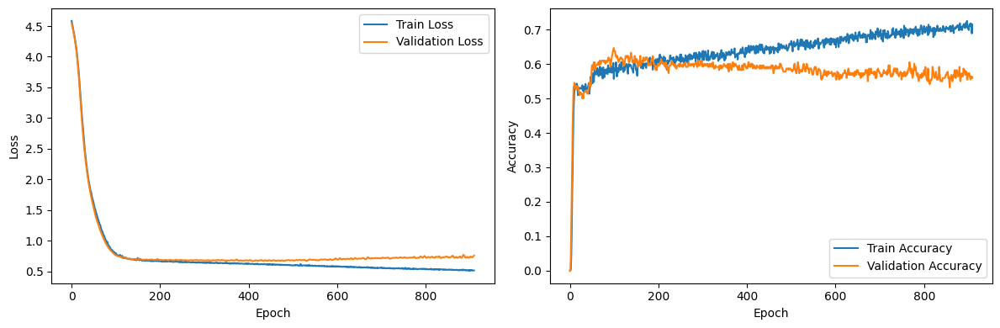


========== Run 17 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3668, Val Loss: 4.3154, Train Acc: 0.2168, Val Acc: 0.2444
Epoch: 020, Train Loss: 3.8354, Val Loss: 3.6997, Train Acc: 0.5689, Val Acc: 0.5865
Epoch: 030, Train Loss: 2.9797, Val Loss: 2.7633, Train Acc: 0.5705, Val Acc: 0.5865
Epoch: 040, Train Loss: 2.2405, Val Loss: 2.0317, Train Acc: 0.5665, Val Acc: 0.5602
Epoch: 050, Train Loss: 1.7401, Val Loss: 1.6124, Train Acc: 0.5713, Val Acc: 0.5526
Epoch: 060, Train Loss: 1.3895, Val Loss: 1.3195, Train Acc: 0.5786, Val Acc: 0.5376
Epoch: 070, Train Loss: 1.1336, Val Loss: 1.0987, Train Acc: 0.5753, Val Acc: 0.5639
Epoch: 080, Train Loss: 0.9575, Val Loss: 0.9585, Train Acc: 0.5745, Val Acc: 0.5414
Epoch: 090, Train Loss: 0.8469, Val Loss: 0.8608, Train Acc: 0.5721, Val Acc: 0.5526
Epoch: 100, Train Loss: 0.7764, Val Loss: 0.7972, Train Acc: 0.5753, Val Acc: 0.5451
Epoch: 110, Train Los

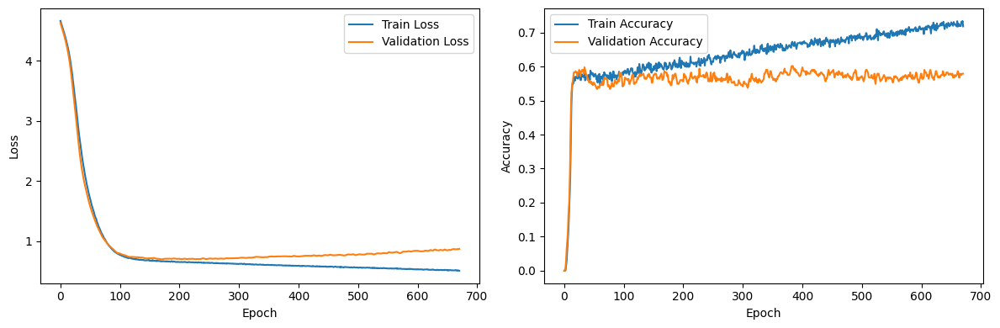


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3800, Val Loss: 4.3424, Train Acc: 0.3364, Val Acc: 0.4000
Epoch: 020, Train Loss: 3.8190, Val Loss: 3.7552, Train Acc: 0.5134, Val Acc: 0.5333
Epoch: 030, Train Loss: 2.9081, Val Loss: 2.8991, Train Acc: 0.5210, Val Acc: 0.5529
Epoch: 040, Train Loss: 2.1309, Val Loss: 2.2265, Train Acc: 0.5654, Val Acc: 0.5686
Epoch: 050, Train Loss: 1.6826, Val Loss: 1.7851, Train Acc: 0.5763, Val Acc: 0.5412
Epoch: 060, Train Loss: 1.3563, Val Loss: 1.4612, Train Acc: 0.5889, Val Acc: 0.5294
Epoch: 070, Train Loss: 1.1347, Val Loss: 1.2259, Train Acc: 0.6040, Val Acc: 0.5020
Epoch: 080, Train Loss: 0.9719, Val Loss: 1.0552, Train Acc: 0.5923, Val Acc: 0.4784
Epoch: 090, Train Loss: 0.8600, Val Loss: 0.9404, Train Acc: 0.6015, Val Acc: 0.4902
Epoch: 100, Train Loss: 0.7842, Val Loss: 0.8636, Train Acc: 0.6141, Val Acc: 0.4824
Epoch: 110, Train Loss: 0.7319, Val Loss: 0.8155, Tr

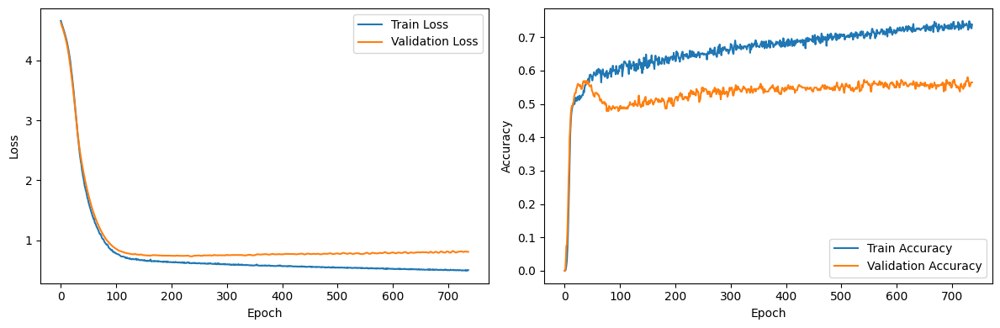


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3088, Val Loss: 4.2921, Train Acc: 0.4882, Val Acc: 0.4873
Epoch: 020, Train Loss: 3.8556, Val Loss: 3.8465, Train Acc: 0.5082, Val Acc: 0.4915
Epoch: 030, Train Loss: 3.0442, Val Loss: 3.0506, Train Acc: 0.5118, Val Acc: 0.4915
Epoch: 040, Train Loss: 2.2219, Val Loss: 2.2471, Train Acc: 0.5281, Val Acc: 0.4534
Epoch: 050, Train Loss: 1.7343, Val Loss: 1.7547, Train Acc: 0.5254, Val Acc: 0.4746
Epoch: 060, Train Loss: 1.4362, Val Loss: 1.4452, Train Acc: 0.5599, Val Acc: 0.5000
Epoch: 070, Train Loss: 1.2017, Val Loss: 1.2140, Train Acc: 0.5472, Val Acc: 0.4958
Epoch: 080, Train Loss: 1.0110, Val Loss: 1.0432, Train Acc: 0.5599, Val Acc: 0.5254
Epoch: 090, Train Loss: 0.8840, Val Loss: 0.9157, Train Acc: 0.5535, Val Acc: 0.5508
Epoch: 100, Train Loss: 0.7876, Val Loss: 0.8387, Train Acc: 0.5862, Val Acc: 0.5339
Epoch: 110, Train Loss: 0.7432, Val Loss: 0.7908, Tr

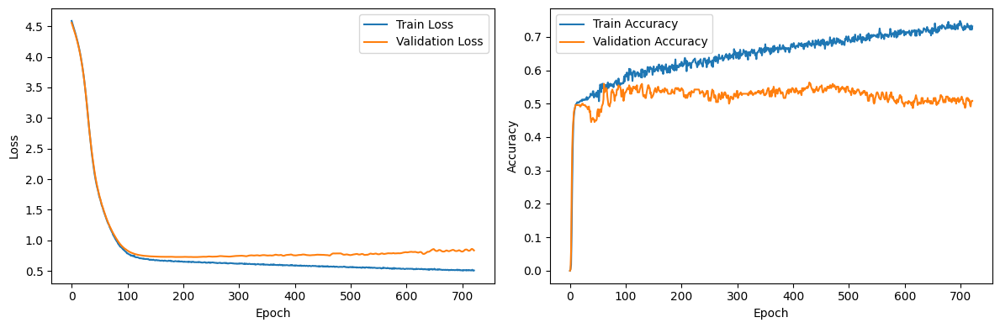


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2211, Val Loss: 4.1882, Train Acc: 0.4803, Val Acc: 0.4862
Epoch: 020, Train Loss: 3.4816, Val Loss: 3.4085, Train Acc: 0.5079, Val Acc: 0.5046
Epoch: 030, Train Loss: 2.6730, Val Loss: 2.6123, Train Acc: 0.5197, Val Acc: 0.5092
Epoch: 040, Train Loss: 2.0539, Val Loss: 2.0287, Train Acc: 0.5187, Val Acc: 0.5092
Epoch: 050, Train Loss: 1.6530, Val Loss: 1.6014, Train Acc: 0.5404, Val Acc: 0.5321
Epoch: 060, Train Loss: 1.3651, Val Loss: 1.2927, Train Acc: 0.5354, Val Acc: 0.5872
Epoch: 070, Train Loss: 1.1327, Val Loss: 1.0718, Train Acc: 0.5502, Val Acc: 0.5780
Epoch: 080, Train Loss: 0.9631, Val Loss: 0.9158, Train Acc: 0.5531, Val Acc: 0.5780
Epoch: 090, Train Loss: 0.8489, Val Loss: 0.8100, Train Acc: 0.5709, Val Acc: 0.5917
Epoch: 100, Train Loss: 0.7783, Val Loss: 0.7525, Train Acc: 0.5827, Val Acc: 0.5872
Epoch: 110, Train Loss: 0.7317, Val Loss: 0.7288, Tr

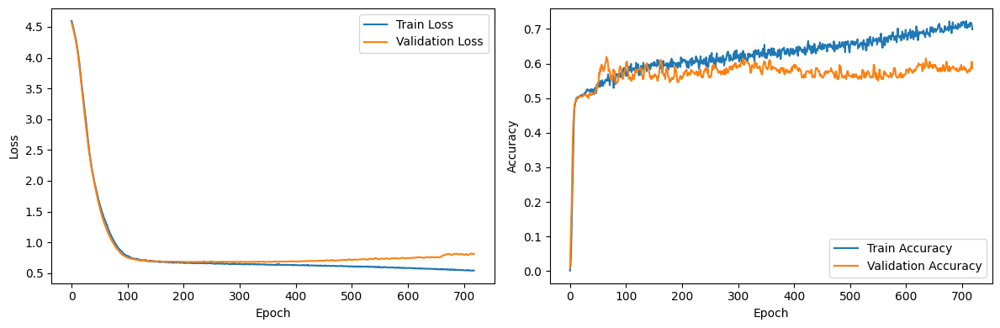


========== Run 18 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2178, Val Loss: 4.1517, Train Acc: 0.4835, Val Acc: 0.4549
Epoch: 020, Train Loss: 3.5679, Val Loss: 3.4302, Train Acc: 0.5399, Val Acc: 0.4850
Epoch: 030, Train Loss: 2.7273, Val Loss: 2.5324, Train Acc: 0.5552, Val Acc: 0.5000
Epoch: 040, Train Loss: 2.0501, Val Loss: 1.8678, Train Acc: 0.5415, Val Acc: 0.5226
Epoch: 050, Train Loss: 1.5895, Val Loss: 1.4936, Train Acc: 0.5544, Val Acc: 0.5000
Epoch: 060, Train Loss: 1.2806, Val Loss: 1.2357, Train Acc: 0.5528, Val Acc: 0.5338
Epoch: 070, Train Loss: 1.0743, Val Loss: 1.0639, Train Acc: 0.5705, Val Acc: 0.5226
Epoch: 080, Train Loss: 0.9280, Val Loss: 0.9459, Train Acc: 0.5681, Val Acc: 0.5526
Epoch: 090, Train Loss: 0.8288, Val Loss: 0.8503, Train Acc: 0.5745, Val Acc: 0.5526
Epoch: 100, Train Loss: 0.7726, Val Loss: 0.7979, Train Acc: 0.5778, Val Acc: 0.5602
Epoch: 110, Train Los

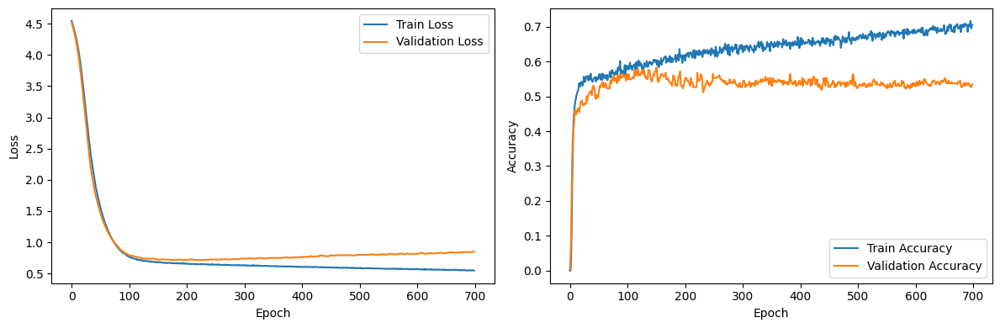


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1239, Val Loss: 4.0746, Train Acc: 0.4975, Val Acc: 0.5137
Epoch: 020, Train Loss: 3.3779, Val Loss: 3.3569, Train Acc: 0.5126, Val Acc: 0.5176
Epoch: 030, Train Loss: 2.4473, Val Loss: 2.5116, Train Acc: 0.5369, Val Acc: 0.5176
Epoch: 040, Train Loss: 1.8574, Val Loss: 1.9397, Train Acc: 0.5336, Val Acc: 0.5490
Epoch: 050, Train Loss: 1.4640, Val Loss: 1.5611, Train Acc: 0.5789, Val Acc: 0.5255
Epoch: 060, Train Loss: 1.1976, Val Loss: 1.2777, Train Acc: 0.5831, Val Acc: 0.5529
Epoch: 070, Train Loss: 1.0093, Val Loss: 1.0891, Train Acc: 0.5990, Val Acc: 0.5412
Epoch: 080, Train Loss: 0.8899, Val Loss: 0.9489, Train Acc: 0.5671, Val Acc: 0.5176
Epoch: 090, Train Loss: 0.7909, Val Loss: 0.8713, Train Acc: 0.5931, Val Acc: 0.5059
Epoch: 100, Train Loss: 0.7421, Val Loss: 0.8115, Train Acc: 0.5998, Val Acc: 0.5098
Epoch: 110, Train Loss: 0.7115, Val Loss: 0.7911, Tr

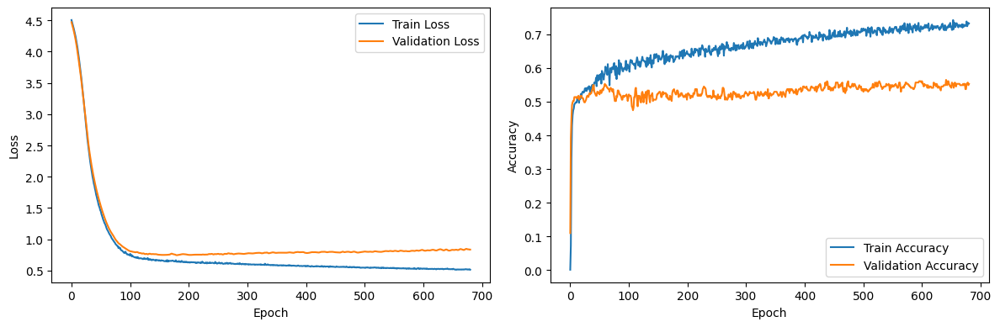


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2558, Val Loss: 4.2379, Train Acc: 0.4918, Val Acc: 0.4958
Epoch: 020, Train Loss: 3.6211, Val Loss: 3.5964, Train Acc: 0.5272, Val Acc: 0.4915
Epoch: 030, Train Loss: 2.7182, Val Loss: 2.7348, Train Acc: 0.5454, Val Acc: 0.4958
Epoch: 040, Train Loss: 2.0878, Val Loss: 2.0837, Train Acc: 0.5436, Val Acc: 0.5678
Epoch: 050, Train Loss: 1.7167, Val Loss: 1.7231, Train Acc: 0.5608, Val Acc: 0.5297
Epoch: 060, Train Loss: 1.4330, Val Loss: 1.4421, Train Acc: 0.5690, Val Acc: 0.5212
Epoch: 070, Train Loss: 1.1793, Val Loss: 1.2051, Train Acc: 0.5744, Val Acc: 0.5678
Epoch: 080, Train Loss: 0.9978, Val Loss: 1.0269, Train Acc: 0.5608, Val Acc: 0.5297
Epoch: 090, Train Loss: 0.8636, Val Loss: 0.9058, Train Acc: 0.5635, Val Acc: 0.4958
Epoch: 100, Train Loss: 0.7833, Val Loss: 0.8313, Train Acc: 0.5799, Val Acc: 0.5297
Epoch: 110, Train Loss: 0.7417, Val Loss: 0.7950, Tr

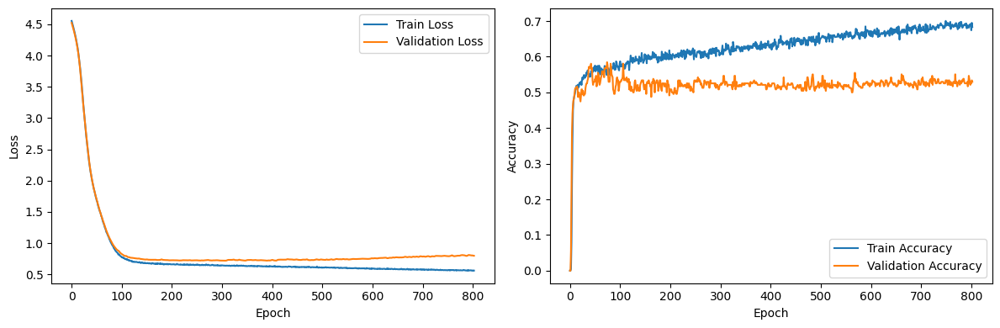


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3075, Val Loss: 4.2683, Train Acc: 0.2451, Val Acc: 0.3211
Epoch: 020, Train Loss: 3.5388, Val Loss: 3.4475, Train Acc: 0.5335, Val Acc: 0.5734
Epoch: 030, Train Loss: 2.6742, Val Loss: 2.5406, Train Acc: 0.5335, Val Acc: 0.6239
Epoch: 040, Train Loss: 2.1127, Val Loss: 2.0069, Train Acc: 0.5472, Val Acc: 0.6284
Epoch: 050, Train Loss: 1.7830, Val Loss: 1.6851, Train Acc: 0.5600, Val Acc: 0.6330
Epoch: 060, Train Loss: 1.5172, Val Loss: 1.4405, Train Acc: 0.5571, Val Acc: 0.5734
Epoch: 070, Train Loss: 1.2649, Val Loss: 1.2027, Train Acc: 0.5768, Val Acc: 0.6101
Epoch: 080, Train Loss: 1.0719, Val Loss: 1.0152, Train Acc: 0.5591, Val Acc: 0.6147
Epoch: 090, Train Loss: 0.9228, Val Loss: 0.8840, Train Acc: 0.5807, Val Acc: 0.5872
Epoch: 100, Train Loss: 0.8239, Val Loss: 0.7990, Train Acc: 0.5837, Val Acc: 0.5917
Epoch: 110, Train Loss: 0.7643, Val Loss: 0.7481, Tr

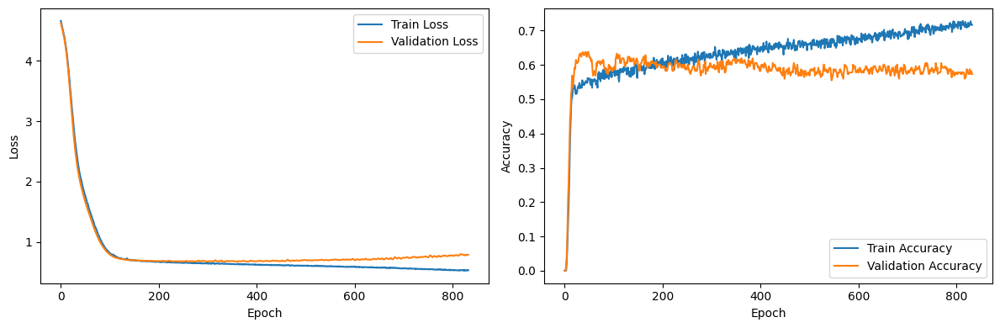


========== Run 19 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2262, Val Loss: 4.1615, Train Acc: 0.5205, Val Acc: 0.4812
Epoch: 020, Train Loss: 3.6138, Val Loss: 3.4488, Train Acc: 0.5528, Val Acc: 0.5414
Epoch: 030, Train Loss: 2.8832, Val Loss: 2.6706, Train Acc: 0.5794, Val Acc: 0.5414
Epoch: 040, Train Loss: 2.2199, Val Loss: 2.0173, Train Acc: 0.5649, Val Acc: 0.5827
Epoch: 050, Train Loss: 1.7125, Val Loss: 1.5723, Train Acc: 0.5705, Val Acc: 0.5564
Epoch: 060, Train Loss: 1.3447, Val Loss: 1.2815, Train Acc: 0.5633, Val Acc: 0.5376
Epoch: 070, Train Loss: 1.0912, Val Loss: 1.0757, Train Acc: 0.5794, Val Acc: 0.5489
Epoch: 080, Train Loss: 0.9257, Val Loss: 0.9390, Train Acc: 0.5858, Val Acc: 0.5451
Epoch: 090, Train Loss: 0.8226, Val Loss: 0.8509, Train Acc: 0.5834, Val Acc: 0.5414
Epoch: 100, Train Loss: 0.7652, Val Loss: 0.7919, Train Acc: 0.5834, Val Acc: 0.5526
Epoch: 110, Train Los

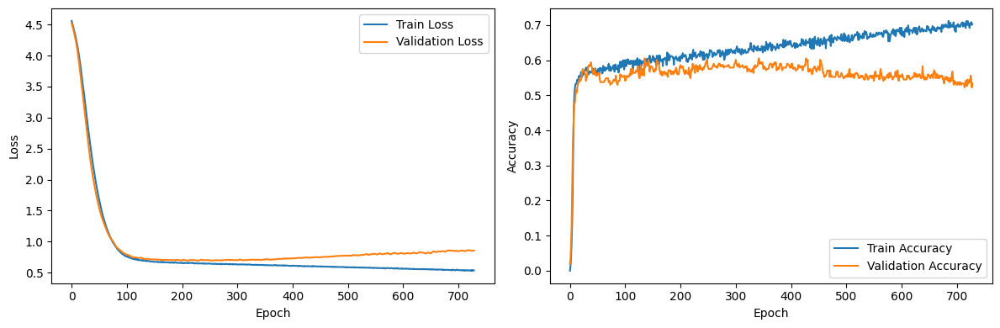


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2037, Val Loss: 4.1454, Train Acc: 0.5361, Val Acc: 0.5608
Epoch: 020, Train Loss: 3.5670, Val Loss: 3.4974, Train Acc: 0.5612, Val Acc: 0.5882
Epoch: 030, Train Loss: 2.6615, Val Loss: 2.6716, Train Acc: 0.5503, Val Acc: 0.5451
Epoch: 040, Train Loss: 1.9668, Val Loss: 2.0700, Train Acc: 0.5688, Val Acc: 0.5529
Epoch: 050, Train Loss: 1.5778, Val Loss: 1.6766, Train Acc: 0.5570, Val Acc: 0.5255
Epoch: 060, Train Loss: 1.2866, Val Loss: 1.3847, Train Acc: 0.5763, Val Acc: 0.5373
Epoch: 070, Train Loss: 1.0811, Val Loss: 1.1802, Train Acc: 0.5998, Val Acc: 0.5373
Epoch: 080, Train Loss: 0.9468, Val Loss: 1.0280, Train Acc: 0.5705, Val Acc: 0.5255
Epoch: 090, Train Loss: 0.8441, Val Loss: 0.9202, Train Acc: 0.5923, Val Acc: 0.5137
Epoch: 100, Train Loss: 0.7730, Val Loss: 0.8720, Train Acc: 0.5940, Val Acc: 0.5255
Epoch: 110, Train Loss: 0.7283, Val Loss: 0.8176, Tr

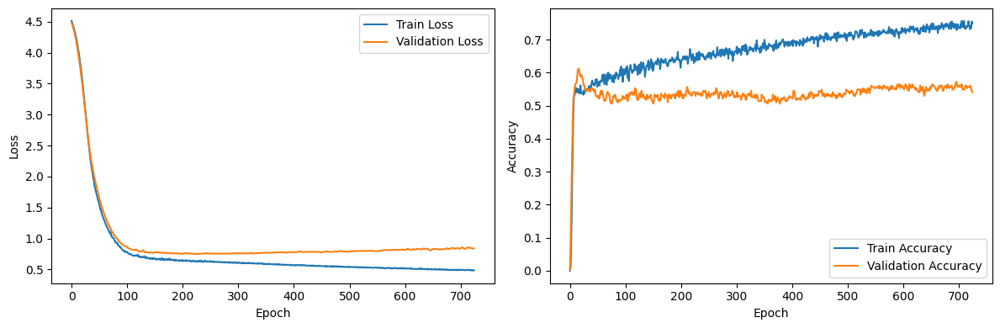


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1019, Val Loss: 4.0858, Train Acc: 0.5535, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.3448, Val Loss: 3.3402, Train Acc: 0.5744, Val Acc: 0.5297
Epoch: 030, Train Loss: 2.5399, Val Loss: 2.5575, Train Acc: 0.5699, Val Acc: 0.5212
Epoch: 040, Train Loss: 1.9719, Val Loss: 1.9398, Train Acc: 0.5690, Val Acc: 0.5466
Epoch: 050, Train Loss: 1.6153, Val Loss: 1.5995, Train Acc: 0.5744, Val Acc: 0.5593
Epoch: 060, Train Loss: 1.3466, Val Loss: 1.3517, Train Acc: 0.5690, Val Acc: 0.5169
Epoch: 070, Train Loss: 1.1240, Val Loss: 1.1423, Train Acc: 0.5844, Val Acc: 0.5254
Epoch: 080, Train Loss: 0.9603, Val Loss: 0.9785, Train Acc: 0.5690, Val Acc: 0.5466
Epoch: 090, Train Loss: 0.8356, Val Loss: 0.8722, Train Acc: 0.5717, Val Acc: 0.5678
Epoch: 100, Train Loss: 0.7709, Val Loss: 0.8124, Train Acc: 0.5898, Val Acc: 0.4958
Epoch: 110, Train Loss: 0.7356, Val Loss: 0.7770, Tr

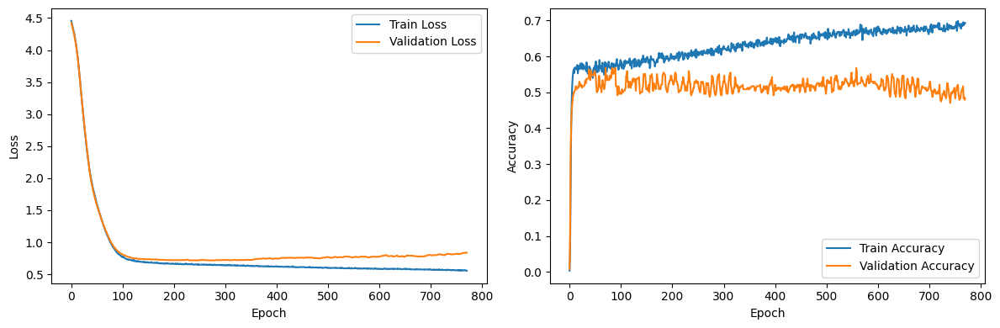


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1542, Val Loss: 4.1094, Train Acc: 0.4813, Val Acc: 0.4862
Epoch: 020, Train Loss: 3.3308, Val Loss: 3.2255, Train Acc: 0.5148, Val Acc: 0.5000
Epoch: 030, Train Loss: 2.4712, Val Loss: 2.3689, Train Acc: 0.5118, Val Acc: 0.5092
Epoch: 040, Train Loss: 1.9663, Val Loss: 1.8892, Train Acc: 0.5256, Val Acc: 0.5367
Epoch: 050, Train Loss: 1.6387, Val Loss: 1.5782, Train Acc: 0.5482, Val Acc: 0.5413
Epoch: 060, Train Loss: 1.3930, Val Loss: 1.3387, Train Acc: 0.5571, Val Acc: 0.5183
Epoch: 070, Train Loss: 1.1607, Val Loss: 1.1264, Train Acc: 0.5768, Val Acc: 0.5550
Epoch: 080, Train Loss: 0.9997, Val Loss: 0.9697, Train Acc: 0.5659, Val Acc: 0.5183
Epoch: 090, Train Loss: 0.8777, Val Loss: 0.8635, Train Acc: 0.5738, Val Acc: 0.5183
Epoch: 100, Train Loss: 0.8076, Val Loss: 0.7903, Train Acc: 0.5719, Val Acc: 0.5275
Epoch: 110, Train Loss: 0.7557, Val Loss: 0.7526, Tr

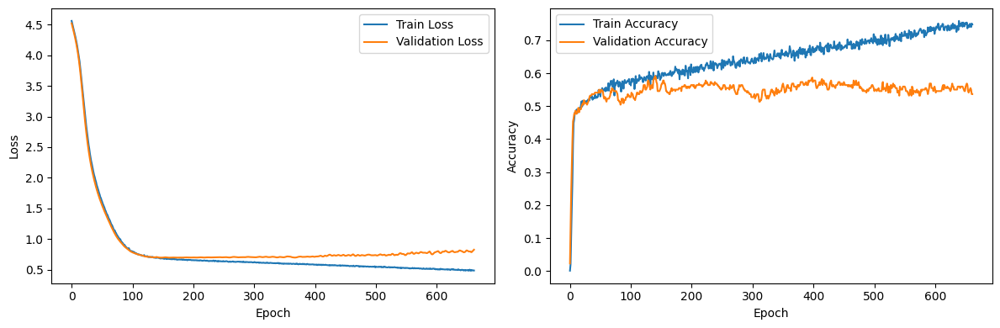


========== Run 20 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3384, Val Loss: 4.2678, Train Acc: 0.2627, Val Acc: 0.3421
Epoch: 020, Train Loss: 3.7288, Val Loss: 3.4905, Train Acc: 0.5085, Val Acc: 0.5075
Epoch: 030, Train Loss: 2.9140, Val Loss: 2.6578, Train Acc: 0.5512, Val Acc: 0.5226
Epoch: 040, Train Loss: 2.2591, Val Loss: 2.1076, Train Acc: 0.5729, Val Acc: 0.5113
Epoch: 050, Train Loss: 1.7460, Val Loss: 1.6231, Train Acc: 0.5737, Val Acc: 0.5263
Epoch: 060, Train Loss: 1.3840, Val Loss: 1.3044, Train Acc: 0.5512, Val Acc: 0.5376
Epoch: 070, Train Loss: 1.1054, Val Loss: 1.0971, Train Acc: 0.5689, Val Acc: 0.5338
Epoch: 080, Train Loss: 0.9312, Val Loss: 0.9519, Train Acc: 0.5657, Val Acc: 0.5150
Epoch: 090, Train Loss: 0.8250, Val Loss: 0.8572, Train Acc: 0.5979, Val Acc: 0.5263
Epoch: 100, Train Loss: 0.7531, Val Loss: 0.8041, Train Acc: 0.5995, Val Acc: 0.5188
Epoch: 110, Train Los

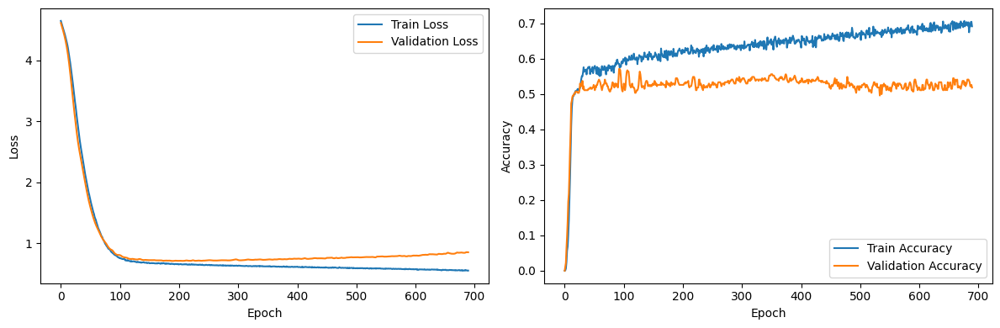


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1490, Val Loss: 4.0966, Train Acc: 0.4765, Val Acc: 0.5059
Epoch: 020, Train Loss: 3.3898, Val Loss: 3.3715, Train Acc: 0.5537, Val Acc: 0.5255
Epoch: 030, Train Loss: 2.4715, Val Loss: 2.5515, Train Acc: 0.5612, Val Acc: 0.5137
Epoch: 040, Train Loss: 1.9013, Val Loss: 2.0309, Train Acc: 0.5520, Val Acc: 0.5255
Epoch: 050, Train Loss: 1.5392, Val Loss: 1.6596, Train Acc: 0.5721, Val Acc: 0.5569
Epoch: 060, Train Loss: 1.2857, Val Loss: 1.3926, Train Acc: 0.5772, Val Acc: 0.5020
Epoch: 070, Train Loss: 1.0932, Val Loss: 1.1937, Train Acc: 0.5839, Val Acc: 0.5059
Epoch: 080, Train Loss: 0.9568, Val Loss: 1.0337, Train Acc: 0.6032, Val Acc: 0.5255
Epoch: 090, Train Loss: 0.8447, Val Loss: 0.9114, Train Acc: 0.6049, Val Acc: 0.5137
Epoch: 100, Train Loss: 0.7742, Val Loss: 0.8515, Train Acc: 0.5780, Val Acc: 0.5255
Epoch: 110, Train Loss: 0.7262, Val Loss: 0.8027, Tr

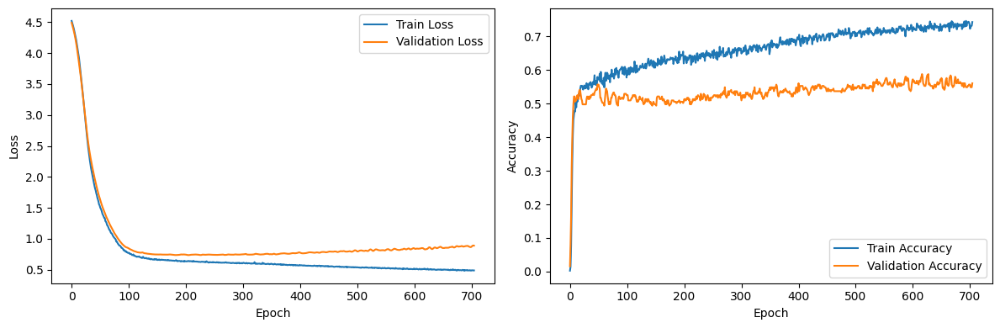


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3337, Val Loss: 4.3205, Train Acc: 0.3739, Val Acc: 0.4153
Epoch: 020, Train Loss: 3.8127, Val Loss: 3.8127, Train Acc: 0.5481, Val Acc: 0.4322
Epoch: 030, Train Loss: 2.9285, Val Loss: 2.9588, Train Acc: 0.5472, Val Acc: 0.4576
Epoch: 040, Train Loss: 2.2728, Val Loss: 2.3261, Train Acc: 0.5399, Val Acc: 0.4746
Epoch: 050, Train Loss: 1.7741, Val Loss: 1.7767, Train Acc: 0.5263, Val Acc: 0.4576
Epoch: 060, Train Loss: 1.4019, Val Loss: 1.4060, Train Acc: 0.5517, Val Acc: 0.4915
Epoch: 070, Train Loss: 1.1468, Val Loss: 1.1593, Train Acc: 0.5472, Val Acc: 0.4873
Epoch: 080, Train Loss: 0.9682, Val Loss: 0.9903, Train Acc: 0.5753, Val Acc: 0.5297
Epoch: 090, Train Loss: 0.8520, Val Loss: 0.8833, Train Acc: 0.5635, Val Acc: 0.5212
Epoch: 100, Train Loss: 0.7868, Val Loss: 0.8189, Train Acc: 0.5835, Val Acc: 0.5297
Epoch: 110, Train Loss: 0.7457, Val Loss: 0.7886, Tr

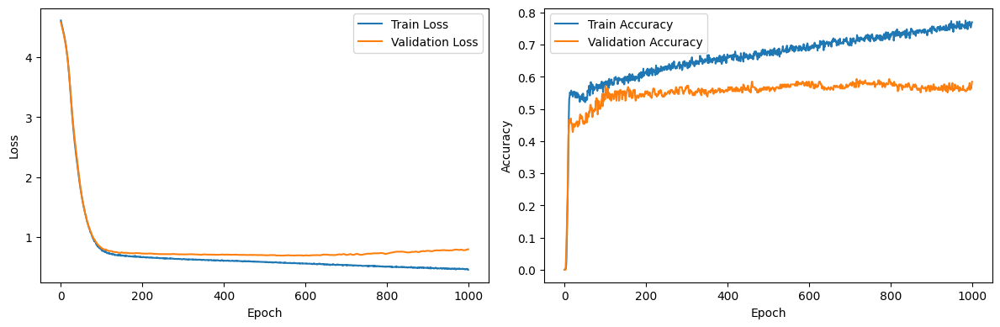


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3517, Val Loss: 4.3236, Train Acc: 0.3120, Val Acc: 0.3899
Epoch: 020, Train Loss: 3.8098, Val Loss: 3.7449, Train Acc: 0.5561, Val Acc: 0.5872
Epoch: 030, Train Loss: 2.9014, Val Loss: 2.7933, Train Acc: 0.5591, Val Acc: 0.5826
Epoch: 040, Train Loss: 2.1769, Val Loss: 2.0735, Train Acc: 0.5738, Val Acc: 0.6376
Epoch: 050, Train Loss: 1.7582, Val Loss: 1.6474, Train Acc: 0.5787, Val Acc: 0.6193
Epoch: 060, Train Loss: 1.4697, Val Loss: 1.3867, Train Acc: 0.5738, Val Acc: 0.5963
Epoch: 070, Train Loss: 1.2556, Val Loss: 1.1765, Train Acc: 0.5846, Val Acc: 0.5826
Epoch: 080, Train Loss: 1.0701, Val Loss: 1.0036, Train Acc: 0.5778, Val Acc: 0.6147
Epoch: 090, Train Loss: 0.9384, Val Loss: 0.8757, Train Acc: 0.5827, Val Acc: 0.6147
Epoch: 100, Train Loss: 0.8273, Val Loss: 0.7974, Train Acc: 0.5827, Val Acc: 0.5780
Epoch: 110, Train Loss: 0.7663, Val Loss: 0.7511, Tr

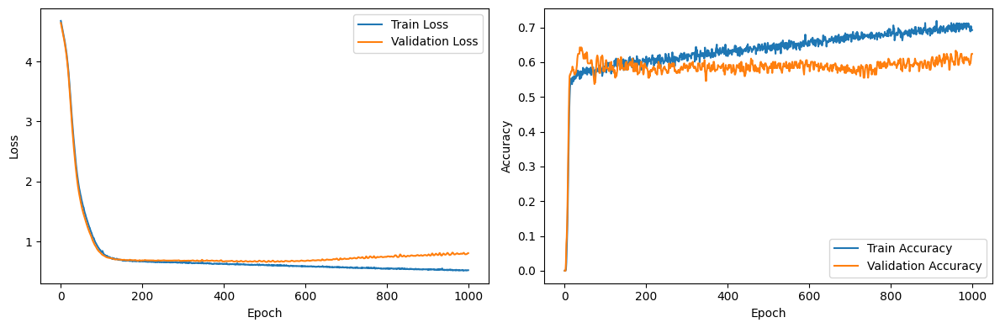


========== Run 21 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2934, Val Loss: 4.2553, Train Acc: 0.5270, Val Acc: 0.5489
Epoch: 020, Train Loss: 3.9074, Val Loss: 3.8227, Train Acc: 0.5713, Val Acc: 0.5414
Epoch: 030, Train Loss: 3.1969, Val Loss: 2.9910, Train Acc: 0.5778, Val Acc: 0.5338
Epoch: 040, Train Loss: 2.3471, Val Loss: 2.1284, Train Acc: 0.5624, Val Acc: 0.5301
Epoch: 050, Train Loss: 1.7401, Val Loss: 1.6209, Train Acc: 0.5633, Val Acc: 0.5188
Epoch: 060, Train Loss: 1.3589, Val Loss: 1.2981, Train Acc: 0.5689, Val Acc: 0.5226
Epoch: 070, Train Loss: 1.0888, Val Loss: 1.0720, Train Acc: 0.5778, Val Acc: 0.5376
Epoch: 080, Train Loss: 0.9297, Val Loss: 0.9407, Train Acc: 0.5786, Val Acc: 0.5639
Epoch: 090, Train Loss: 0.8293, Val Loss: 0.8655, Train Acc: 0.5907, Val Acc: 0.5226
Epoch: 100, Train Loss: 0.7662, Val Loss: 0.8061, Train Acc: 0.5858, Val Acc: 0.5489
Epoch: 110, Train Los

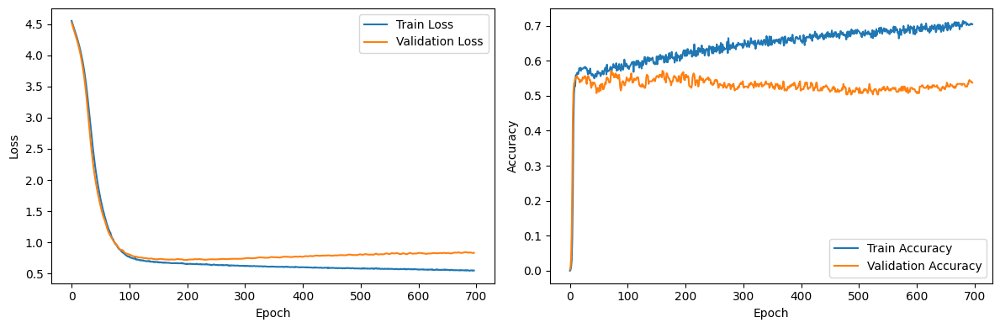


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3172, Val Loss: 4.2854, Train Acc: 0.4262, Val Acc: 0.4431
Epoch: 020, Train Loss: 3.7358, Val Loss: 3.6695, Train Acc: 0.5755, Val Acc: 0.5216
Epoch: 030, Train Loss: 2.7666, Val Loss: 2.7813, Train Acc: 0.5596, Val Acc: 0.5176
Epoch: 040, Train Loss: 1.9986, Val Loss: 2.1344, Train Acc: 0.5570, Val Acc: 0.5255
Epoch: 050, Train Loss: 1.5851, Val Loss: 1.7272, Train Acc: 0.5914, Val Acc: 0.5216
Epoch: 060, Train Loss: 1.3305, Val Loss: 1.4431, Train Acc: 0.5755, Val Acc: 0.5020
Epoch: 070, Train Loss: 1.1236, Val Loss: 1.2271, Train Acc: 0.5839, Val Acc: 0.5255
Epoch: 080, Train Loss: 0.9765, Val Loss: 1.0624, Train Acc: 0.5797, Val Acc: 0.5137
Epoch: 090, Train Loss: 0.8842, Val Loss: 0.9538, Train Acc: 0.5789, Val Acc: 0.5098
Epoch: 100, Train Loss: 0.7868, Val Loss: 0.8872, Train Acc: 0.6015, Val Acc: 0.5020
Epoch: 110, Train Loss: 0.7681, Val Loss: 0.8270, Tr

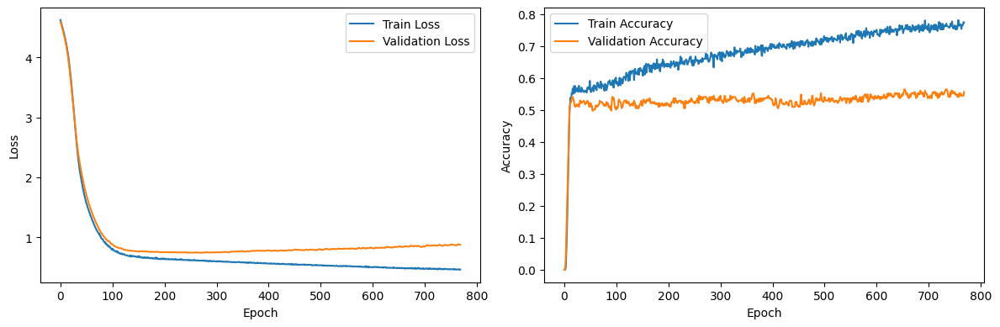


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2176, Val Loss: 4.2099, Train Acc: 0.5000, Val Acc: 0.4958
Epoch: 020, Train Loss: 3.5691, Val Loss: 3.5788, Train Acc: 0.5191, Val Acc: 0.4958
Epoch: 030, Train Loss: 2.6592, Val Loss: 2.7208, Train Acc: 0.5163, Val Acc: 0.4915
Epoch: 040, Train Loss: 2.0353, Val Loss: 2.0690, Train Acc: 0.5127, Val Acc: 0.4915
Epoch: 050, Train Loss: 1.6487, Val Loss: 1.6479, Train Acc: 0.5363, Val Acc: 0.4831
Epoch: 060, Train Loss: 1.3614, Val Loss: 1.3656, Train Acc: 0.5354, Val Acc: 0.5339
Epoch: 070, Train Loss: 1.1432, Val Loss: 1.1551, Train Acc: 0.5644, Val Acc: 0.5339
Epoch: 080, Train Loss: 0.9770, Val Loss: 1.0030, Train Acc: 0.5563, Val Acc: 0.5297
Epoch: 090, Train Loss: 0.8533, Val Loss: 0.8917, Train Acc: 0.5826, Val Acc: 0.5212
Epoch: 100, Train Loss: 0.7781, Val Loss: 0.8238, Train Acc: 0.5735, Val Acc: 0.5339
Epoch: 110, Train Loss: 0.7421, Val Loss: 0.7866, Tr

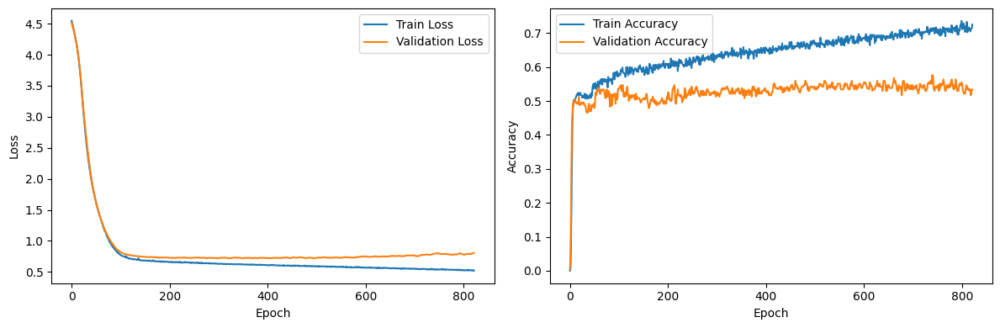


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2985, Val Loss: 4.2662, Train Acc: 0.4449, Val Acc: 0.5092
Epoch: 020, Train Loss: 3.5706, Val Loss: 3.4977, Train Acc: 0.5226, Val Acc: 0.5229
Epoch: 030, Train Loss: 2.7022, Val Loss: 2.6435, Train Acc: 0.5453, Val Acc: 0.4862
Epoch: 040, Train Loss: 2.1039, Val Loss: 2.0705, Train Acc: 0.5285, Val Acc: 0.4908
Epoch: 050, Train Loss: 1.7521, Val Loss: 1.6944, Train Acc: 0.5630, Val Acc: 0.5413
Epoch: 060, Train Loss: 1.4795, Val Loss: 1.4069, Train Acc: 0.5876, Val Acc: 0.5642
Epoch: 070, Train Loss: 1.2505, Val Loss: 1.1829, Train Acc: 0.5787, Val Acc: 0.5688
Epoch: 080, Train Loss: 1.0598, Val Loss: 1.0084, Train Acc: 0.5896, Val Acc: 0.5826
Epoch: 090, Train Loss: 0.9304, Val Loss: 0.8814, Train Acc: 0.5837, Val Acc: 0.5734
Epoch: 100, Train Loss: 0.8343, Val Loss: 0.8232, Train Acc: 0.5797, Val Acc: 0.5642
Epoch: 110, Train Loss: 0.7731, Val Loss: 0.7528, Tr

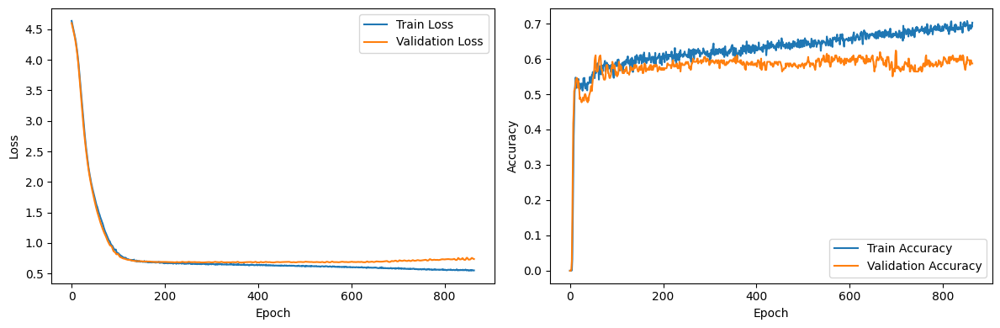


========== Run 22 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3267, Val Loss: 4.2818, Train Acc: 0.2055, Val Acc: 0.2932
Epoch: 020, Train Loss: 3.8224, Val Loss: 3.6739, Train Acc: 0.5624, Val Acc: 0.5338
Epoch: 030, Train Loss: 2.9873, Val Loss: 2.7458, Train Acc: 0.5608, Val Acc: 0.5150
Epoch: 040, Train Loss: 2.2810, Val Loss: 2.0766, Train Acc: 0.5737, Val Acc: 0.5301
Epoch: 050, Train Loss: 1.7807, Val Loss: 1.6200, Train Acc: 0.5689, Val Acc: 0.5564
Epoch: 060, Train Loss: 1.4055, Val Loss: 1.3268, Train Acc: 0.5721, Val Acc: 0.5489
Epoch: 070, Train Loss: 1.1514, Val Loss: 1.1191, Train Acc: 0.5915, Val Acc: 0.5526
Epoch: 080, Train Loss: 0.9619, Val Loss: 0.9749, Train Acc: 0.5713, Val Acc: 0.5226
Epoch: 090, Train Loss: 0.8507, Val Loss: 0.8591, Train Acc: 0.5697, Val Acc: 0.5602
Epoch: 100, Train Loss: 0.7895, Val Loss: 0.8057, Train Acc: 0.5657, Val Acc: 0.5451
Epoch: 110, Train Los

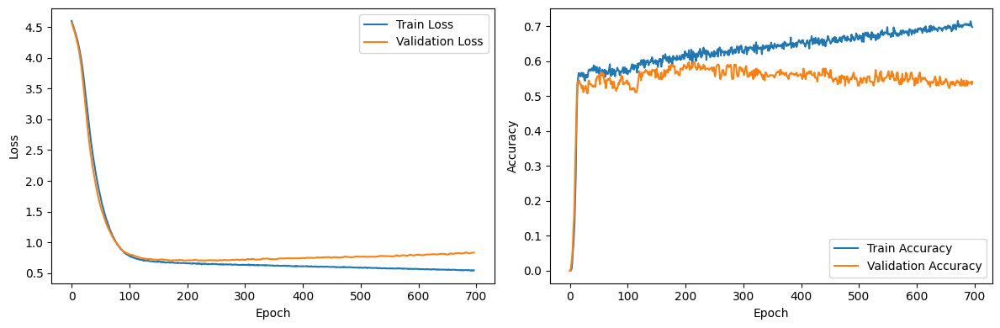


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2291, Val Loss: 4.1899, Train Acc: 0.5076, Val Acc: 0.4902
Epoch: 020, Train Loss: 3.5850, Val Loss: 3.5471, Train Acc: 0.5310, Val Acc: 0.5137
Epoch: 030, Train Loss: 2.5969, Val Loss: 2.6808, Train Acc: 0.5461, Val Acc: 0.5098
Epoch: 040, Train Loss: 1.9922, Val Loss: 2.1111, Train Acc: 0.5386, Val Acc: 0.4745
Epoch: 050, Train Loss: 1.6033, Val Loss: 1.7250, Train Acc: 0.5638, Val Acc: 0.4824
Epoch: 060, Train Loss: 1.3337, Val Loss: 1.4318, Train Acc: 0.5604, Val Acc: 0.4980
Epoch: 070, Train Loss: 1.1320, Val Loss: 1.2065, Train Acc: 0.5554, Val Acc: 0.4784
Epoch: 080, Train Loss: 0.9642, Val Loss: 1.0451, Train Acc: 0.5747, Val Acc: 0.4980
Epoch: 090, Train Loss: 0.8540, Val Loss: 0.9322, Train Acc: 0.5839, Val Acc: 0.4824
Epoch: 100, Train Loss: 0.7878, Val Loss: 0.8590, Train Acc: 0.5805, Val Acc: 0.4784
Epoch: 110, Train Loss: 0.7355, Val Loss: 0.8189, Tr

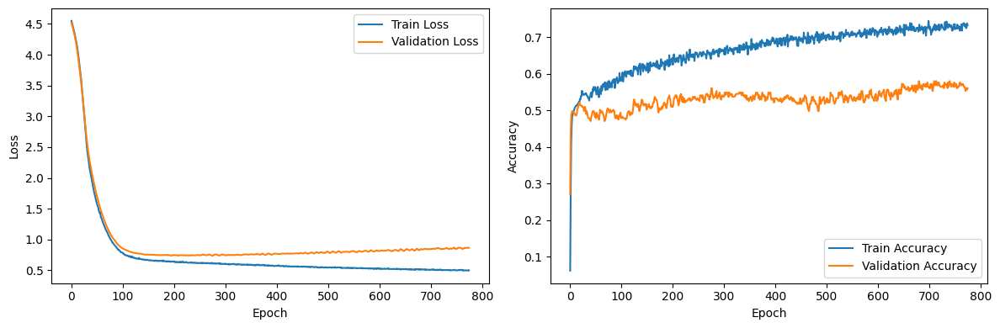


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3542, Val Loss: 4.3411, Train Acc: 0.4791, Val Acc: 0.4492
Epoch: 020, Train Loss: 3.8695, Val Loss: 3.8607, Train Acc: 0.5544, Val Acc: 0.4746
Epoch: 030, Train Loss: 2.9847, Val Loss: 2.9818, Train Acc: 0.5508, Val Acc: 0.4492
Epoch: 040, Train Loss: 2.2693, Val Loss: 2.2860, Train Acc: 0.5399, Val Acc: 0.4661
Epoch: 050, Train Loss: 1.8331, Val Loss: 1.8470, Train Acc: 0.5590, Val Acc: 0.4364
Epoch: 060, Train Loss: 1.5420, Val Loss: 1.5382, Train Acc: 0.5835, Val Acc: 0.5042
Epoch: 070, Train Loss: 1.2697, Val Loss: 1.2928, Train Acc: 0.5517, Val Acc: 0.5297
Epoch: 080, Train Loss: 1.0654, Val Loss: 1.1030, Train Acc: 0.5808, Val Acc: 0.5254
Epoch: 090, Train Loss: 0.9178, Val Loss: 0.9613, Train Acc: 0.5735, Val Acc: 0.5212
Epoch: 100, Train Loss: 0.8180, Val Loss: 0.8734, Train Acc: 0.5789, Val Acc: 0.5297
Epoch: 110, Train Loss: 0.7605, Val Loss: 0.8183, Tr

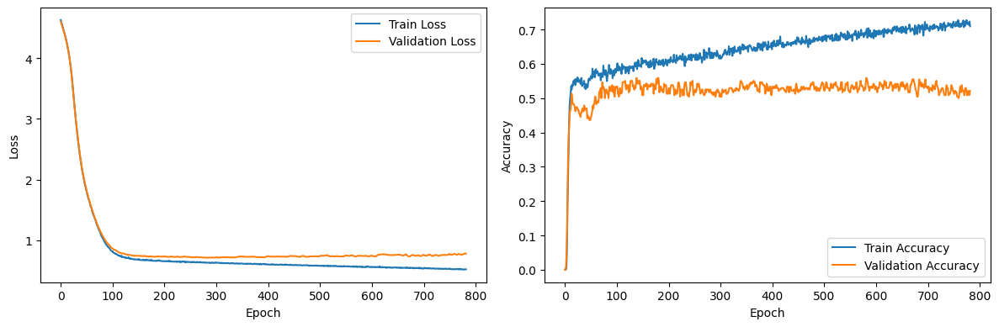


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2875, Val Loss: 4.2696, Train Acc: 0.4961, Val Acc: 0.4954
Epoch: 020, Train Loss: 3.7091, Val Loss: 3.6669, Train Acc: 0.5197, Val Acc: 0.5138
Epoch: 030, Train Loss: 3.0029, Val Loss: 2.9368, Train Acc: 0.5187, Val Acc: 0.5183
Epoch: 040, Train Loss: 2.3380, Val Loss: 2.3110, Train Acc: 0.5344, Val Acc: 0.5000
Epoch: 050, Train Loss: 1.7927, Val Loss: 1.7585, Train Acc: 0.5256, Val Acc: 0.5275
Epoch: 060, Train Loss: 1.4485, Val Loss: 1.3927, Train Acc: 0.5541, Val Acc: 0.5550
Epoch: 070, Train Loss: 1.2188, Val Loss: 1.1461, Train Acc: 0.5433, Val Acc: 0.5872
Epoch: 080, Train Loss: 1.0397, Val Loss: 0.9884, Train Acc: 0.5738, Val Acc: 0.5734
Epoch: 090, Train Loss: 0.9293, Val Loss: 0.8762, Train Acc: 0.5571, Val Acc: 0.5872
Epoch: 100, Train Loss: 0.8438, Val Loss: 0.7976, Train Acc: 0.5787, Val Acc: 0.6055
Epoch: 110, Train Loss: 0.7755, Val Loss: 0.7608, Tr

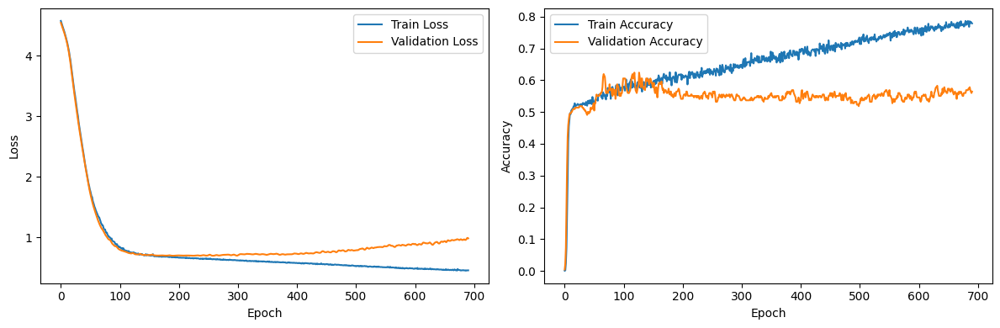


========== Run 23 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3002, Val Loss: 4.2419, Train Acc: 0.4996, Val Acc: 0.4812
Epoch: 020, Train Loss: 3.6945, Val Loss: 3.4994, Train Acc: 0.5367, Val Acc: 0.5150
Epoch: 030, Train Loss: 2.8139, Val Loss: 2.5618, Train Acc: 0.5415, Val Acc: 0.5376
Epoch: 040, Train Loss: 2.1705, Val Loss: 2.0098, Train Acc: 0.5649, Val Acc: 0.5263
Epoch: 050, Train Loss: 1.7116, Val Loss: 1.5968, Train Acc: 0.5689, Val Acc: 0.5376
Epoch: 060, Train Loss: 1.3682, Val Loss: 1.2995, Train Acc: 0.5810, Val Acc: 0.5376
Epoch: 070, Train Loss: 1.1242, Val Loss: 1.0883, Train Acc: 0.5713, Val Acc: 0.5639
Epoch: 080, Train Loss: 0.9440, Val Loss: 0.9387, Train Acc: 0.5729, Val Acc: 0.5451
Epoch: 090, Train Loss: 0.8246, Val Loss: 0.8451, Train Acc: 0.5882, Val Acc: 0.5526
Epoch: 100, Train Loss: 0.7600, Val Loss: 0.7880, Train Acc: 0.5858, Val Acc: 0.5526
Epoch: 110, Train Los

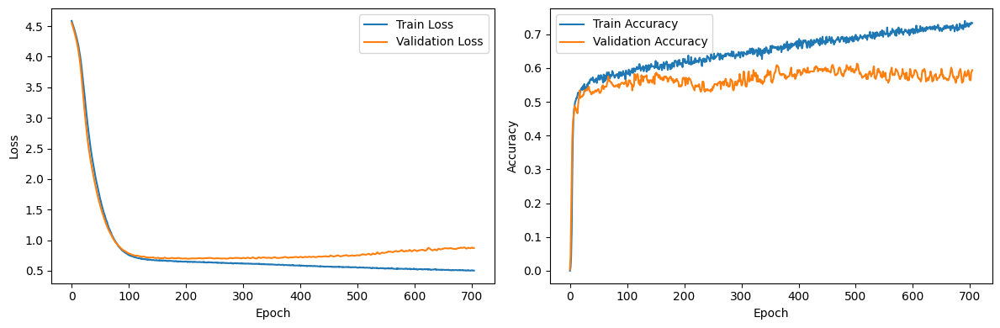


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2381, Val Loss: 4.1850, Train Acc: 0.3951, Val Acc: 0.4431
Epoch: 020, Train Loss: 3.5060, Val Loss: 3.4872, Train Acc: 0.5168, Val Acc: 0.5294
Epoch: 030, Train Loss: 2.5778, Val Loss: 2.6710, Train Acc: 0.5361, Val Acc: 0.5333
Epoch: 040, Train Loss: 1.9864, Val Loss: 2.1441, Train Acc: 0.5512, Val Acc: 0.4824
Epoch: 050, Train Loss: 1.6172, Val Loss: 1.7595, Train Acc: 0.5520, Val Acc: 0.5176
Epoch: 060, Train Loss: 1.3432, Val Loss: 1.4613, Train Acc: 0.5680, Val Acc: 0.5176
Epoch: 070, Train Loss: 1.1455, Val Loss: 1.2370, Train Acc: 0.5680, Val Acc: 0.5098
Epoch: 080, Train Loss: 0.9950, Val Loss: 1.0684, Train Acc: 0.5705, Val Acc: 0.5020
Epoch: 090, Train Loss: 0.8788, Val Loss: 0.9519, Train Acc: 0.5797, Val Acc: 0.4863
Epoch: 100, Train Loss: 0.7969, Val Loss: 0.8713, Train Acc: 0.5898, Val Acc: 0.5098
Epoch: 110, Train Loss: 0.7530, Val Loss: 0.8274, Tr

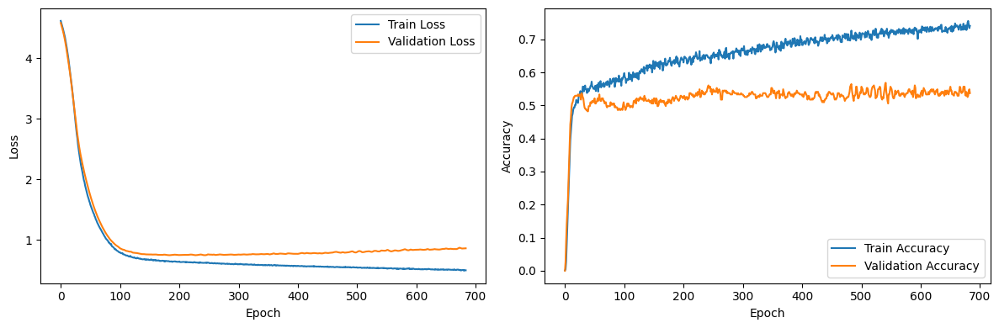


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2723, Val Loss: 4.2552, Train Acc: 0.4927, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.7254, Val Loss: 3.7285, Train Acc: 0.5082, Val Acc: 0.4958
Epoch: 030, Train Loss: 2.8503, Val Loss: 2.8753, Train Acc: 0.5454, Val Acc: 0.4619
Epoch: 040, Train Loss: 2.1611, Val Loss: 2.2095, Train Acc: 0.5336, Val Acc: 0.4788
Epoch: 050, Train Loss: 1.7038, Val Loss: 1.7214, Train Acc: 0.5426, Val Acc: 0.4746
Epoch: 060, Train Loss: 1.4166, Val Loss: 1.4096, Train Acc: 0.5708, Val Acc: 0.4831
Epoch: 070, Train Loss: 1.1564, Val Loss: 1.1837, Train Acc: 0.5526, Val Acc: 0.5381
Epoch: 080, Train Loss: 0.9826, Val Loss: 1.0218, Train Acc: 0.5644, Val Acc: 0.5127
Epoch: 090, Train Loss: 0.8621, Val Loss: 0.9075, Train Acc: 0.5672, Val Acc: 0.5085
Epoch: 100, Train Loss: 0.7902, Val Loss: 0.8378, Train Acc: 0.5744, Val Acc: 0.5381
Epoch: 110, Train Loss: 0.7451, Val Loss: 0.7941, Tr

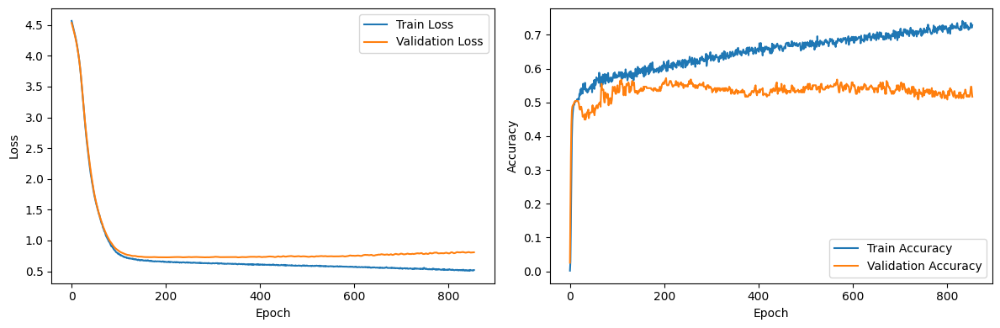


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2178, Val Loss: 4.1932, Train Acc: 0.4970, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.5044, Val Loss: 3.4578, Train Acc: 0.5217, Val Acc: 0.4817
Epoch: 030, Train Loss: 2.6330, Val Loss: 2.5413, Train Acc: 0.5266, Val Acc: 0.5046
Epoch: 040, Train Loss: 1.9954, Val Loss: 1.9264, Train Acc: 0.5463, Val Acc: 0.5459
Epoch: 050, Train Loss: 1.6204, Val Loss: 1.5503, Train Acc: 0.5620, Val Acc: 0.5688
Epoch: 060, Train Loss: 1.3552, Val Loss: 1.2901, Train Acc: 0.5630, Val Acc: 0.6009
Epoch: 070, Train Loss: 1.1416, Val Loss: 1.0821, Train Acc: 0.5797, Val Acc: 0.6330
Epoch: 080, Train Loss: 0.9721, Val Loss: 0.9331, Train Acc: 0.5886, Val Acc: 0.6147
Epoch: 090, Train Loss: 0.8810, Val Loss: 0.8299, Train Acc: 0.5768, Val Acc: 0.6284
Epoch: 100, Train Loss: 0.7918, Val Loss: 0.7740, Train Acc: 0.5689, Val Acc: 0.5826
Epoch: 110, Train Loss: 0.7490, Val Loss: 0.7394, Tr

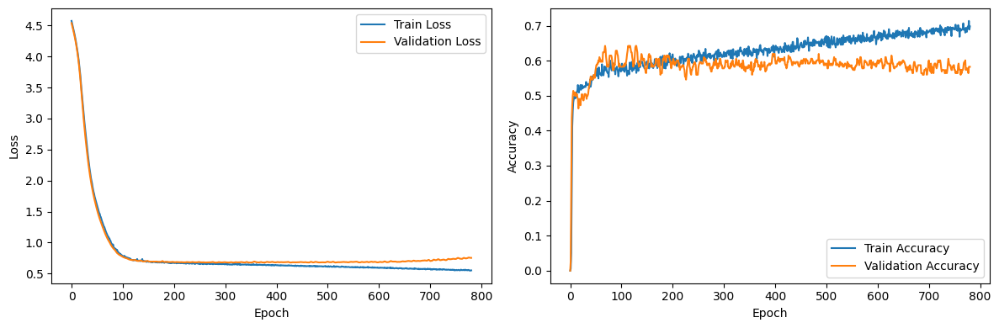


========== Run 24 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3219, Val Loss: 4.2705, Train Acc: 0.4569, Val Acc: 0.4323
Epoch: 020, Train Loss: 3.7574, Val Loss: 3.6527, Train Acc: 0.5214, Val Acc: 0.4962
Epoch: 030, Train Loss: 3.0565, Val Loss: 2.9253, Train Acc: 0.5318, Val Acc: 0.4925
Epoch: 040, Train Loss: 2.3364, Val Loss: 2.1421, Train Acc: 0.5375, Val Acc: 0.5226
Epoch: 050, Train Loss: 1.8164, Val Loss: 1.6827, Train Acc: 0.5407, Val Acc: 0.4549
Epoch: 060, Train Loss: 1.4440, Val Loss: 1.3564, Train Acc: 0.5431, Val Acc: 0.5150
Epoch: 070, Train Loss: 1.1727, Val Loss: 1.1263, Train Acc: 0.5592, Val Acc: 0.5000
Epoch: 080, Train Loss: 0.9891, Val Loss: 0.9786, Train Acc: 0.5608, Val Acc: 0.4925
Epoch: 090, Train Loss: 0.8709, Val Loss: 0.8780, Train Acc: 0.5544, Val Acc: 0.5038
Epoch: 100, Train Loss: 0.7964, Val Loss: 0.8119, Train Acc: 0.5753, Val Acc: 0.4887
Epoch: 110, Train Los

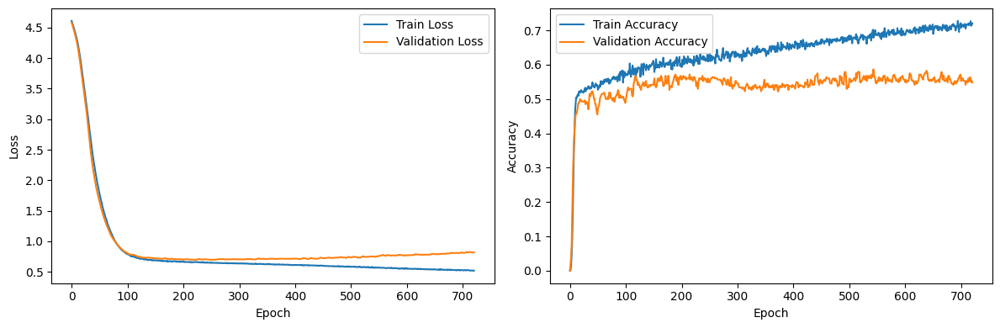


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2144, Val Loss: 4.1762, Train Acc: 0.4941, Val Acc: 0.5098
Epoch: 020, Train Loss: 3.5256, Val Loss: 3.4828, Train Acc: 0.5143, Val Acc: 0.5216
Epoch: 030, Train Loss: 2.5534, Val Loss: 2.6114, Train Acc: 0.5336, Val Acc: 0.5451
Epoch: 040, Train Loss: 1.9161, Val Loss: 2.0411, Train Acc: 0.5579, Val Acc: 0.5333
Epoch: 050, Train Loss: 1.5505, Val Loss: 1.6749, Train Acc: 0.5378, Val Acc: 0.5137
Epoch: 060, Train Loss: 1.2918, Val Loss: 1.3903, Train Acc: 0.5713, Val Acc: 0.5255
Epoch: 070, Train Loss: 1.1094, Val Loss: 1.1827, Train Acc: 0.5772, Val Acc: 0.5176
Epoch: 080, Train Loss: 0.9626, Val Loss: 1.0363, Train Acc: 0.5805, Val Acc: 0.5098
Epoch: 090, Train Loss: 0.8614, Val Loss: 0.9301, Train Acc: 0.5822, Val Acc: 0.5333
Epoch: 100, Train Loss: 0.7901, Val Loss: 0.8557, Train Acc: 0.5881, Val Acc: 0.5373
Epoch: 110, Train Loss: 0.7399, Val Loss: 0.8127, Tr

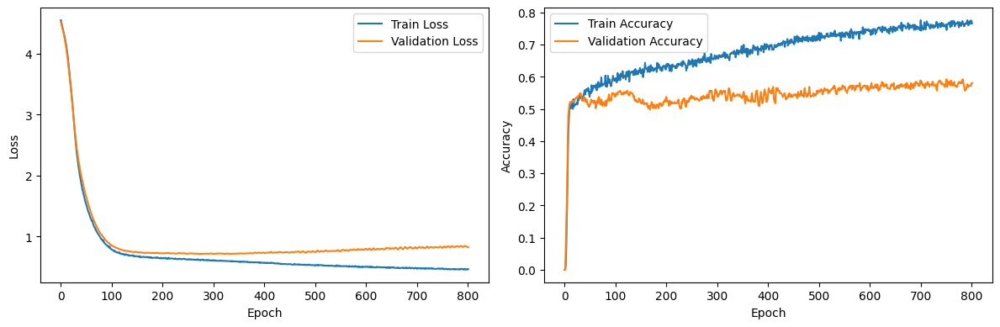


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1628, Val Loss: 4.1451, Train Acc: 0.5354, Val Acc: 0.5085
Epoch: 020, Train Loss: 3.4963, Val Loss: 3.4835, Train Acc: 0.5472, Val Acc: 0.4958
Epoch: 030, Train Loss: 2.5913, Val Loss: 2.5818, Train Acc: 0.5517, Val Acc: 0.4788
Epoch: 040, Train Loss: 2.0340, Val Loss: 2.0030, Train Acc: 0.5599, Val Acc: 0.5042
Epoch: 050, Train Loss: 1.6752, Val Loss: 1.6782, Train Acc: 0.5662, Val Acc: 0.4958
Epoch: 060, Train Loss: 1.4009, Val Loss: 1.4100, Train Acc: 0.5572, Val Acc: 0.5085
Epoch: 070, Train Loss: 1.1604, Val Loss: 1.1792, Train Acc: 0.5635, Val Acc: 0.5466
Epoch: 080, Train Loss: 0.9814, Val Loss: 1.0115, Train Acc: 0.5653, Val Acc: 0.5042
Epoch: 090, Train Loss: 0.8481, Val Loss: 0.9010, Train Acc: 0.5771, Val Acc: 0.5254
Epoch: 100, Train Loss: 0.7923, Val Loss: 0.8275, Train Acc: 0.5717, Val Acc: 0.5000
Epoch: 110, Train Loss: 0.7428, Val Loss: 0.7897, Tr

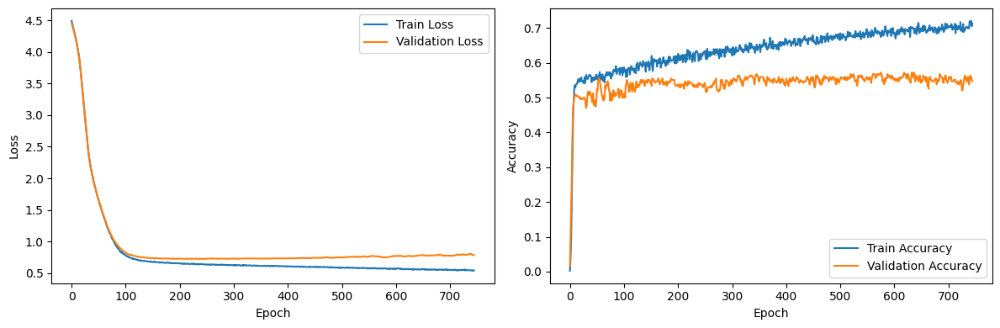


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1916, Val Loss: 4.1568, Train Acc: 0.5039, Val Acc: 0.5688
Epoch: 020, Train Loss: 3.6493, Val Loss: 3.5924, Train Acc: 0.5669, Val Acc: 0.5780
Epoch: 030, Train Loss: 2.7936, Val Loss: 2.6862, Train Acc: 0.5679, Val Acc: 0.5872
Epoch: 040, Train Loss: 2.0323, Val Loss: 1.9316, Train Acc: 0.5472, Val Acc: 0.6055
Epoch: 050, Train Loss: 1.5915, Val Loss: 1.4972, Train Acc: 0.5699, Val Acc: 0.6422
Epoch: 060, Train Loss: 1.3266, Val Loss: 1.2527, Train Acc: 0.5728, Val Acc: 0.6422
Epoch: 070, Train Loss: 1.1345, Val Loss: 1.0681, Train Acc: 0.5610, Val Acc: 0.6330
Epoch: 080, Train Loss: 0.9716, Val Loss: 0.9282, Train Acc: 0.5906, Val Acc: 0.6193
Epoch: 090, Train Loss: 0.8679, Val Loss: 0.8350, Train Acc: 0.5778, Val Acc: 0.6101
Epoch: 100, Train Loss: 0.7991, Val Loss: 0.7754, Train Acc: 0.5768, Val Acc: 0.6055
Epoch: 110, Train Loss: 0.7518, Val Loss: 0.7431, Tr

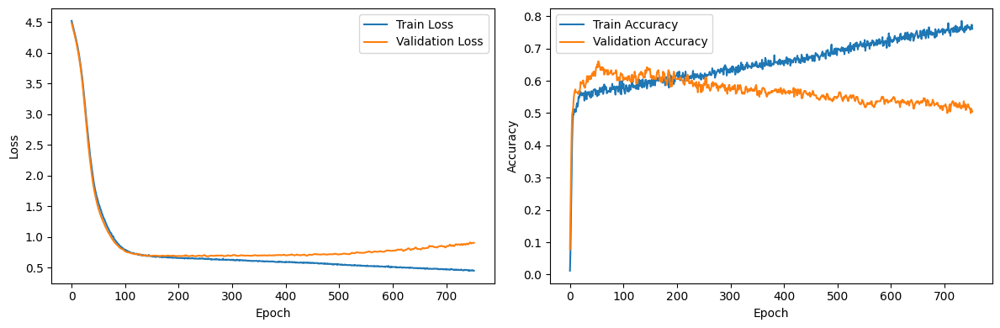


========== Run 25 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3395, Val Loss: 4.2976, Train Acc: 0.4698, Val Acc: 0.4850
Epoch: 020, Train Loss: 3.9200, Val Loss: 3.8185, Train Acc: 0.5479, Val Acc: 0.5226
Epoch: 030, Train Loss: 3.1298, Val Loss: 2.9007, Train Acc: 0.5407, Val Acc: 0.5150
Epoch: 040, Train Loss: 2.3198, Val Loss: 2.0975, Train Acc: 0.5286, Val Acc: 0.5564
Epoch: 050, Train Loss: 1.7655, Val Loss: 1.6259, Train Acc: 0.5455, Val Acc: 0.5150
Epoch: 060, Train Loss: 1.3810, Val Loss: 1.3115, Train Acc: 0.5810, Val Acc: 0.5526
Epoch: 070, Train Loss: 1.1301, Val Loss: 1.0995, Train Acc: 0.5689, Val Acc: 0.5451
Epoch: 080, Train Loss: 0.9532, Val Loss: 0.9567, Train Acc: 0.5681, Val Acc: 0.5226
Epoch: 090, Train Loss: 0.8484, Val Loss: 0.8626, Train Acc: 0.5761, Val Acc: 0.5263
Epoch: 100, Train Loss: 0.7767, Val Loss: 0.7934, Train Acc: 0.5786, Val Acc: 0.5338
Epoch: 110, Train Los

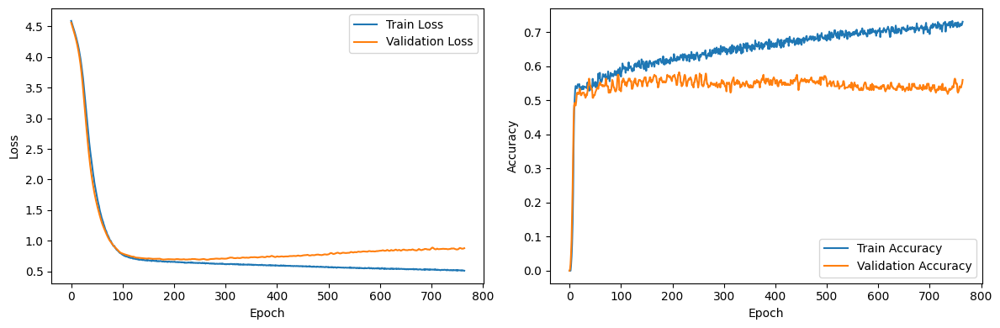


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2907, Val Loss: 4.2561, Train Acc: 0.4874, Val Acc: 0.5412
Epoch: 020, Train Loss: 3.7494, Val Loss: 3.6747, Train Acc: 0.5680, Val Acc: 0.5647
Epoch: 030, Train Loss: 2.9029, Val Loss: 2.8714, Train Acc: 0.5638, Val Acc: 0.5294
Epoch: 040, Train Loss: 2.0906, Val Loss: 2.1775, Train Acc: 0.5629, Val Acc: 0.5216
Epoch: 050, Train Loss: 1.6366, Val Loss: 1.7472, Train Acc: 0.5688, Val Acc: 0.5294
Epoch: 060, Train Loss: 1.3261, Val Loss: 1.4298, Train Acc: 0.5780, Val Acc: 0.5333
Epoch: 070, Train Loss: 1.1157, Val Loss: 1.1987, Train Acc: 0.5889, Val Acc: 0.5333
Epoch: 080, Train Loss: 0.9674, Val Loss: 1.0403, Train Acc: 0.5923, Val Acc: 0.5255
Epoch: 090, Train Loss: 0.8514, Val Loss: 0.9335, Train Acc: 0.6091, Val Acc: 0.5451
Epoch: 100, Train Loss: 0.7788, Val Loss: 0.8606, Train Acc: 0.6091, Val Acc: 0.5294
Epoch: 110, Train Loss: 0.7434, Val Loss: 0.8159, Tr

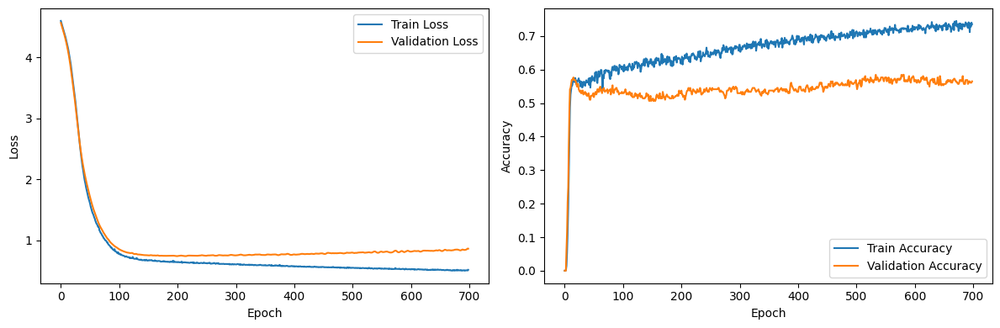


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2404, Val Loss: 4.2216, Train Acc: 0.5191, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.5048, Val Loss: 3.4831, Train Acc: 0.5535, Val Acc: 0.5593
Epoch: 030, Train Loss: 2.5923, Val Loss: 2.5996, Train Acc: 0.5599, Val Acc: 0.5593
Epoch: 040, Train Loss: 1.9650, Val Loss: 1.9421, Train Acc: 0.5572, Val Acc: 0.5424
Epoch: 050, Train Loss: 1.6080, Val Loss: 1.5787, Train Acc: 0.5535, Val Acc: 0.5297
Epoch: 060, Train Loss: 1.3182, Val Loss: 1.3248, Train Acc: 0.5717, Val Acc: 0.5169
Epoch: 070, Train Loss: 1.1010, Val Loss: 1.1208, Train Acc: 0.5789, Val Acc: 0.5085
Epoch: 080, Train Loss: 0.9333, Val Loss: 0.9659, Train Acc: 0.5662, Val Acc: 0.5085
Epoch: 090, Train Loss: 0.8433, Val Loss: 0.8724, Train Acc: 0.5690, Val Acc: 0.5085
Epoch: 100, Train Loss: 0.7711, Val Loss: 0.8149, Train Acc: 0.5826, Val Acc: 0.5127
Epoch: 110, Train Loss: 0.7440, Val Loss: 0.7942, Tr

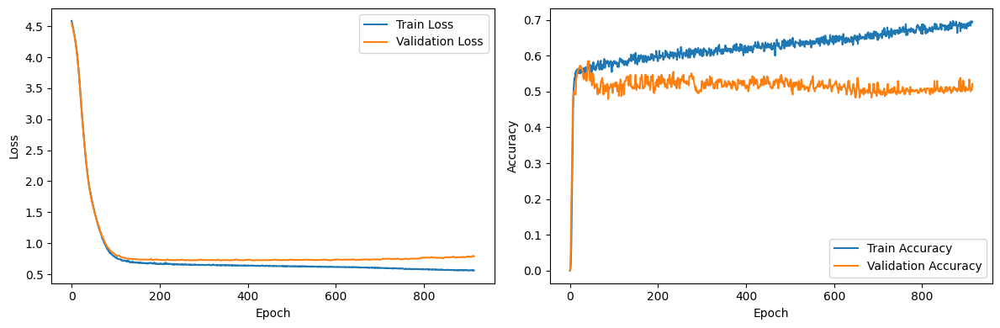


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2099, Val Loss: 4.1682, Train Acc: 0.4724, Val Acc: 0.4954
Epoch: 020, Train Loss: 3.4908, Val Loss: 3.4106, Train Acc: 0.5226, Val Acc: 0.5092
Epoch: 030, Train Loss: 2.6416, Val Loss: 2.5520, Train Acc: 0.5433, Val Acc: 0.4817
Epoch: 040, Train Loss: 2.0097, Val Loss: 1.9557, Train Acc: 0.5256, Val Acc: 0.4679
Epoch: 050, Train Loss: 1.6426, Val Loss: 1.5896, Train Acc: 0.5423, Val Acc: 0.4817
Epoch: 060, Train Loss: 1.3804, Val Loss: 1.3001, Train Acc: 0.5531, Val Acc: 0.5826
Epoch: 070, Train Loss: 1.1708, Val Loss: 1.0967, Train Acc: 0.5561, Val Acc: 0.5872
Epoch: 080, Train Loss: 1.0082, Val Loss: 0.9424, Train Acc: 0.5768, Val Acc: 0.5688
Epoch: 090, Train Loss: 0.8670, Val Loss: 0.8333, Train Acc: 0.5600, Val Acc: 0.5917
Epoch: 100, Train Loss: 0.7960, Val Loss: 0.7745, Train Acc: 0.5551, Val Acc: 0.5872
Epoch: 110, Train Loss: 0.7498, Val Loss: 0.7391, Tr

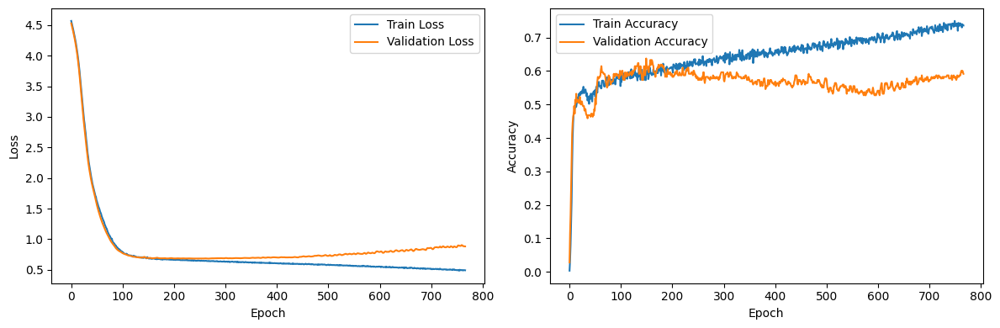


========== Run 26 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3389, Val Loss: 4.2877, Train Acc: 0.4827, Val Acc: 0.4925
Epoch: 020, Train Loss: 3.8484, Val Loss: 3.7259, Train Acc: 0.5342, Val Acc: 0.5414
Epoch: 030, Train Loss: 3.1194, Val Loss: 2.9178, Train Acc: 0.5447, Val Acc: 0.5301
Epoch: 040, Train Loss: 2.3269, Val Loss: 2.0950, Train Acc: 0.5488, Val Acc: 0.5451
Epoch: 050, Train Loss: 1.7701, Val Loss: 1.6340, Train Acc: 0.5471, Val Acc: 0.5038
Epoch: 060, Train Loss: 1.3963, Val Loss: 1.3190, Train Acc: 0.5592, Val Acc: 0.5414
Epoch: 070, Train Loss: 1.1431, Val Loss: 1.1066, Train Acc: 0.5633, Val Acc: 0.5564
Epoch: 080, Train Loss: 0.9699, Val Loss: 0.9661, Train Acc: 0.5761, Val Acc: 0.5677
Epoch: 090, Train Loss: 0.8598, Val Loss: 0.8687, Train Acc: 0.5689, Val Acc: 0.5338
Epoch: 100, Train Loss: 0.7846, Val Loss: 0.8025, Train Acc: 0.5898, Val Acc: 0.5564
Epoch: 110, Train Los

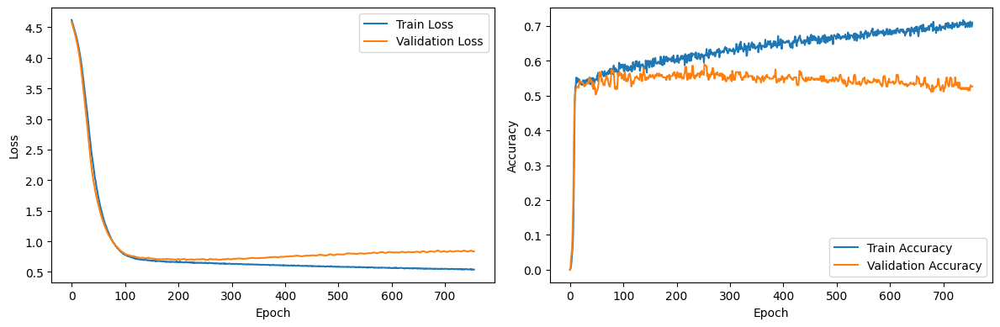


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3108, Val Loss: 4.2506, Train Acc: 0.2584, Val Acc: 0.2863
Epoch: 020, Train Loss: 3.6104, Val Loss: 3.5753, Train Acc: 0.4891, Val Acc: 0.5098
Epoch: 030, Train Loss: 2.7018, Val Loss: 2.7489, Train Acc: 0.5109, Val Acc: 0.5176
Epoch: 040, Train Loss: 2.0556, Val Loss: 2.1662, Train Acc: 0.5126, Val Acc: 0.4980
Epoch: 050, Train Loss: 1.6470, Val Loss: 1.7621, Train Acc: 0.5478, Val Acc: 0.4980
Epoch: 060, Train Loss: 1.3483, Val Loss: 1.4365, Train Acc: 0.5629, Val Acc: 0.5137
Epoch: 070, Train Loss: 1.1320, Val Loss: 1.2150, Train Acc: 0.5696, Val Acc: 0.5137
Epoch: 080, Train Loss: 0.9814, Val Loss: 1.0483, Train Acc: 0.5612, Val Acc: 0.4941
Epoch: 090, Train Loss: 0.8629, Val Loss: 0.9351, Train Acc: 0.5923, Val Acc: 0.4863
Epoch: 100, Train Loss: 0.7971, Val Loss: 0.8662, Train Acc: 0.5780, Val Acc: 0.4902
Epoch: 110, Train Loss: 0.7601, Val Loss: 0.8256, Tr

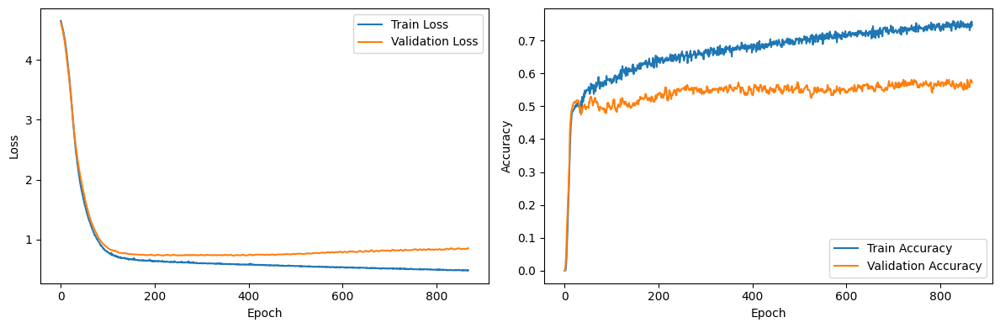


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2154, Val Loss: 4.1919, Train Acc: 0.5136, Val Acc: 0.4831
Epoch: 020, Train Loss: 3.5118, Val Loss: 3.4615, Train Acc: 0.5390, Val Acc: 0.5085
Epoch: 030, Train Loss: 2.5785, Val Loss: 2.5906, Train Acc: 0.5481, Val Acc: 0.5000
Epoch: 040, Train Loss: 2.0588, Val Loss: 2.0316, Train Acc: 0.5535, Val Acc: 0.5636
Epoch: 050, Train Loss: 1.7265, Val Loss: 1.7113, Train Acc: 0.5535, Val Acc: 0.5254
Epoch: 060, Train Loss: 1.4579, Val Loss: 1.4545, Train Acc: 0.5635, Val Acc: 0.5424
Epoch: 070, Train Loss: 1.2273, Val Loss: 1.2344, Train Acc: 0.5644, Val Acc: 0.5297
Epoch: 080, Train Loss: 1.0304, Val Loss: 1.0490, Train Acc: 0.5735, Val Acc: 0.5551
Epoch: 090, Train Loss: 0.8957, Val Loss: 0.9235, Train Acc: 0.5699, Val Acc: 0.5254
Epoch: 100, Train Loss: 0.8076, Val Loss: 0.8412, Train Acc: 0.5889, Val Acc: 0.5508
Epoch: 110, Train Loss: 0.7494, Val Loss: 0.7949, Tr

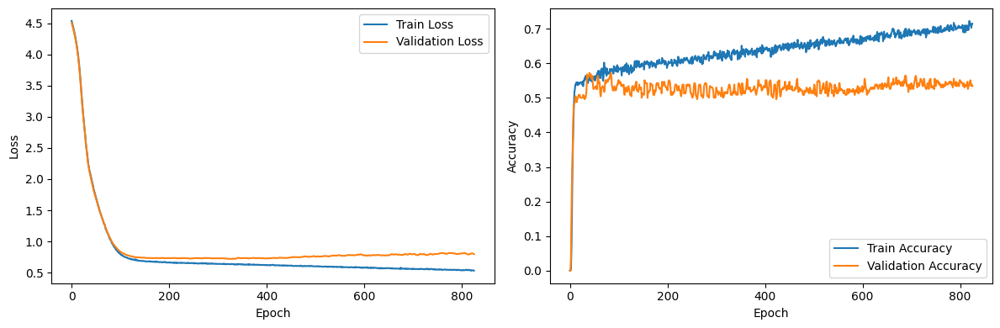


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1656, Val Loss: 4.1317, Train Acc: 0.5069, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.3957, Val Loss: 3.3289, Train Acc: 0.5207, Val Acc: 0.5275
Epoch: 030, Train Loss: 2.5890, Val Loss: 2.5439, Train Acc: 0.5246, Val Acc: 0.5229
Epoch: 040, Train Loss: 1.9896, Val Loss: 1.9385, Train Acc: 0.5157, Val Acc: 0.5138
Epoch: 050, Train Loss: 1.5937, Val Loss: 1.5182, Train Acc: 0.5049, Val Acc: 0.5596
Epoch: 060, Train Loss: 1.3188, Val Loss: 1.2424, Train Acc: 0.5295, Val Acc: 0.5596
Epoch: 070, Train Loss: 1.1317, Val Loss: 1.0391, Train Acc: 0.5246, Val Acc: 0.5734
Epoch: 080, Train Loss: 0.9546, Val Loss: 0.8976, Train Acc: 0.5482, Val Acc: 0.6055
Epoch: 090, Train Loss: 0.8459, Val Loss: 0.8155, Train Acc: 0.5846, Val Acc: 0.5505
Epoch: 100, Train Loss: 0.7755, Val Loss: 0.7607, Train Acc: 0.5906, Val Acc: 0.5642
Epoch: 110, Train Loss: 0.7505, Val Loss: 0.7232, Tr

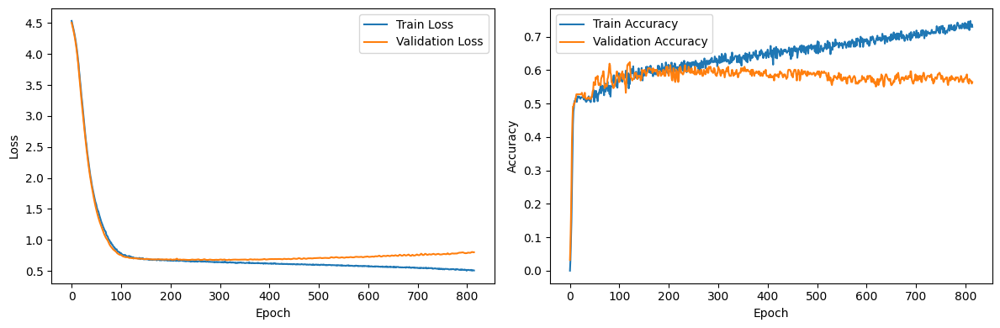


========== Run 27 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3928, Val Loss: 4.3449, Train Acc: 0.2788, Val Acc: 0.3609
Epoch: 020, Train Loss: 3.8736, Val Loss: 3.7297, Train Acc: 0.5713, Val Acc: 0.5226
Epoch: 030, Train Loss: 3.0376, Val Loss: 2.8343, Train Acc: 0.5649, Val Acc: 0.5150
Epoch: 040, Train Loss: 2.3328, Val Loss: 2.1635, Train Acc: 0.5842, Val Acc: 0.5000
Epoch: 050, Train Loss: 1.8224, Val Loss: 1.6898, Train Acc: 0.5850, Val Acc: 0.5301
Epoch: 060, Train Loss: 1.4363, Val Loss: 1.3569, Train Acc: 0.5939, Val Acc: 0.5526
Epoch: 070, Train Loss: 1.1577, Val Loss: 1.1357, Train Acc: 0.5882, Val Acc: 0.5526
Epoch: 080, Train Loss: 0.9653, Val Loss: 0.9716, Train Acc: 0.5826, Val Acc: 0.5489
Epoch: 090, Train Loss: 0.8368, Val Loss: 0.8701, Train Acc: 0.5939, Val Acc: 0.5376
Epoch: 100, Train Loss: 0.7693, Val Loss: 0.8103, Train Acc: 0.5850, Val Acc: 0.5451
Epoch: 110, Train Los

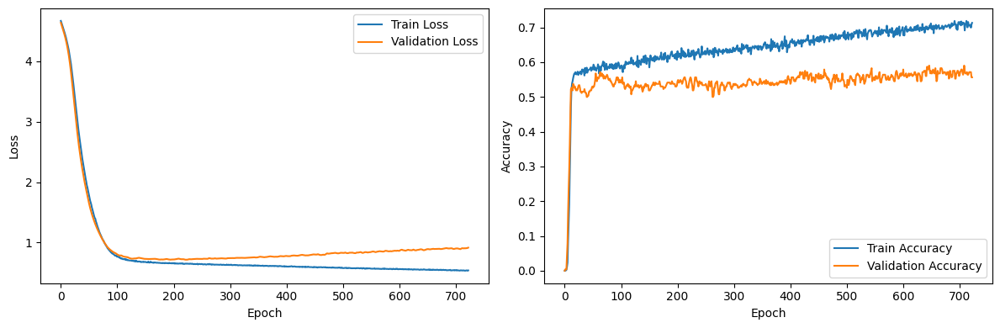


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1362, Val Loss: 4.0882, Train Acc: 0.5034, Val Acc: 0.5098
Epoch: 020, Train Loss: 3.4664, Val Loss: 3.4381, Train Acc: 0.5159, Val Acc: 0.5255
Epoch: 030, Train Loss: 2.5713, Val Loss: 2.6333, Train Acc: 0.5336, Val Acc: 0.5059
Epoch: 040, Train Loss: 1.9575, Val Loss: 2.0883, Train Acc: 0.5537, Val Acc: 0.5098
Epoch: 050, Train Loss: 1.5774, Val Loss: 1.7145, Train Acc: 0.5612, Val Acc: 0.4824
Epoch: 060, Train Loss: 1.3296, Val Loss: 1.4273, Train Acc: 0.5721, Val Acc: 0.5020
Epoch: 070, Train Loss: 1.1263, Val Loss: 1.2184, Train Acc: 0.5705, Val Acc: 0.4824
Epoch: 080, Train Loss: 0.9874, Val Loss: 1.0663, Train Acc: 0.5747, Val Acc: 0.4863
Epoch: 090, Train Loss: 0.8731, Val Loss: 0.9563, Train Acc: 0.5847, Val Acc: 0.4980
Epoch: 100, Train Loss: 0.8091, Val Loss: 0.8775, Train Acc: 0.5914, Val Acc: 0.5098
Epoch: 110, Train Loss: 0.7607, Val Loss: 0.8297, Tr

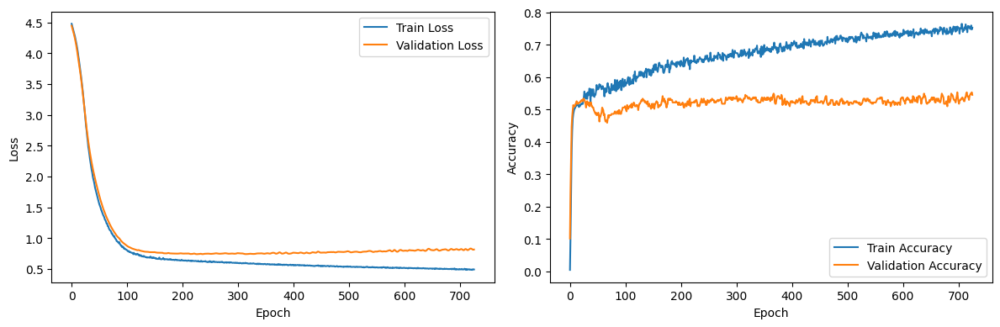


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3209, Val Loss: 4.3017, Train Acc: 0.3603, Val Acc: 0.4280
Epoch: 020, Train Loss: 3.6922, Val Loss: 3.6583, Train Acc: 0.5726, Val Acc: 0.5085
Epoch: 030, Train Loss: 2.8182, Val Loss: 2.8203, Train Acc: 0.5753, Val Acc: 0.5085
Epoch: 040, Train Loss: 2.1856, Val Loss: 2.1756, Train Acc: 0.5762, Val Acc: 0.4873
Epoch: 050, Train Loss: 1.7897, Val Loss: 1.7526, Train Acc: 0.5699, Val Acc: 0.5085
Epoch: 060, Train Loss: 1.4686, Val Loss: 1.4438, Train Acc: 0.5735, Val Acc: 0.5636
Epoch: 070, Train Loss: 1.2179, Val Loss: 1.1950, Train Acc: 0.5590, Val Acc: 0.5593
Epoch: 080, Train Loss: 0.9884, Val Loss: 1.0015, Train Acc: 0.5871, Val Acc: 0.5508
Epoch: 090, Train Loss: 0.8690, Val Loss: 0.8748, Train Acc: 0.5599, Val Acc: 0.5085
Epoch: 100, Train Loss: 0.7939, Val Loss: 0.7983, Train Acc: 0.5681, Val Acc: 0.5636
Epoch: 110, Train Loss: 0.7381, Val Loss: 0.7587, Tr

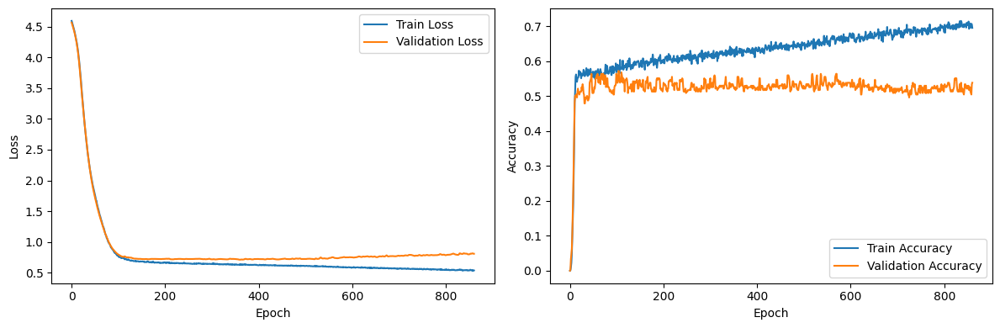


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1501, Val Loss: 4.1153, Train Acc: 0.5207, Val Acc: 0.5872
Epoch: 020, Train Loss: 3.4506, Val Loss: 3.3768, Train Acc: 0.5650, Val Acc: 0.5872
Epoch: 030, Train Loss: 2.6451, Val Loss: 2.5688, Train Acc: 0.5512, Val Acc: 0.5917
Epoch: 040, Train Loss: 2.0050, Val Loss: 1.9382, Train Acc: 0.5463, Val Acc: 0.6055
Epoch: 050, Train Loss: 1.6257, Val Loss: 1.5376, Train Acc: 0.5453, Val Acc: 0.6330
Epoch: 060, Train Loss: 1.3672, Val Loss: 1.2998, Train Acc: 0.5640, Val Acc: 0.5872
Epoch: 070, Train Loss: 1.1660, Val Loss: 1.1132, Train Acc: 0.5502, Val Acc: 0.5734
Epoch: 080, Train Loss: 1.0123, Val Loss: 0.9465, Train Acc: 0.5719, Val Acc: 0.6330
Epoch: 090, Train Loss: 0.8936, Val Loss: 0.8457, Train Acc: 0.5699, Val Acc: 0.6147
Epoch: 100, Train Loss: 0.8275, Val Loss: 0.8057, Train Acc: 0.5699, Val Acc: 0.5734
Epoch: 110, Train Loss: 0.7720, Val Loss: 0.7418, Tr

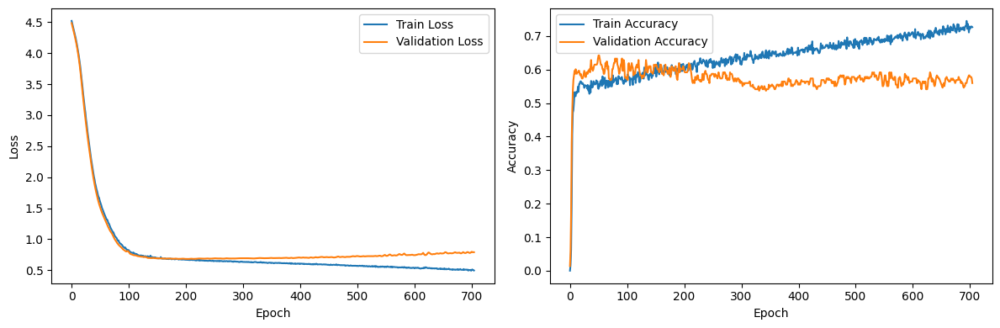


========== Run 28 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2149, Val Loss: 4.1717, Train Acc: 0.5600, Val Acc: 0.5639
Epoch: 020, Train Loss: 3.7191, Val Loss: 3.5910, Train Acc: 0.5931, Val Acc: 0.5414
Epoch: 030, Train Loss: 2.9365, Val Loss: 2.7550, Train Acc: 0.5818, Val Acc: 0.5639
Epoch: 040, Train Loss: 2.2586, Val Loss: 2.0808, Train Acc: 0.5721, Val Acc: 0.5489
Epoch: 050, Train Loss: 1.7581, Val Loss: 1.6241, Train Acc: 0.5633, Val Acc: 0.5526
Epoch: 060, Train Loss: 1.4054, Val Loss: 1.3373, Train Acc: 0.5802, Val Acc: 0.5564
Epoch: 070, Train Loss: 1.1526, Val Loss: 1.1221, Train Acc: 0.5770, Val Acc: 0.5451
Epoch: 080, Train Loss: 0.9810, Val Loss: 0.9745, Train Acc: 0.5737, Val Acc: 0.5639
Epoch: 090, Train Loss: 0.8572, Val Loss: 0.8708, Train Acc: 0.5842, Val Acc: 0.5977
Epoch: 100, Train Loss: 0.7883, Val Loss: 0.7984, Train Acc: 0.5915, Val Acc: 0.5827
Epoch: 110, Train Los

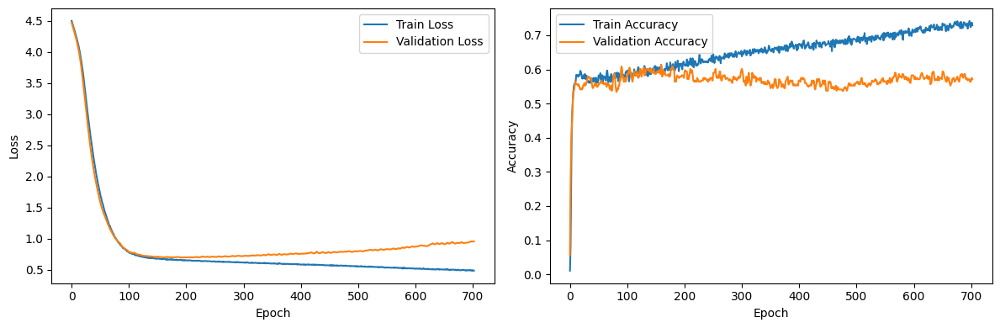


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2361, Val Loss: 4.1873, Train Acc: 0.2777, Val Acc: 0.2353
Epoch: 020, Train Loss: 3.4896, Val Loss: 3.5109, Train Acc: 0.5570, Val Acc: 0.5137
Epoch: 030, Train Loss: 2.5946, Val Loss: 2.7307, Train Acc: 0.5780, Val Acc: 0.5333
Epoch: 040, Train Loss: 2.0271, Val Loss: 2.1956, Train Acc: 0.5847, Val Acc: 0.5412
Epoch: 050, Train Loss: 1.6325, Val Loss: 1.7841, Train Acc: 0.5747, Val Acc: 0.5333
Epoch: 060, Train Loss: 1.3540, Val Loss: 1.4699, Train Acc: 0.5763, Val Acc: 0.5412
Epoch: 070, Train Loss: 1.1259, Val Loss: 1.2336, Train Acc: 0.5864, Val Acc: 0.5137
Epoch: 080, Train Loss: 0.9844, Val Loss: 1.0632, Train Acc: 0.6007, Val Acc: 0.5176
Epoch: 090, Train Loss: 0.8636, Val Loss: 0.9443, Train Acc: 0.5948, Val Acc: 0.4902
Epoch: 100, Train Loss: 0.7842, Val Loss: 0.8730, Train Acc: 0.5982, Val Acc: 0.5098
Epoch: 110, Train Loss: 0.7402, Val Loss: 0.8215, Tr

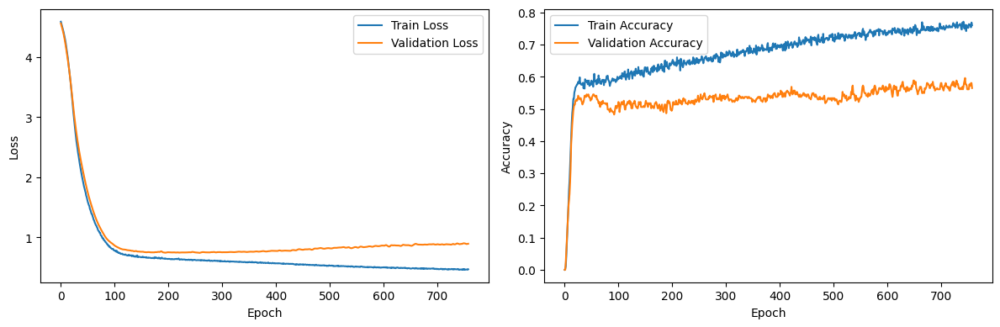


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2309, Val Loss: 4.2155, Train Acc: 0.5572, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.6681, Val Loss: 3.6743, Train Acc: 0.5581, Val Acc: 0.5085
Epoch: 030, Train Loss: 2.8012, Val Loss: 2.8382, Train Acc: 0.5535, Val Acc: 0.4958
Epoch: 040, Train Loss: 2.1802, Val Loss: 2.2020, Train Acc: 0.5372, Val Acc: 0.5000
Epoch: 050, Train Loss: 1.7359, Val Loss: 1.7250, Train Acc: 0.5544, Val Acc: 0.4746
Epoch: 060, Train Loss: 1.4316, Val Loss: 1.4313, Train Acc: 0.5608, Val Acc: 0.4788
Epoch: 070, Train Loss: 1.2056, Val Loss: 1.2052, Train Acc: 0.5381, Val Acc: 0.5339
Epoch: 080, Train Loss: 1.0242, Val Loss: 1.0413, Train Acc: 0.5544, Val Acc: 0.4661
Epoch: 090, Train Loss: 0.8859, Val Loss: 0.9201, Train Acc: 0.5644, Val Acc: 0.5042
Epoch: 100, Train Loss: 0.8001, Val Loss: 0.8401, Train Acc: 0.5780, Val Acc: 0.5169
Epoch: 110, Train Loss: 0.7548, Val Loss: 0.7952, Tr

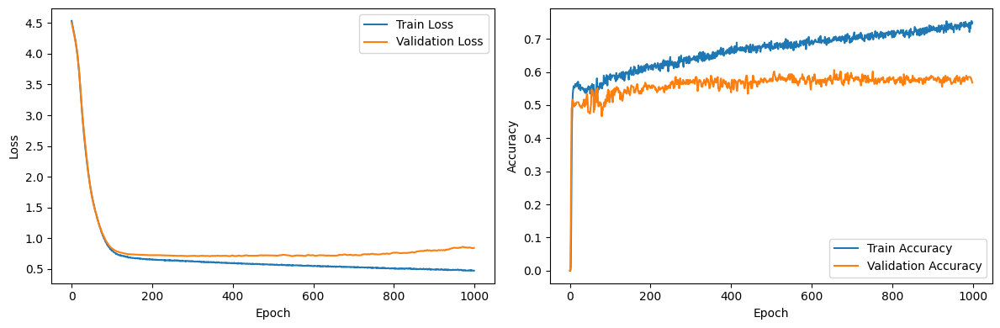


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.3275, Val Loss: 4.2955, Train Acc: 0.4459, Val Acc: 0.5000
Epoch: 020, Train Loss: 3.7352, Val Loss: 3.6495, Train Acc: 0.5374, Val Acc: 0.5413
Epoch: 030, Train Loss: 2.9317, Val Loss: 2.8703, Train Acc: 0.5315, Val Acc: 0.4862
Epoch: 040, Train Loss: 2.2749, Val Loss: 2.2560, Train Acc: 0.5325, Val Acc: 0.4908
Epoch: 050, Train Loss: 1.8333, Val Loss: 1.8028, Train Acc: 0.5433, Val Acc: 0.5092
Epoch: 060, Train Loss: 1.5214, Val Loss: 1.4577, Train Acc: 0.5650, Val Acc: 0.5642
Epoch: 070, Train Loss: 1.2876, Val Loss: 1.2136, Train Acc: 0.5679, Val Acc: 0.5367
Epoch: 080, Train Loss: 1.0932, Val Loss: 1.0335, Train Acc: 0.5719, Val Acc: 0.5505
Epoch: 090, Train Loss: 0.9519, Val Loss: 0.9017, Train Acc: 0.5728, Val Acc: 0.5917
Epoch: 100, Train Loss: 0.8573, Val Loss: 0.8121, Train Acc: 0.5748, Val Acc: 0.5550
Epoch: 110, Train Loss: 0.7791, Val Loss: 0.7575, Tr

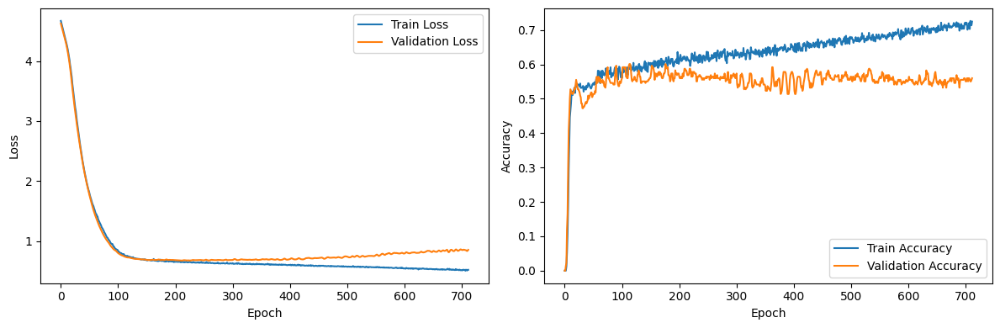


========== Run 29 ==========


Running experiment for year 2019...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2580, Val Loss: 4.2057, Train Acc: 0.5624, Val Acc: 0.5188
Epoch: 020, Train Loss: 3.6971, Val Loss: 3.5849, Train Acc: 0.5858, Val Acc: 0.5677
Epoch: 030, Train Loss: 2.9503, Val Loss: 2.7900, Train Acc: 0.5802, Val Acc: 0.5752
Epoch: 040, Train Loss: 2.2181, Val Loss: 2.0131, Train Acc: 0.5624, Val Acc: 0.5789
Epoch: 050, Train Loss: 1.6912, Val Loss: 1.5572, Train Acc: 0.5657, Val Acc: 0.5752
Epoch: 060, Train Loss: 1.3161, Val Loss: 1.2534, Train Acc: 0.5697, Val Acc: 0.5301
Epoch: 070, Train Loss: 1.0573, Val Loss: 1.0582, Train Acc: 0.5842, Val Acc: 0.5414
Epoch: 080, Train Loss: 0.9039, Val Loss: 0.9180, Train Acc: 0.5802, Val Acc: 0.5301
Epoch: 090, Train Loss: 0.8075, Val Loss: 0.8354, Train Acc: 0.5898, Val Acc: 0.5414
Epoch: 100, Train Loss: 0.7502, Val Loss: 0.7869, Train Acc: 0.5907, Val Acc: 0.5376
Epoch: 110, Train Los

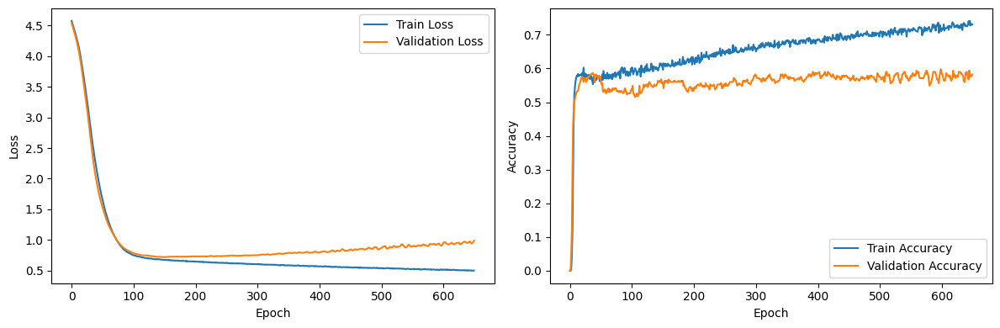


Running experiment for year 2020...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2361, Val Loss: 4.1966, Train Acc: 0.4983, Val Acc: 0.4980
Epoch: 020, Train Loss: 3.6334, Val Loss: 3.5665, Train Acc: 0.4950, Val Acc: 0.5059
Epoch: 030, Train Loss: 2.7314, Val Loss: 2.7228, Train Acc: 0.5159, Val Acc: 0.5098
Epoch: 040, Train Loss: 1.9448, Val Loss: 2.0411, Train Acc: 0.5302, Val Acc: 0.4784
Epoch: 050, Train Loss: 1.5301, Val Loss: 1.6519, Train Acc: 0.5596, Val Acc: 0.4784
Epoch: 060, Train Loss: 1.2768, Val Loss: 1.3718, Train Acc: 0.5805, Val Acc: 0.4980
Epoch: 070, Train Loss: 1.0980, Val Loss: 1.1750, Train Acc: 0.5629, Val Acc: 0.5137
Epoch: 080, Train Loss: 0.9360, Val Loss: 1.0273, Train Acc: 0.5847, Val Acc: 0.4941
Epoch: 090, Train Loss: 0.8528, Val Loss: 0.9286, Train Acc: 0.5822, Val Acc: 0.4980
Epoch: 100, Train Loss: 0.7837, Val Loss: 0.8678, Train Acc: 0.5872, Val Acc: 0.4941
Epoch: 110, Train Loss: 0.7477, Val Loss: 0.8257, Tr

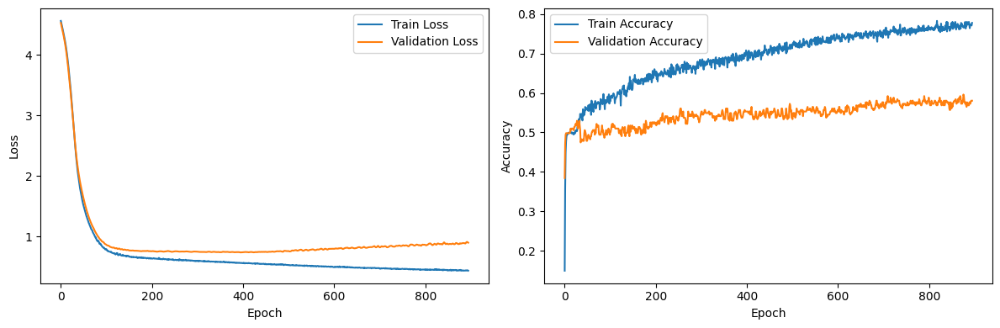


Running experiment for year 2021...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.1598, Val Loss: 4.1454, Train Acc: 0.5417, Val Acc: 0.4915
Epoch: 020, Train Loss: 3.4620, Val Loss: 3.4356, Train Acc: 0.5672, Val Acc: 0.4746
Epoch: 030, Train Loss: 2.4616, Val Loss: 2.4692, Train Acc: 0.5608, Val Acc: 0.5085
Epoch: 040, Train Loss: 1.9685, Val Loss: 1.9728, Train Acc: 0.5617, Val Acc: 0.5169
Epoch: 050, Train Loss: 1.6489, Val Loss: 1.6512, Train Acc: 0.5526, Val Acc: 0.5085
Epoch: 060, Train Loss: 1.3742, Val Loss: 1.3868, Train Acc: 0.5535, Val Acc: 0.5254
Epoch: 070, Train Loss: 1.1352, Val Loss: 1.1596, Train Acc: 0.5672, Val Acc: 0.5169
Epoch: 080, Train Loss: 0.9575, Val Loss: 0.9892, Train Acc: 0.5735, Val Acc: 0.5127
Epoch: 090, Train Loss: 0.8323, Val Loss: 0.8789, Train Acc: 0.5699, Val Acc: 0.5297
Epoch: 100, Train Loss: 0.7628, Val Loss: 0.8106, Train Acc: 0.5808, Val Acc: 0.5381
Epoch: 110, Train Loss: 0.7296, Val Loss: 0.7808, Tr

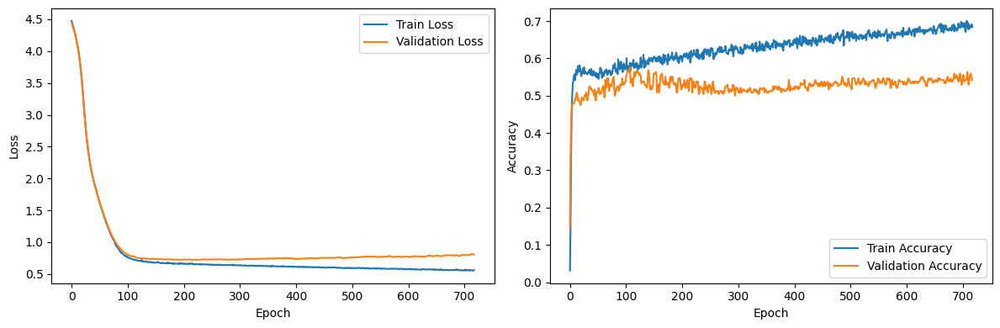


Running experiment for year 2022...

Using device: cuda
Input channels: 11, Number of classes: 2
Epoch: 010, Train Loss: 4.2179, Val Loss: 4.1910, Train Acc: 0.5049, Val Acc: 0.4954
Epoch: 020, Train Loss: 3.5369, Val Loss: 3.4853, Train Acc: 0.5226, Val Acc: 0.4587
Epoch: 030, Train Loss: 2.6641, Val Loss: 2.5980, Train Acc: 0.5197, Val Acc: 0.4587
Epoch: 040, Train Loss: 2.0360, Val Loss: 2.0053, Train Acc: 0.5226, Val Acc: 0.4587
Epoch: 050, Train Loss: 1.6452, Val Loss: 1.5876, Train Acc: 0.5522, Val Acc: 0.5229
Epoch: 060, Train Loss: 1.3927, Val Loss: 1.3146, Train Acc: 0.5738, Val Acc: 0.5780
Epoch: 070, Train Loss: 1.1700, Val Loss: 1.1255, Train Acc: 0.5561, Val Acc: 0.5550
Epoch: 080, Train Loss: 1.0120, Val Loss: 0.9730, Train Acc: 0.5679, Val Acc: 0.5459
Epoch: 090, Train Loss: 0.8853, Val Loss: 0.8623, Train Acc: 0.5650, Val Acc: 0.5780
Epoch: 100, Train Loss: 0.8152, Val Loss: 0.7969, Train Acc: 0.5728, Val Acc: 0.5780
Epoch: 110, Train Loss: 0.7644, Val Loss: 0.7689, Tr

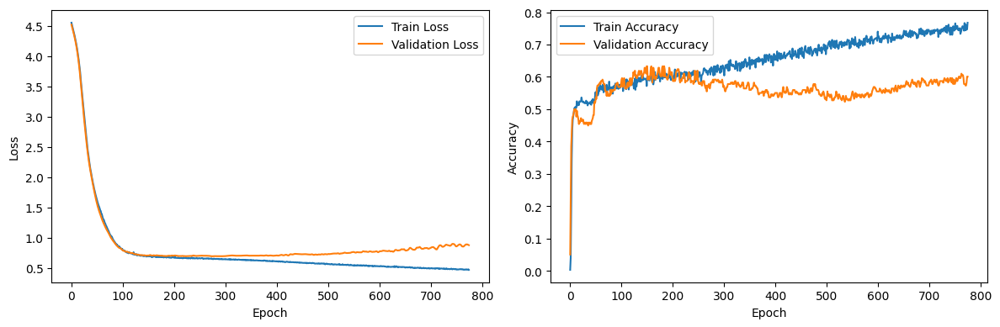


========== Final Summary ==========

Year: 2019
  Avg Test Accuracy: 0.5898 ± 0.0215
  Avg Test F1 Score: 0.5895 ± 0.0215
 Train Accuracy: 0.6175 ± 0.0110
Year: 2020
  Avg Test Accuracy: 0.6049 ± 0.0181
  Avg Test F1 Score: 0.6028 ± 0.0185
 Train Accuracy: 0.6461 ± 0.0191
Year: 2021
  Avg Test Accuracy: 0.5589 ± 0.0201
  Avg Test F1 Score: 0.5577 ± 0.0203
 Train Accuracy: 0.6319 ± 0.0206
Year: 2022
  Avg Test Accuracy: 0.5879 ± 0.0226
  Avg Test F1 Score: 0.5874 ± 0.0226
 Train Accuracy: 0.6217 ± 0.0173


In [8]:
if __name__ == "__main__":

    years = [2019, 2020, 2021, 2022]
    metric = 'revenue'

    # To store results for each year across 10 runs
    aggregate_results = {year: {'acc': [], 'f1': [], 'time': [], 'epochs': [], 'best_train_acc': []} for year in years}
    param = {
            "hidden_channels": 64,
            "out_channels": 32,
            "num_heads": 4,
            "lr": 0.0009,
            "weight_decay": 5e-4,
            "epochs": 1000,
            "patience": 500
        }

    #Add optuna code section here
    best_params_per_year = {}
    # for year in years:
    #     print(f"\nRunning Optuna optimization for year {year}...\n")
    
    #     study = optuna.create_study(direction="maximize")
    #     study.optimize(lambda trial: objective(trial, year, metric), n_trials=15)
    
    #     print(f"Best trial for year {year}: {study.best_trial.value}")
    #     print("Best hyperparameters:", study.best_params)

    #     best_params_per_year[year] = study.best_params
    
    for i in range(1, 30):
        print(f"\n========== Run {i} ==========\n")
        for year in years:
            # param = best_params_per_year[year]
            print(f"\nRunning experiment for year {year}...\n")
            results = run_experiment(year, metric, **param)
            # Store individual run metrics
            aggregate_results[year]['acc'].append(results['test_acc'])
            aggregate_results[year]['f1'].append(results['test_f1'])
            aggregate_results[year]['time'].append(results['training_time'])
            aggregate_results[year]['epochs'].append(results['epochs_run'])
            aggregate_results[year]['best_train_acc'].append(results['best_train_acc'])

    print("\n========== Final Summary ==========\n")
    for year in years:
        acc_mean = np.mean(aggregate_results[year]['acc'])
        acc_std = np.std(aggregate_results[year]['acc'])
        f1_mean = np.mean(aggregate_results[year]['f1'])
        f1_std = np.std(aggregate_results[year]['f1'])
        train_acc_mean = np.mean(aggregate_results[year]['best_train_acc'])
        train_acc_std = np.std(aggregate_results[year]['best_train_acc'])

        print(f"Year: {year}")
        print(f"  Avg Test Accuracy: {acc_mean:.4f} ± {acc_std:.4f}")
        print(f"  Avg Test F1 Score: {f1_mean:.4f} ± {f1_std:.4f}")
        print(f" Train Accuracy: {train_acc_mean:.4f} ± {train_acc_std:.4f}")